# 아스파라거스
## 박가문날비, 윤선영, 최지현
### Data mining, Machine learning

## 1. 임포트

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px
# import koreanize_matplotlib
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## 2. 데이터 로드

In [2]:
df = pd.read_csv('./경진대회용 주조 공정최적화 데이터셋.csv', encoding='cp949', index_col=0)
df.head()

,line,name,mold_name,time,date,count,working,emergency_stop,molten_temp,facility_operation_cycleTime,...,lower_mold_temp3,sleeve_temperature,physical_strength,Coolant_temperature,EMS_operation_time,registration_time,passorfail,tryshot_signal,mold_code,heating_furnace
0,전자교반 3라인 2호기,TM Carrier RH,TM Carrier RH-Semi-Solid DIE-06,2019-01-02,16:45:06,258,가동,ON,731.0,119,...,1449.0,550.0,700.0,34.0,23,2019-01-02 16:45:06,0.0,NaN,8722,NaN
1,전자교반 3라인 2호기,TM Carrier RH,TM Carrier RH-Semi-Solid DIE-06,2019-01-02,16:45:08,243,가동,ON,720.0,98,...,NaN,481.0,0.0,30.0,25,2019-01-02 16:45:08,0.0,NaN,8412,B
2,전자교반 3라인 2호기,TM Carrier RH,TM Carrier RH-Semi-Solid DIE-06,2019-01-02,16:45:58,244,가동,ON,721.0,98,...,NaN,481.0,0.0,30.0,25,2019-01-02 16:45:58,0.0,NaN,8412,B
3,전자교반 3라인 2호기,TM Carrier RH,TM Carrier RH-Semi-Solid DIE-06,2019-01-02,16:48:03,245,가동,ON,721.0,100,...,NaN,483.0,0.0,30.0,25,2019-01-02 16:48:03,0.0,NaN,8412,B
4,전자교반 3라인 2호기,TM Carrier RH,TM Carrier RH-Semi-Solid DIE-06,2019-01-02,16:50:08,246,가동,ON,721.0,99,...,NaN,486.0,0.0,30.0,25,2019-01-02 16:50:08,0.0,NaN,8412,B


### 2-1. 데이터 전처리

In [3]:
df.columns

Index(['line', 'name', 'mold_name', 'time', 'date', 'count', 'working',
       'emergency_stop', 'molten_temp', 'facility_operation_cycleTime',
       'production_cycletime', 'low_section_speed', 'high_section_speed',
       'molten_volume', 'cast_pressure', 'biscuit_thickness',
       'upper_mold_temp1', 'upper_mold_temp2', 'upper_mold_temp3',
       'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3',
       'sleeve_temperature', 'physical_strength', 'Coolant_temperature',
       'EMS_operation_time', 'registration_time', 'passorfail',
       'tryshot_signal', 'mold_code', 'heating_furnace'],
      dtype='object')

In [4]:
df_uni = {'line': [], 'name':[], 'mold_name':[], 'time':[], 'date':[], 'count':[], 'working':[],'emergency_stop':[], 'molten_temp':[],
          'facility_operation_cycleTime':[],'production_cycletime':[], 'low_section_speed':[], 'high_section_speed':[],'molten_volume':[],
          'cast_pressure':[], 'biscuit_thickness':[],'upper_mold_temp1':[], 'upper_mold_temp2':[], 'upper_mold_temp3':[],'lower_mold_temp1':[],
          'lower_mold_temp2':[], 'lower_mold_temp3':[],'sleeve_temperature':[], 'physical_strength':[], 'Coolant_temperature':[],
          'EMS_operation_time':[], 'registration_time':[], 'passorfail':[],'tryshot_signal':[], 'mold_code':[], 'heating_furnace':[]}
# df_uni
for i in df.columns:
    df_uni[i].append(df[i].unique())
    df_uni[i].append(len(df[i].unique()))

df_uni_1 = pd.DataFrame(df_uni)
df_uni_1

,line,name,mold_name,time,date,count,working,emergency_stop,molten_temp,facility_operation_cycleTime,...,lower_mold_temp3,sleeve_temperature,physical_strength,Coolant_temperature,EMS_operation_time,registration_time,passorfail,tryshot_signal,mold_code,heating_furnace
0,[전자교반 3라인 2호기],[TM Carrier RH],[TM Carrier RH-Semi-Solid DIE-06],"[2019-01-02, 2019-01-03, 2019-01-04, 2019-01-0...","[16:45:06, 16:45:08, 16:45:58, 16:48:03, 16:50...","[258, 243, 244, 245, 246, 247, 248, 249, 250, ...","[가동, 정지, nan]","[ON, nan]","[731.0, 720.0, 721.0, 722.0, 723.0, 719.0, 718...","[119, 98, 100, 99, 104, 101, 102, 120, 153, 12...",...,"[1449.0, nan, 644.0, 646.0, 645.0, 649.0, 651....","[550.0, 481.0, 483.0, 486.0, 485.0, 474.0, 478...","[700.0, 0.0, 708.0, 707.0, 706.0, 699.0, 692.0...","[34.0, 30.0, 31.0, 35.0, 36.0, 22.0, 23.0, 24....","[23, 25, 0, 3, 6]","[2019-01-02 16:45:06, 2019-01-02 16:45:08, 201...","[0.0, 1.0, nan]","[nan, D]","[8722, 8412, 8573, 8917, 8600, 8413, 8576]","[nan, B, A]"
1,1,1,1,85,54640,334,3,2,114,195,...,315,591,107,36,5,91722,3,2,7,3


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92015 entries, 0 to 92014
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   line                          92015 non-null  object 
 1   name                          92015 non-null  object 
 2   mold_name                     92015 non-null  object 
 3   time                          92015 non-null  object 
 4   date                          92015 non-null  object 
 5   count                         92015 non-null  int64  
 6   working                       92014 non-null  object 
 7   emergency_stop                92014 non-null  object 
 8   molten_temp                   89754 non-null  float64
 9   facility_operation_cycleTime  92015 non-null  int64  
 10  production_cycletime          92015 non-null  int64  
 11  low_section_speed             92014 non-null  float64
 12  high_section_speed            92014 non-null  float64
 13  m

In [6]:
# (1-(1919/ 92015))*100
(1-(42869/ 92015))*100

53.41085692550127

### 2-1-1. 가이드북 전차리
- 가이드북에서는 먼저 숫자형 변수만 사용
- molten_volume의 결측값이 많아서 column 삭제
- T-test를 통해 귀무가설 ~ ~ ~
    - facility_operation_cycleTime 제거
    - 그걸 제거하는게 맞을까? 이게 필요할수도 있지 않을까?
- 가이드북에서는 불필요하다는 이유로 count, mold_code 제거
- EMS_operation_time도 제거
    - heatmap에서 없어짐

In [7]:
df.columns

Index(['line', 'name', 'mold_name', 'time', 'date', 'count', 'working',
       'emergency_stop', 'molten_temp', 'facility_operation_cycleTime',
       'production_cycletime', 'low_section_speed', 'high_section_speed',
       'molten_volume', 'cast_pressure', 'biscuit_thickness',
       'upper_mold_temp1', 'upper_mold_temp2', 'upper_mold_temp3',
       'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3',
       'sleeve_temperature', 'physical_strength', 'Coolant_temperature',
       'EMS_operation_time', 'registration_time', 'passorfail',
       'tryshot_signal', 'mold_code', 'heating_furnace'],
      dtype='object')

### 2-1-2. 아스파라거스 전처리

- line, name, mold_name 값이 하나로 모두 동일하기 때문에 사용 안함
- time, date, registration_time 중 registration_time만 사용

In [8]:
df1 = df[['registration_time', 'count', 'working', 'emergency_stop', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime',
    'low_section_speed', 'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1',
    'upper_mold_temp2', 'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature',
    'physical_strength', 'Coolant_temperature', 'EMS_operation_time', 'passorfail', 'tryshot_signal',
    'mold_code', 'heating_furnace']]

#### object type에서 datetime으로 타입 변경

In [9]:
df1['registration_time'] = pd.to_datetime(df1['registration_time'],
                                       format='%Y-%m-%d %H:%M:%S', errors='raise')
# 2019-03-31 23:59:48
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92015 entries, 0 to 92014
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   registration_time             92015 non-null  datetime64[ns]
 1   count                         92015 non-null  int64         
 2   working                       92014 non-null  object        
 3   emergency_stop                92014 non-null  object        
 4   molten_temp                   89754 non-null  float64       
 5   facility_operation_cycleTime  92015 non-null  int64         
 6   production_cycletime          92015 non-null  int64         
 7   low_section_speed             92014 non-null  float64       
 8   high_section_speed            92014 non-null  float64       
 9   molten_volume                 46885 non-null  float64       
 10  cast_pressure                 92014 non-null  float64       
 11  biscuit_thickness           

In [10]:
df1.isnull().sum()

registration_time                   0
count                               0
working                             1
emergency_stop                      1
molten_temp                      2261
facility_operation_cycleTime        0
production_cycletime                0
low_section_speed                   1
high_section_speed                  1
molten_volume                   45130
cast_pressure                       1
biscuit_thickness                   1
upper_mold_temp1                    1
upper_mold_temp2                    1
upper_mold_temp3                  313
lower_mold_temp1                    1
lower_mold_temp2                    1
lower_mold_temp3                  313
sleeve_temperature                  1
physical_strength                   1
Coolant_temperature                 1
EMS_operation_time                  0
passorfail                          1
tryshot_signal                  90096
mold_code                           0
heating_furnace                 49146
dtype: int64

### 2-1-3. null값 처리
- molten_volume, molten_temp, upper_mold_temp3, lower_mold_temp3가 값이 중간중간 비어있는 이유는 뭘까?
- 동일한 값이면 처음만 데이터를 넣고 그 다음부터는 데이터를 넣지 않는 것이 아닐까?

In [11]:
df1['molten_volume'] = df1['molten_volume'].fillna(method='ffill')
df1['molten_temp'] = df1['molten_temp'].fillna(method='ffill')
df1['upper_mold_temp3'] = df1['upper_mold_temp3'].fillna(method='ffill')
df1['lower_mold_temp3'] = df1['lower_mold_temp3'].fillna(method='ffill')

In [12]:
df1.isnull().sum()

registration_time                   0
count                               0
working                             1
emergency_stop                      1
molten_temp                         0
facility_operation_cycleTime        0
production_cycletime                0
low_section_speed                   1
high_section_speed                  1
molten_volume                       0
cast_pressure                       1
biscuit_thickness                   1
upper_mold_temp1                    1
upper_mold_temp2                    1
upper_mold_temp3                    0
lower_mold_temp1                    1
lower_mold_temp2                    1
lower_mold_temp3                    0
sleeve_temperature                  1
physical_strength                   1
Coolant_temperature                 1
EMS_operation_time                  0
passorfail                          1
tryshot_signal                  90096
mold_code                           0
heating_furnace                 49146
dtype: int64

In [13]:
df1['working'] = df1['working'].replace({'가동': 1, '정지': 0})

In [14]:
df2 = df1[['registration_time', 'count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
           'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2', 'upper_mold_temp3',
           'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength', 'Coolant_temperature', 
           'EMS_operation_time', 'passorfail', 'mold_code', 'tryshot_signal', 'heating_furnace']]

In [15]:
# 19327dl이때 뭔일이 있섯는대
df2[19326:19328]

,registration_time,count,working,molten_temp,facility_operation_cycleTime,production_cycletime,low_section_speed,high_section_speed,molten_volume,cast_pressure,...,lower_mold_temp2,lower_mold_temp3,sleeve_temperature,physical_strength,Coolant_temperature,EMS_operation_time,passorfail,mold_code,tryshot_signal,heating_furnace
19326,2019-01-25 19:00:07,279,1.0,722.0,119,123,110.0,111.0,100.0,331.0,...,196.0,1449.0,370.0,700.0,31.0,23,1.0,8722,NaN,NaN
19327,2019-01-25 19:09:09,281,NaN,722.0,0,0,NaN,NaN,99.0,NaN,...,NaN,1449.0,NaN,NaN,NaN,0,NaN,8722,NaN,NaN


In [16]:
# 일단 드랍
df3 = df2.drop(19327)
df3.reset_index(drop=True, inplace=True)
# df3.loc[19326:19328]

In [17]:
df3.isnull().sum()

registration_time                   0
count                               0
working                             0
molten_temp                         0
facility_operation_cycleTime        0
production_cycletime                0
low_section_speed                   0
high_section_speed                  0
molten_volume                       0
cast_pressure                       0
biscuit_thickness                   0
upper_mold_temp1                    0
upper_mold_temp2                    0
upper_mold_temp3                    0
lower_mold_temp1                    0
lower_mold_temp2                    0
lower_mold_temp3                    0
sleeve_temperature                  0
physical_strength                   0
Coolant_temperature                 0
EMS_operation_time                  0
passorfail                          0
mold_code                           0
tryshot_signal                  90095
heating_furnace                 49145
dtype: int64

In [18]:
df3['passorfail'].value_counts(dropna=False).to_frame('갯수').join(
    df3['passorfail'].value_counts(dropna=False, normalize=True).to_frame('비율')
).round(4)

,갯수,비율
0.0,87998,0.9564
1.0,4016,0.0436


In [19]:
df4 = df3[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]

<Axes: >

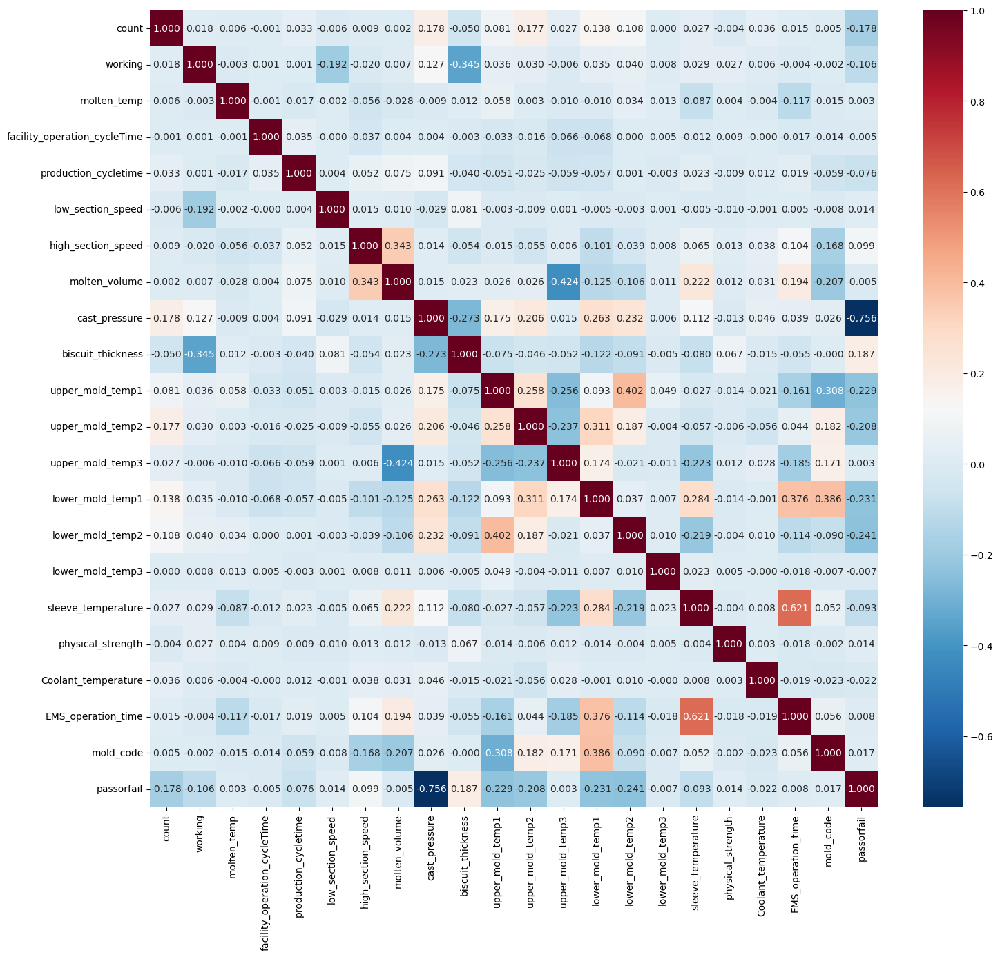

In [154]:
plt.figure(figsize=(17,15))
sns.heatmap(df4.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

In [155]:
df4.describe().T

,count,mean,std,min,25%,50%,75%,max
count,92014.0,148.509455,87.969347,1.0,72.0,146.0,222.0,334.0
working,92014.0,0.999446,0.023536,0.0,1.0,1.0,1.0,1.0
molten_temp,92014.0,718.245441,52.457758,0.0,712.0,728.0,730.0,735.0
facility_operation_cycleTime,92014.0,121.556328,12.109582,69.0,117.0,119.0,122.0,457.0
production_cycletime,92014.0,122.515856,13.589387,0.0,119.0,121.0,123.0,485.0
low_section_speed,92014.0,110.794999,305.181962,0.0,110.0,110.0,110.0,65535.0
high_section_speed,92014.0,112.624959,10.759272,0.0,112.0,112.0,112.0,388.0
molten_volume,92014.0,374.159834,859.227361,0.0,51.0,72.0,91.0,2767.0
cast_pressure,92014.0,324.554535,27.327683,41.0,329.0,330.0,331.0,348.0
biscuit_thickness,92014.0,50.666486,17.925620,0.0,47.0,50.0,53.0,422.0


In [156]:
box_col = ['count', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
       'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
       'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature',
       'physical_strength', 'Coolant_temperature', 'EMS_operation_time', 'mold_code']

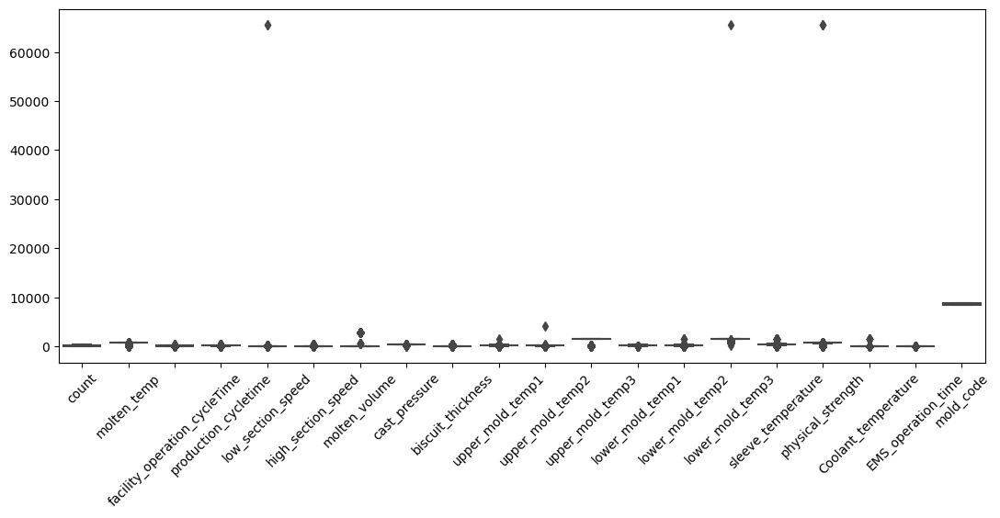

In [157]:
plt.figure(figsize=(13, 5))
sns.boxplot(data=df3[box_col])
plt.xticks(rotation=45)  # x축 레이블 회전
plt.show()

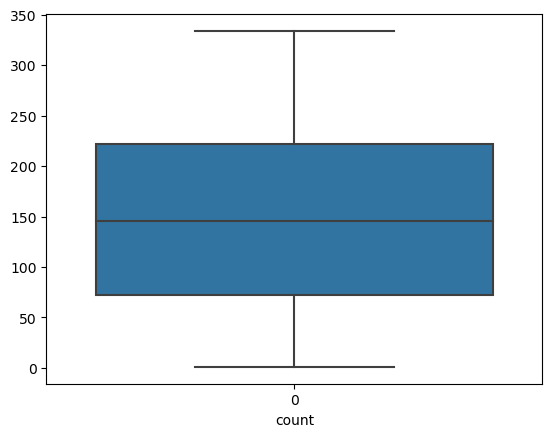

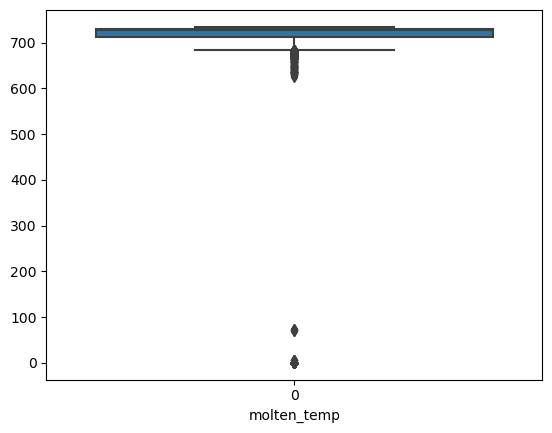

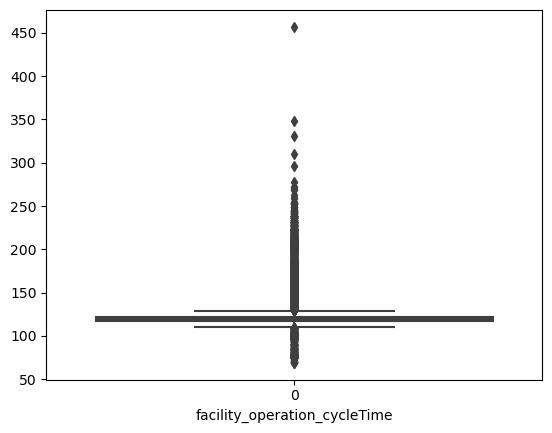

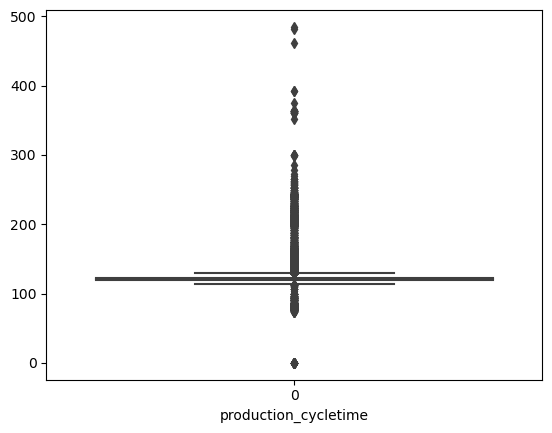

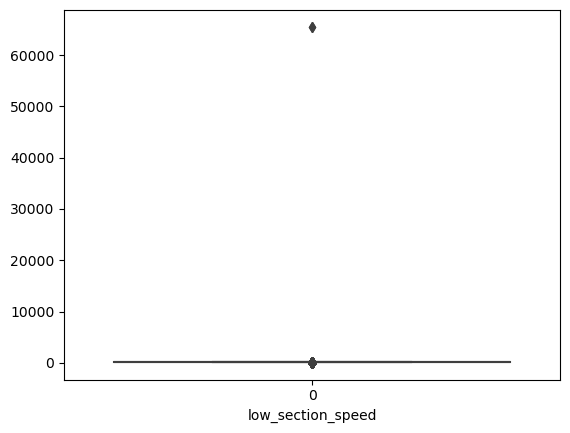

...

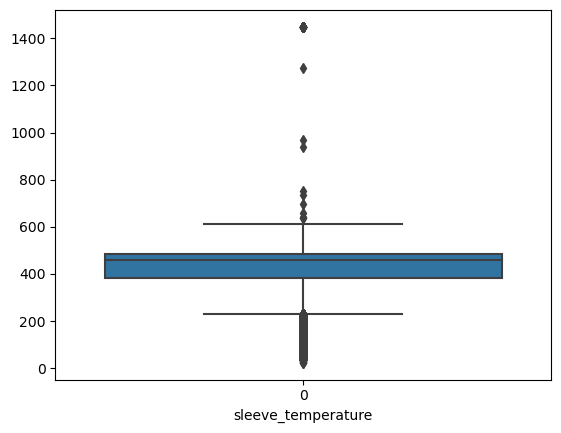

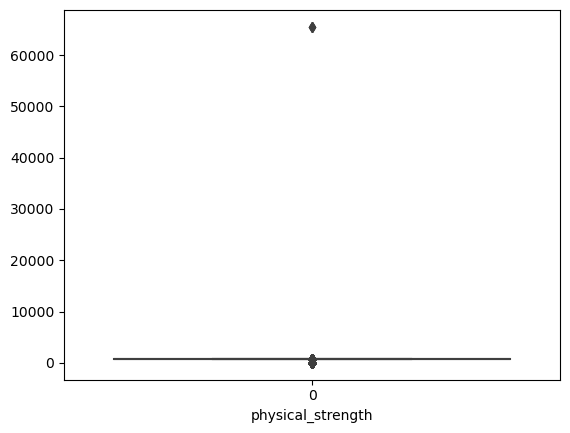

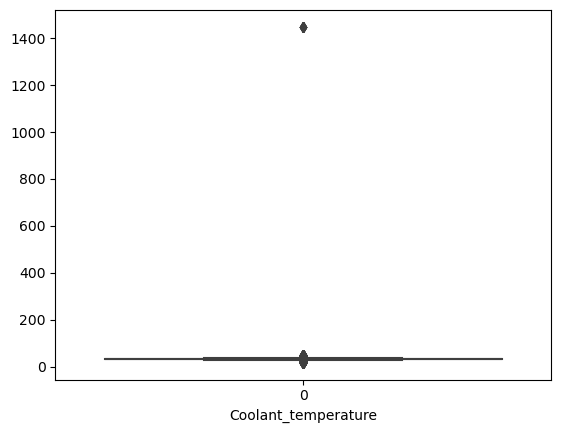

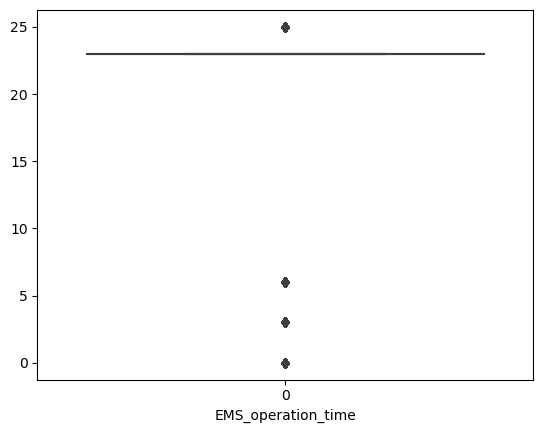

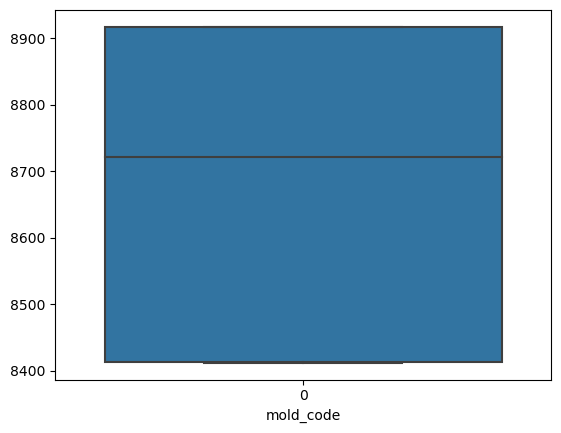

In [159]:
for i in box_col:
#     plt.figure(figsize=(6, 4))
    sns.boxplot(data=df3[i])
    plt.xlabel(i)
    plt.show()
    print()

In [160]:
from sklearn import tree

X=df4.drop('passorfail',axis=1)  
Y=df4['passorfail']

# train test splitting
from sklearn.model_selection import train_test_split

# stratify로 비율 유지
X_train, X_test,y_train,y_test=train_test_split(X,Y, test_size=0.20, random_state=1, stratify=Y)

In [164]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report


dt_clf = DecisionTreeClassifier(random_state=1)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

DecisionTreeClassifier: 0.9879
DecisionTreeClassifier F1-score : 0.8618


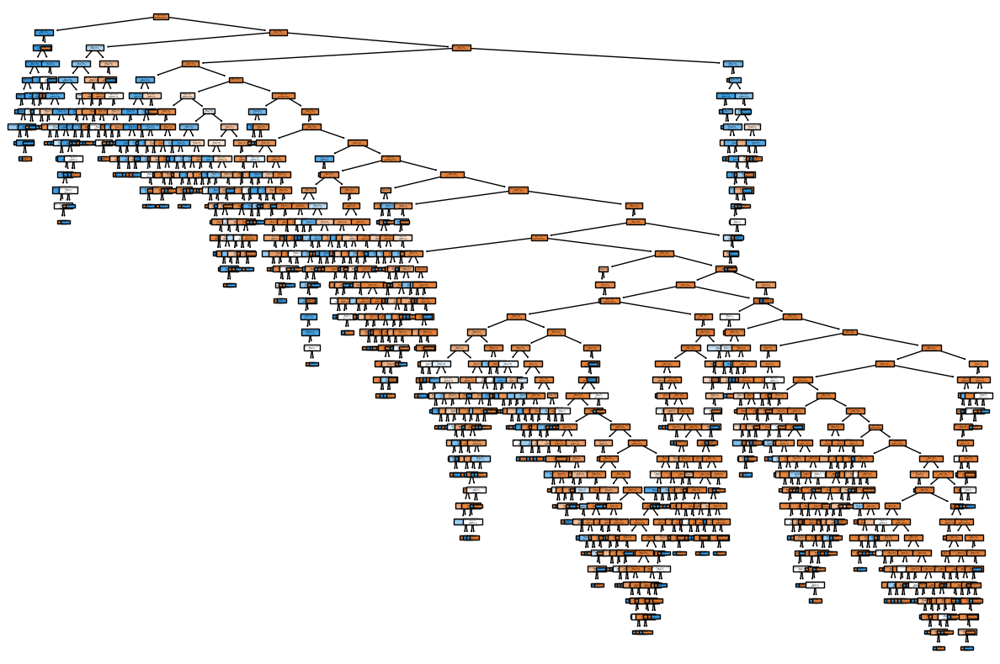

In [165]:
features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree__4.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

Text(112.22222222222227, 0.5, 'Predicted values')

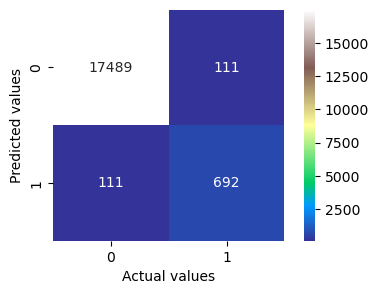

In [166]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plt.figure(figsize=(5,3))
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

In [ ]:
# depth = 10
# DecisionTreeClassifier: 0.9885
# DecisionTreeClassifier F1-score : 0.8548

# depth = 5
# DecisionTreeClassifier: 0.9875
# DecisionTreeClassifier F1-score : 0.8387

# depth = 4    
# DecisionTreeClassifier: 0.9876
# DecisionTreeClassifier F1-score : 0.8406
    
# depth = 3
# DecisionTreeClassifier: 0.9860
# DecisionTreeClassifier F1-score : 0.8168

In [187]:
dt_clf = DecisionTreeClassifier(max_depth=4, random_state=1)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

DecisionTreeClassifier: 0.9876
DecisionTreeClassifier F1-score : 0.8406


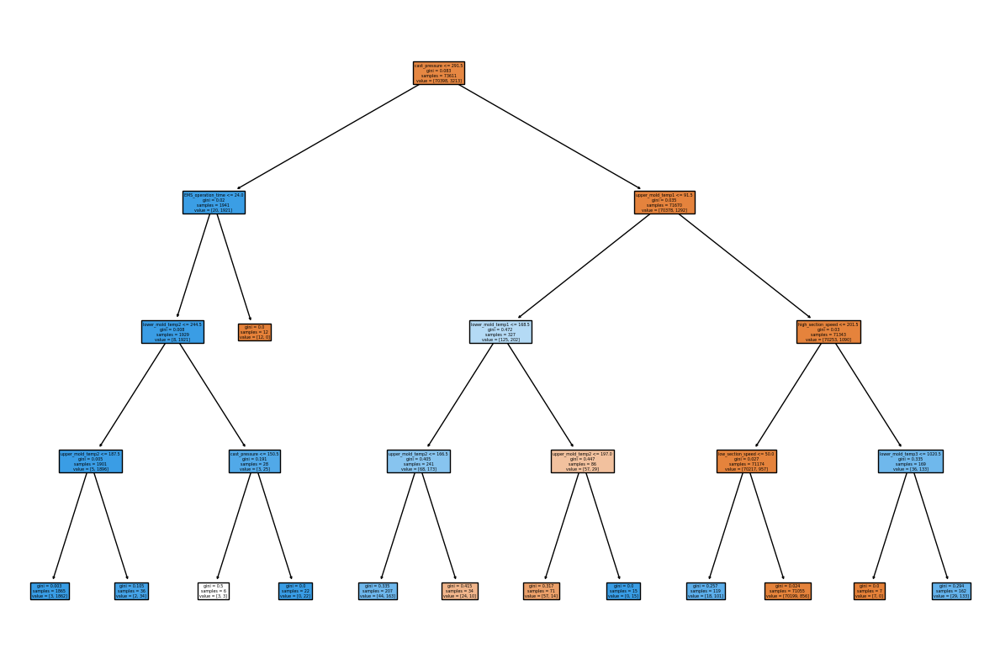

In [188]:
features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree__4_dep4_1.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [175]:
print(tree.export_text(dt_clf, feature_names=features))

|--- cast_pressure <= 291.50
|   |--- EMS_operation_time <= 24.00
|   |   |--- lower_mold_temp2 <= 244.50
|   |   |   |--- upper_mold_temp2 <= 187.50
|   |   |   |   |--- class: 1.0
|   |   |   |--- upper_mold_temp2 >  187.50
|   |   |   |   |--- class: 1.0
|   |   |--- lower_mold_temp2 >  244.50
|   |   |   |--- cast_pressure <= 150.50
|   |   |   |   |--- class: 0.0
|   |   |   |--- cast_pressure >  150.50
|   |   |   |   |--- class: 1.0
|   |--- EMS_operation_time >  24.00
|   |   |--- class: 0.0
|--- cast_pressure >  291.50
|   |--- upper_mold_temp1 <= 91.50
|   |   |--- lower_mold_temp1 <= 168.50
|   |   |   |--- upper_mold_temp2 <= 166.50
|   |   |   |   |--- class: 1.0
|   |   |   |--- upper_mold_temp2 >  166.50
|   |   |   |   |--- class: 0.0
|   |   |--- lower_mold_temp1 >  168.50
|   |   |   |--- upper_mold_temp2 <= 197.00
|   |   |   |   |--- class: 0.0
|   |   |   |--- upper_mold_temp2 >  197.00
|   |   |   |   |--- class: 1.0
|   |--- upper_mold_temp1 >  91.50
|   |   |---

Text(112.22222222222227, 0.5, 'Predicted values')

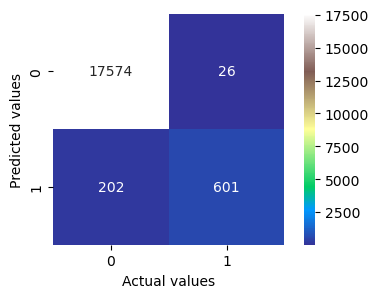

In [174]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plt.figure(figsize=(5,3))
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

## 3. 데이터 나눠 분석

- 데이터 null 값을 봤을 때 tryshot_signal과 heating_furnace의 결측치가 상당히 많음
    - 왜 이렇게 많을까?
    - tryshot_signal : 사탕신호
      - 주조 신호를 의미함.
      -  보통. 새로운 금형을 테스트하거나 금형을 조정한 후에 품질을 확인하기 위해 시범적으로 주조하는 과정을 의미함.
      -  결국 사탕신호의 값이 있다는 것은 테스트를 해본 것이 아닐까?
      -  그럼 빼보고 해보자 넣어놓고 해놓자
    - heating_furnace : 가열로
- tryshot_signal(NaN, D)와 heating_furnace(NaN, A, B)의 경우의 수 조사

In [20]:
ts_d = df3['tryshot_signal'] == 'D'
hf_b = df3['heating_furnace'] == 'B'
hf_a = df3['heating_furnace'] == 'A'

### 3-1. ('tryshot_signal' == D) && ('heating_furnace' == NaN)

In [21]:
df_dn = df3[ts_d & ~(hf_b|hf_a)]
# df_dn
print(df_dn.shape[0])

1142


In [22]:
df_dn = df_dn[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_dn

#### 3-1-1. unique 값 확인

In [23]:
col = df_dn.columns
for i in col:
    uni = df_dn[i].unique()
    if len(uni) == 1:
        print(i, ' : ', uni)
        print(len(uni))
        print()
    

upper_mold_temp3  :  [1449.]
1

EMS_operation_time  :  [23]
1

passorfail  :  [1.]
1



#### 3-1-2. Heatmap

<Axes: >

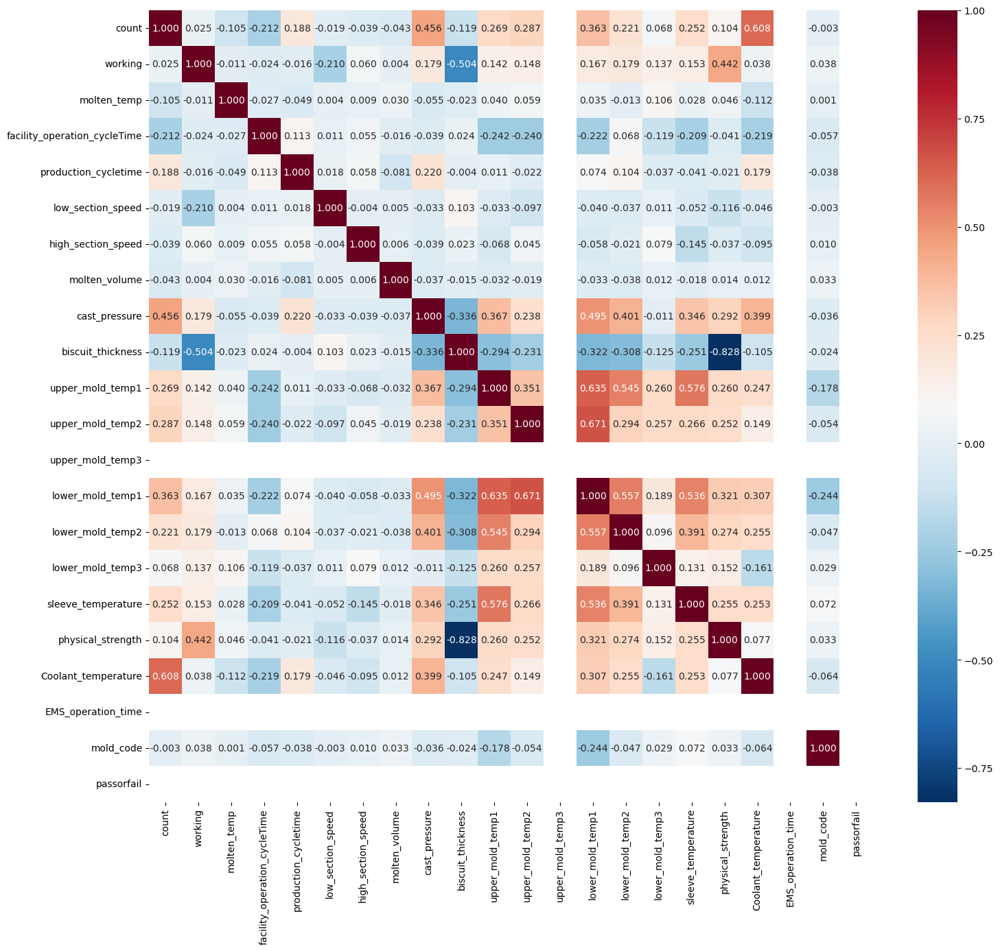

In [24]:
plt.figure(figsize=(17,15))
sns.heatmap(df_dn.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

### 3-2. ('tryshot_signal' == D) && ('heating_furnace' == A)

In [25]:
df_da = df3[ts_d & hf_a]
# df_dn
print(df_da.shape[0])

340


In [26]:
df_da = df_da[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_dn

#### 3-2-1. unique 값 확인

In [27]:
col = df_da.columns
for i in col:
    uni = df_da[i].unique()
    if len(uni) == 1:
        print(i, ' : ', uni)
        print(len(uni))
        print()
    

working  :  [1.]
1

upper_mold_temp3  :  [1449.]
1

lower_mold_temp3  :  [1449.]
1

passorfail  :  [1.]
1



#### 3-2-2. Heatmap

<Axes: >

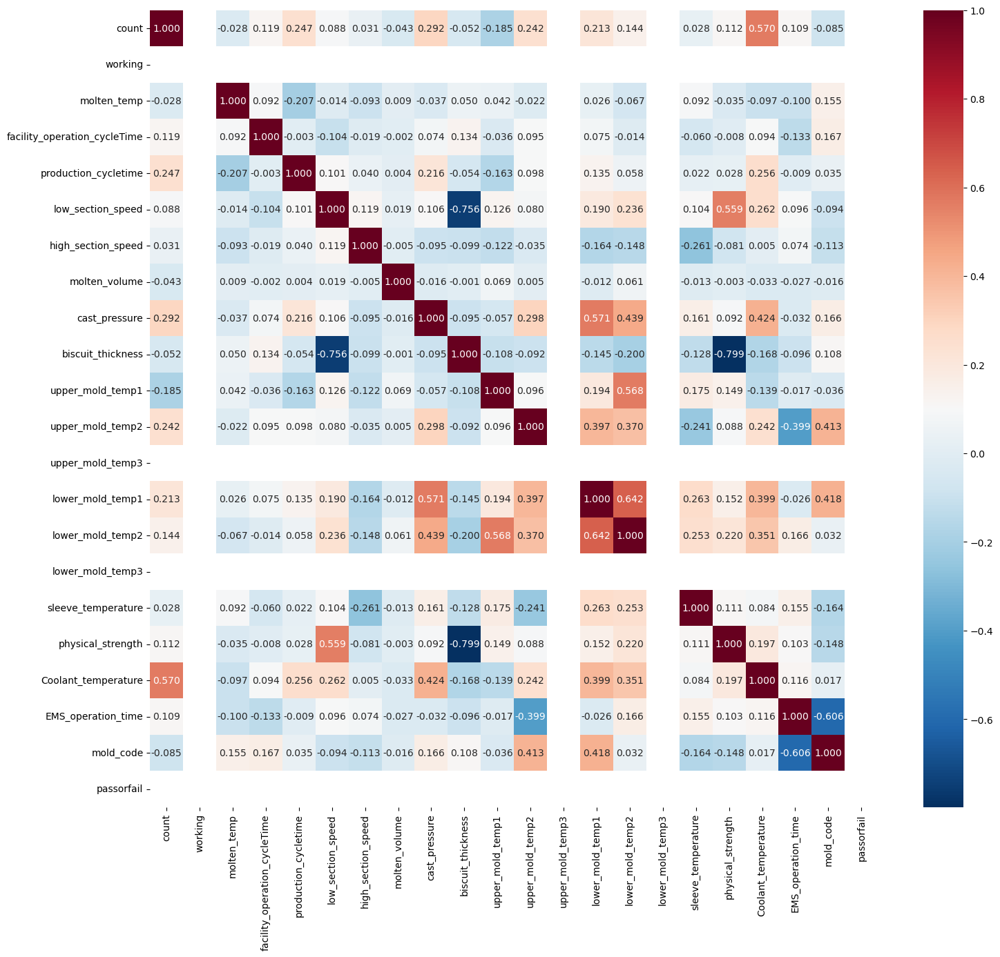

In [28]:
plt.figure(figsize=(17,15))
sns.heatmap(df_da.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

### 3-3. ('tryshot_signal' == D) && ('heating_furnace' == B)

In [29]:
df_db = df3[ts_d & hf_b]
# df_dn
print(df_db.shape[0])

437


In [30]:
df_db = df_db[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_dn

#### 3-3-1. unique 값 확인

In [31]:
col = df_db.columns
for i in col:
    uni = df_db[i].unique()
    if len(uni) == 1:
        print(i, ' : ', uni)
        print(len(uni))
        print()
    

upper_mold_temp3  :  [1449.]
1

lower_mold_temp3  :  [1449.]
1

passorfail  :  [1.]
1



#### 3-3-2. Heatmap

<Axes: >

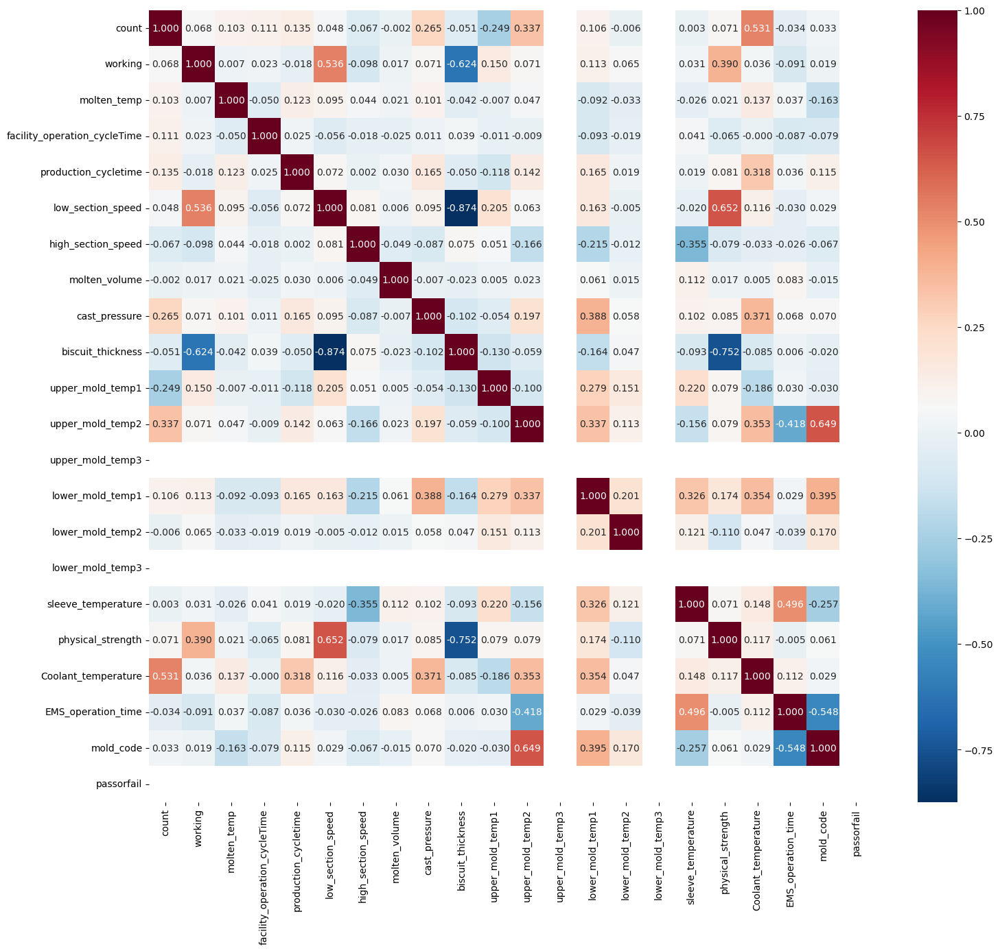

In [32]:
plt.figure(figsize=(17,15))
sns.heatmap(df_db.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

### 3-4. ('tryshot_signal' == NaN) && ('heating_furnace' == NaN)

In [33]:
df_nn = df3[~ts_d & ~(hf_b|hf_a)]
# df_nn
print(df_nn.shape[0])

48003


In [34]:
df_nn = df_nn[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_nn

#### 3-4-1. unique 값 확인

In [35]:
col = df_nn.columns
for i in col:
    uni = df_nn[i].unique()
    if len(uni) == 1:
        print(i, ' : ', uni)
        print(len(uni))
        print()
    

upper_mold_temp3  :  [1449.]
1

EMS_operation_time  :  [23]
1



#### 3-4-2. Heatmap

<Axes: >

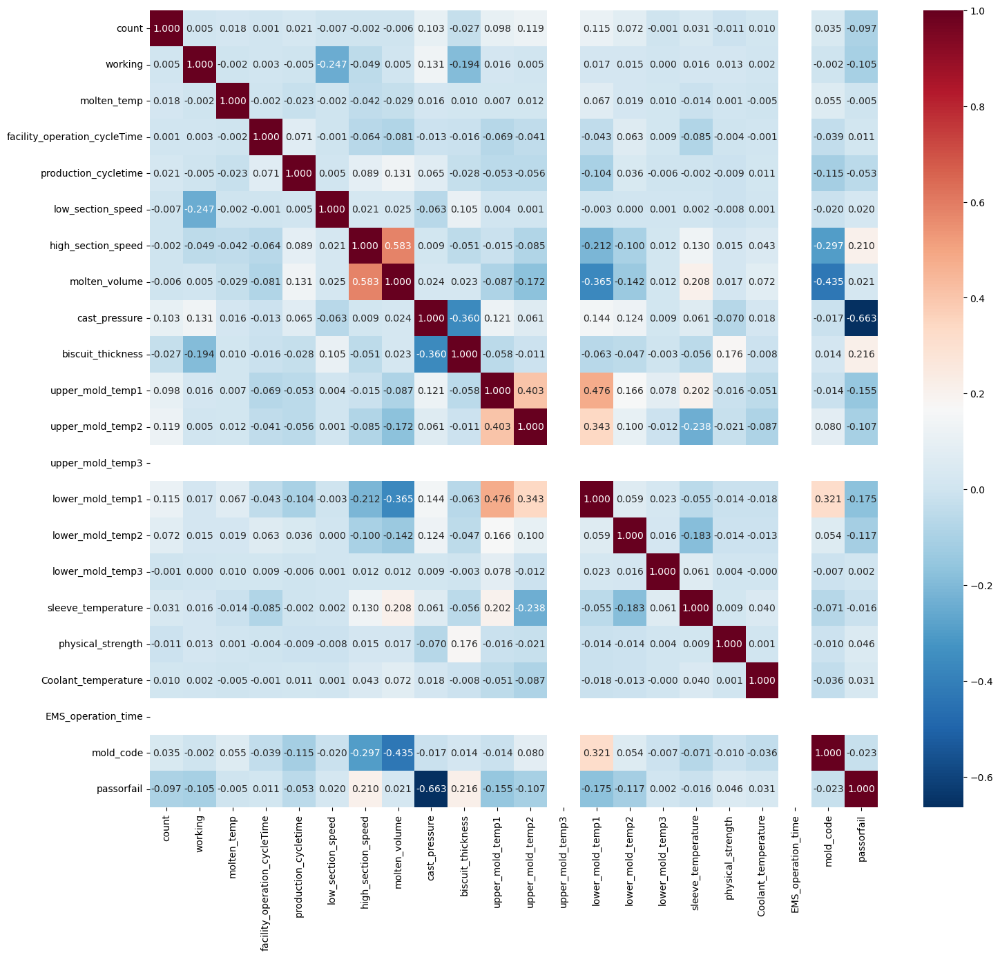

In [36]:
plt.figure(figsize=(17,15))
sns.heatmap(df_nn.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

#### 3-4-3. Decision Tree

In [45]:
from sklearn import tree

X=df_nn.drop('passorfail',axis=1)  
Y=df_nn['passorfail']

# train test splitting
from sklearn.model_selection import train_test_split

# stratify로 비율 유지
X_train, X_test,y_train,y_test=train_test_split(X,Y, test_size=0.20, random_state=1, stratify=Y)

In [38]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, f1_score


dt_clf = DecisionTreeClassifier(random_state=0)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

DecisionTreeClassifier: 0.9926
DecisionTreeClassifier F1-score : 0.8383


Text(77.92222222222227, 0.5, 'Predicted values')

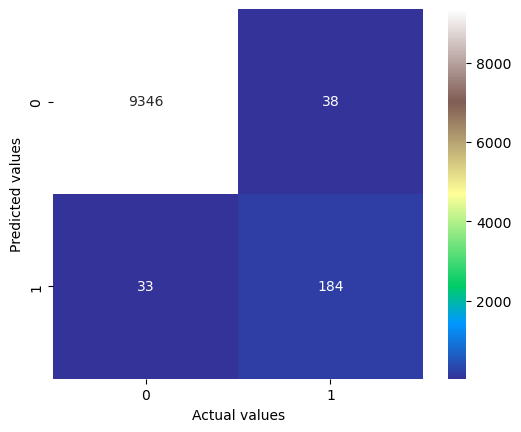

In [39]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

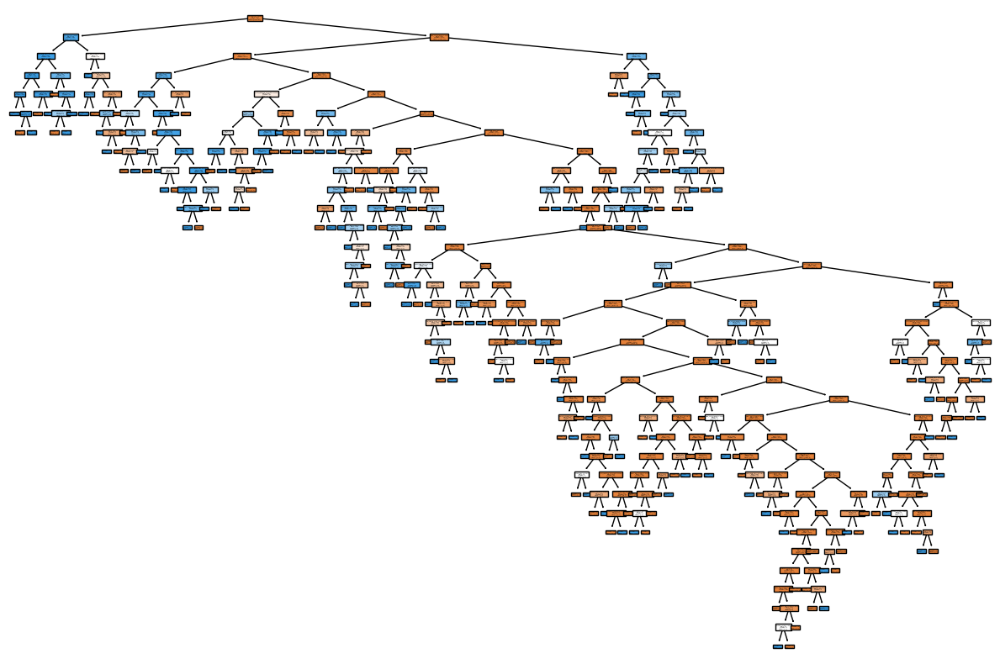

In [40]:
features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
# plt.savefig('tree___1.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [41]:
from sklearn.model_selection import GridSearchCV

params = {'max_depth' : range(2, 25),
         'min_samples_split': range(2, 100, 10),
         'criterion': ['gini', 'entropy'],}

grid_cv = GridSearchCV(DecisionTreeClassifier(random_state=1333), params, n_jobs=-1)
grid_cv.fit(X_train, y_train)
print('최적 하이퍼 파라미터: ', grid_cv.best_params_)
print('최고 예측 정확도: {:.4f}'.format(grid_cv.best_score_))

최적 하이퍼 파라미터:  {'criterion': 'gini', 'max_depth': 19, 'min_samples_split': 12}
최고 예측 정확도: 0.9936


DecisionTreeClassifier: 0.9917


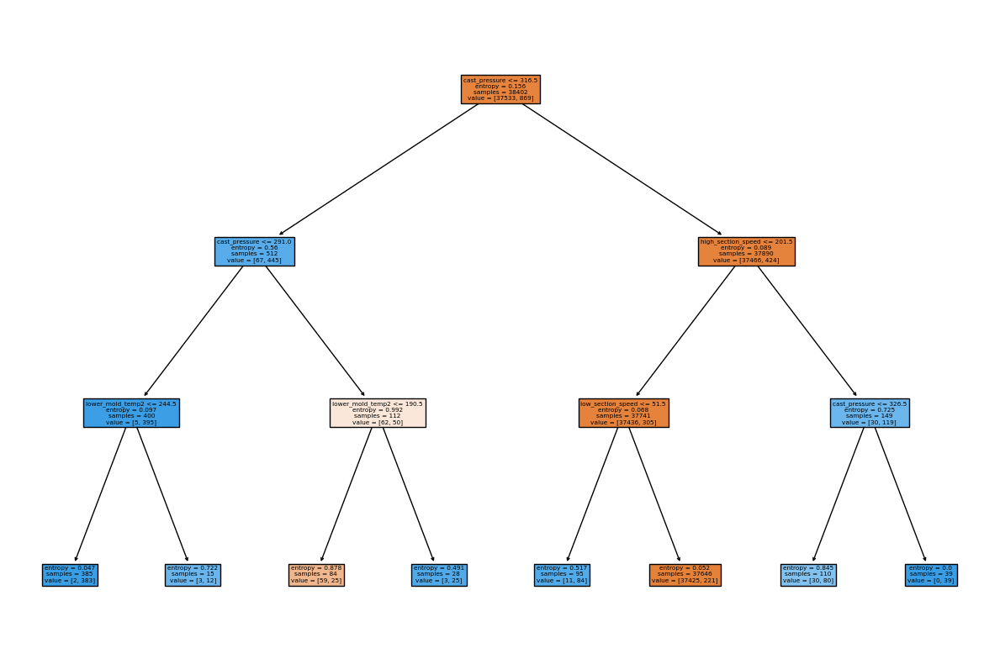

In [42]:
dt_clf = DecisionTreeClassifier(criterion='entropy' ,max_depth=3, random_state=0 )
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))

features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [43]:
print(tree.export_text(dt_clf, feature_names=features))

|--- cast_pressure <= 316.50
|   |--- cast_pressure <= 291.00
|   |   |--- lower_mold_temp2 <= 244.50
|   |   |   |--- class: 1.0
|   |   |--- lower_mold_temp2 >  244.50
|   |   |   |--- class: 1.0
|   |--- cast_pressure >  291.00
|   |   |--- lower_mold_temp2 <= 190.50
|   |   |   |--- class: 0.0
|   |   |--- lower_mold_temp2 >  190.50
|   |   |   |--- class: 1.0
|--- cast_pressure >  316.50
|   |--- high_section_speed <= 201.50
|   |   |--- low_section_speed <= 51.50
|   |   |   |--- class: 1.0
|   |   |--- low_section_speed >  51.50
|   |   |   |--- class: 0.0
|   |--- high_section_speed >  201.50
|   |   |--- cast_pressure <= 326.50
|   |   |   |--- class: 1.0
|   |   |--- cast_pressure >  326.50
|   |   |   |--- class: 1.0



In [44]:
from sklearn.metrics import f1_score
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

X=df_nn.drop('passorfail',axis=1).values  
y=df_nn['passorfail'].values


from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2)


dt_clf = DecisionTreeClassifier(random_state=42)
dt_fold_f1 = []
n_iter = 0
print('모델 :', dt_clf)
idx_list = []

for train_idx, test_idx in sss.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    for train_idx, valid_idx in sss.split(X_train, y_train):
        X_valid = X_train[valid_idx]
        y_valid = y_train[valid_idx]

    X_train_scaled = mms.fit_transform(X_train)
    X_test_scaled = mms.transform(X_test)
    X_valid_scaled = mms.transform(X_valid)
    
    dt_clf.fit(X_train_scaled, y_train)
    valid_pred = dt_clf.predict(X_valid_scaled)
    test_pred = dt_clf.predict(X_test_scaled)
    
    valid_f1 = f1_score(y_valid, valid_pred)
    test_f1 = f1_score(y_test, test_pred)
    
    n_iter += 1
    dt_fold_f1.append([n_iter,	test_f1])
    idx_list.append([train_idx,	test_idx])
    
    print(f'StratifiedShuffleSplit {n_iter} 검증 데이터 f1 정확도 : {valid_f1}')
    print(f'StratifiedShuffleSplit {n_iter} 테스트 데이터 f1 정확도 : {test_f1}')
    print('='*50)
    dt_fold_f1.sort(key=lambda x : x[1], reverse=True)
    print(f'교차검증 중 가장 높은 정확도 : Split {dt_fold_f1[0][0]} {dt_fold_f1[0][1]}')

모델 : DecisionTreeClassifier(random_state=42)
StratifiedShuffleSplit 1 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 1 테스트 데이터 f1 정확도 : 0.8853211009174311
교차검증 중 가장 높은 정확도 : Split 1 0.8853211009174311
StratifiedShuffleSplit 2 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 2 테스트 데이터 f1 정확도 : 0.8445475638051043
교차검증 중 가장 높은 정확도 : Split 1 0.8853211009174311
StratifiedShuffleSplit 3 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 3 테스트 데이터 f1 정확도 : 0.8571428571428571
교차검증 중 가장 높은 정확도 : Split 1 0.8853211009174311
StratifiedShuffleSplit 4 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 4 테스트 데이터 f1 정확도 : 0.8853211009174311
교차검증 중 가장 높은 정확도 : Split 1 0.8853211009174311
StratifiedShuffleSplit 5 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 5 테스트 데이터 f1 정확도 : 0.8367816091954022
교차검증 중 가장 높은 정확도 : Split 1 0.8853211009174311


#### 3-4-4. Random Forest

In [46]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(random_state=1, n_jobs=-1)
rf_clf.fit(X_train,y_train)
pred = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('랜덤 포레스트 예측 정확도: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('RandomForestClassifier F1-score : {:.4f}'.format(f1_sc))

랜덤 포레스트 예측 정확도: 0.9950
RandomForestClassifier F1-score : 0.8863


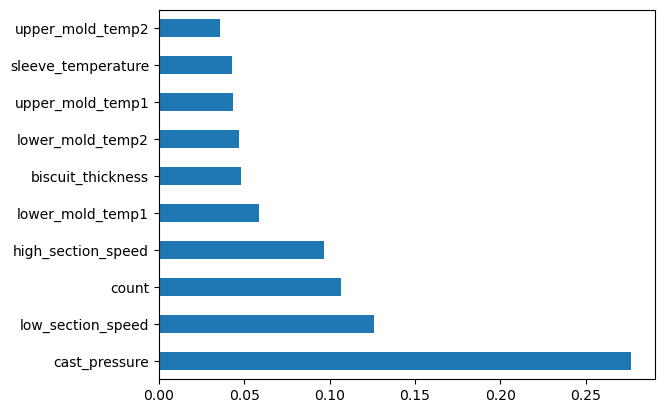

In [47]:
rfr = pd.Series(rf_clf.feature_importances_, index=X.columns)
rfr.nlargest(10).plot(kind='barh')
plt.savefig('./rffeature.jpg', bbox_inches="tight")

Text(77.92222222222227, 0.5, 'Predicted values')

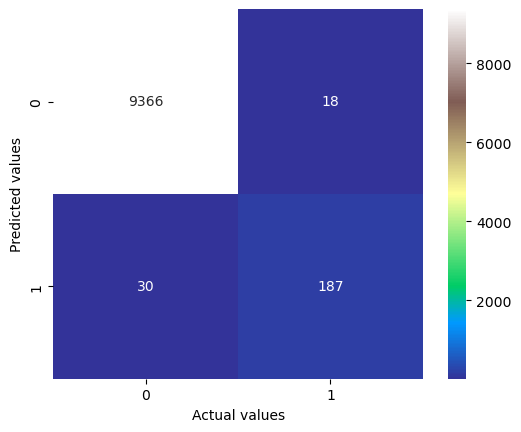

In [48]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

### 3-5. ('tryshot_signal' == NaN) && ('heating_furnace' == A)

In [49]:
df_na = df3[~ts_d & hf_a]
# df_nn
print(df_na.shape[0])

21103


In [50]:
df_na = df_na[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_nn

#### 3-5-1. unique 값 확인

In [51]:
col = df_na.columns
for i in col:
    uni = df_na[i].unique()
    if len(uni) == 1:
        print(i, ' : ', uni)
        print(len(uni))
        print()
    

lower_mold_temp3  :  [1449.]
1



#### 3-5-2. Heatmap

<Axes: >

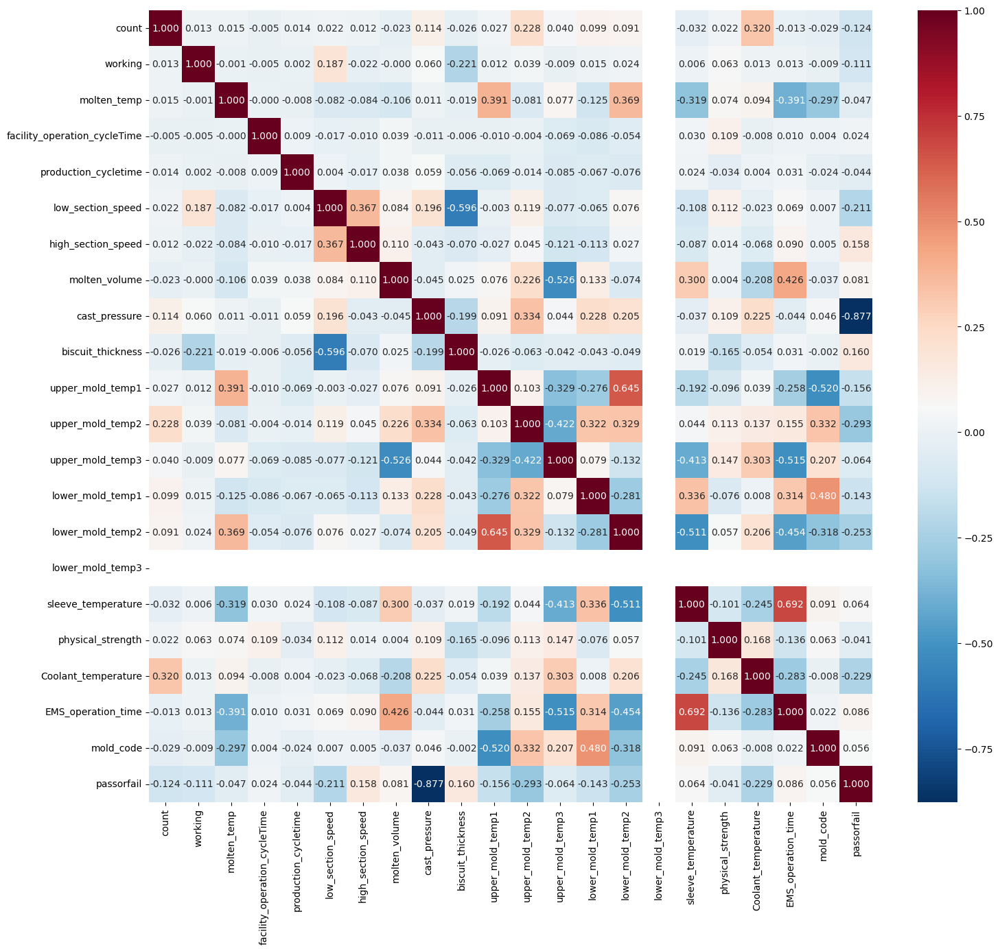

In [52]:
plt.figure(figsize=(17,15))
sns.heatmap(df_na.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

#### 3-5-3. Decision Tree

In [61]:
from sklearn import tree

X=df_na.drop('passorfail',axis=1)  
Y=df_na['passorfail']

# train test splitting
from sklearn.model_selection import train_test_split

# stratify로 비율 유지
X_train, X_test,y_train,y_test=train_test_split(X,Y, test_size=0.20, random_state=1, stratify=Y)

In [54]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, f1_score


dt_clf = DecisionTreeClassifier(random_state=0)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

DecisionTreeClassifier: 0.9976
DecisionTreeClassifier F1-score : 0.9457


Text(77.92222222222227, 0.5, 'Predicted values')

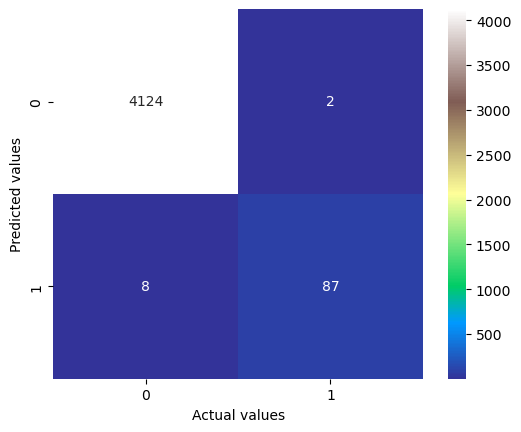

In [55]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

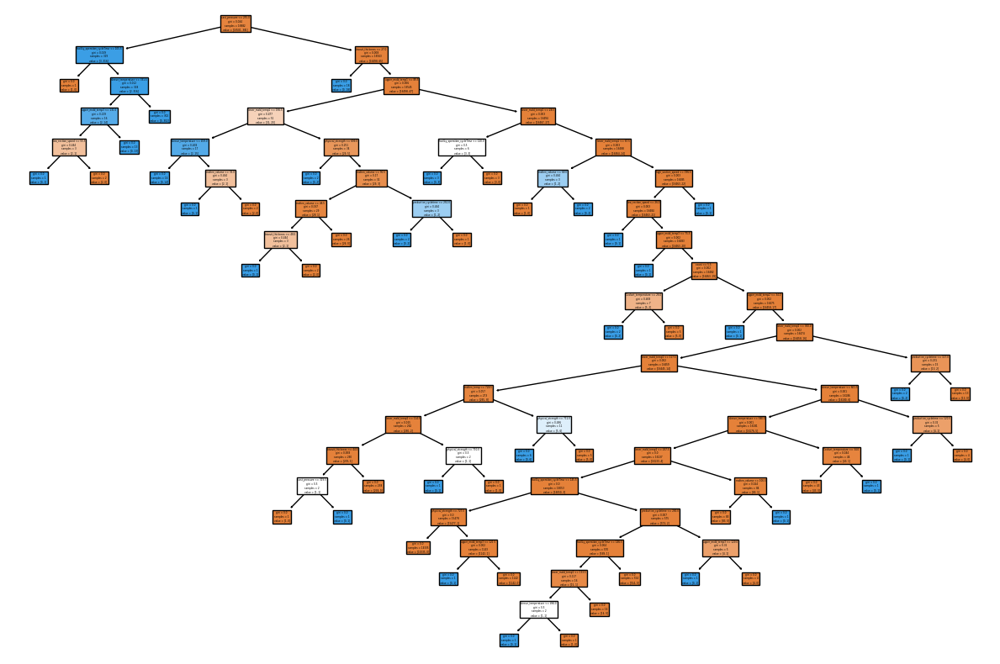

In [56]:
features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
# plt.savefig('tree___1.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [57]:
from sklearn.model_selection import GridSearchCV

params = {'max_depth' : range(2, 25),
         'min_samples_split': range(2, 100, 10),
         'criterion': ['gini', 'entropy'],}

grid_cv = GridSearchCV(DecisionTreeClassifier(random_state=1333), params, n_jobs=-1)
grid_cv.fit(X_train, y_train)
print('최적 하이퍼 파라미터: ', grid_cv.best_params_)
print('최고 예측 정확도: {:.4f}'.format(grid_cv.best_score_))

최적 하이퍼 파라미터:  {'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 12}
최고 예측 정확도: 0.9975


DecisionTreeClassifier: 0.9955


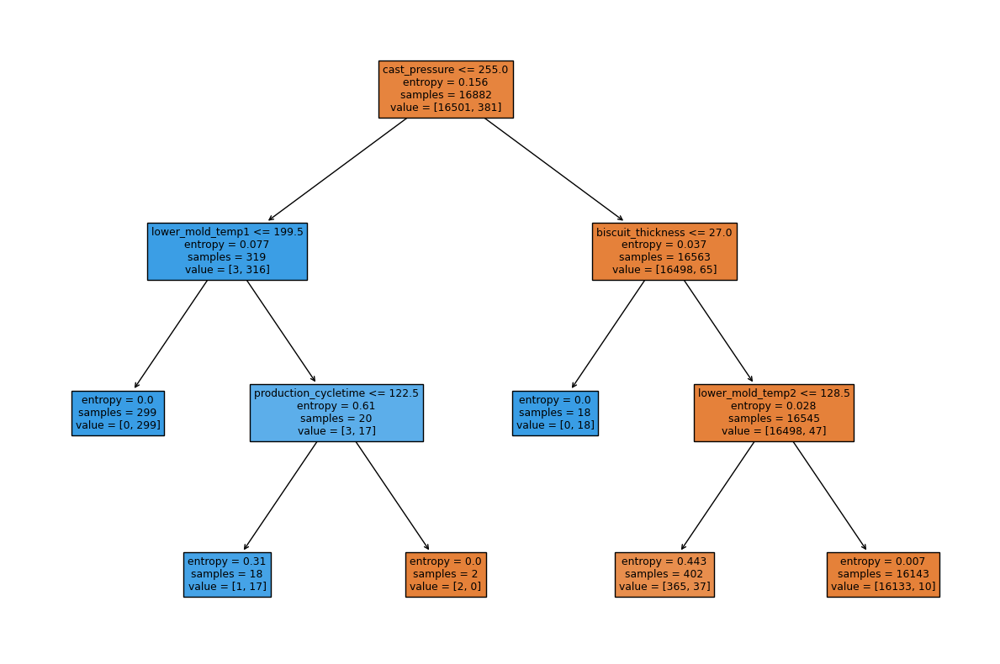

In [58]:
dt_clf = DecisionTreeClassifier(criterion='entropy' ,max_depth=3, random_state=0 )
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))

features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [59]:
print(tree.export_text(dt_clf, feature_names=features))

|--- cast_pressure <= 255.00
|   |--- lower_mold_temp1 <= 199.50
|   |   |--- class: 1.0
|   |--- lower_mold_temp1 >  199.50
|   |   |--- production_cycletime <= 122.50
|   |   |   |--- class: 1.0
|   |   |--- production_cycletime >  122.50
|   |   |   |--- class: 0.0
|--- cast_pressure >  255.00
|   |--- biscuit_thickness <= 27.00
|   |   |--- class: 1.0
|   |--- biscuit_thickness >  27.00
|   |   |--- lower_mold_temp2 <= 128.50
|   |   |   |--- class: 0.0
|   |   |--- lower_mold_temp2 >  128.50
|   |   |   |--- class: 0.0



In [60]:
from sklearn.metrics import f1_score
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

X=df_na.drop('passorfail',axis=1).values  
y=df_na['passorfail'].values


from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2)


dt_clf = DecisionTreeClassifier(random_state=42)
dt_fold_f1 = []
n_iter = 0
print('모델 :', dt_clf)
idx_list = []

for train_idx, test_idx in sss.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    for train_idx, valid_idx in sss.split(X_train, y_train):
        X_valid = X_train[valid_idx]
        y_valid = y_train[valid_idx]

    X_train_scaled = mms.fit_transform(X_train)
    X_test_scaled = mms.transform(X_test)
    X_valid_scaled = mms.transform(X_valid)
    
    dt_clf.fit(X_train_scaled, y_train)
    valid_pred = dt_clf.predict(X_valid_scaled)
    test_pred = dt_clf.predict(X_test_scaled)
    
    valid_f1 = f1_score(y_valid, valid_pred)
    test_f1 = f1_score(y_test, test_pred)
    
    n_iter += 1
    dt_fold_f1.append([n_iter,	test_f1])
    idx_list.append([train_idx,	test_idx])
    
    print(f'StratifiedShuffleSplit {n_iter} 검증 데이터 f1 정확도 : {valid_f1}')
    print(f'StratifiedShuffleSplit {n_iter} 테스트 데이터 f1 정확도 : {test_f1}')
    print('='*50)
    dt_fold_f1.sort(key=lambda x : x[1], reverse=True)
    print(f'교차검증 중 가장 높은 정확도 : Split {dt_fold_f1[0][0]} {dt_fold_f1[0][1]}')

모델 : DecisionTreeClassifier(random_state=42)
StratifiedShuffleSplit 1 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 1 테스트 데이터 f1 정확도 : 0.9270833333333333
교차검증 중 가장 높은 정확도 : Split 1 0.9270833333333333
StratifiedShuffleSplit 2 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 2 테스트 데이터 f1 정확도 : 0.9411764705882354
교차검증 중 가장 높은 정확도 : Split 2 0.9411764705882354
StratifiedShuffleSplit 3 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 3 테스트 데이터 f1 정확도 : 0.91005291005291
교차검증 중 가장 높은 정확도 : Split 2 0.9411764705882354
StratifiedShuffleSplit 4 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 4 테스트 데이터 f1 정확도 : 0.9633507853403142
교차검증 중 가장 높은 정확도 : Split 4 0.9633507853403142
StratifiedShuffleSplit 5 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 5 테스트 데이터 f1 정확도 : 0.9253731343283582
교차검증 중 가장 높은 정확도 : Split 4 0.9633507853403142


#### 3-5-4. Random Forest

In [62]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(random_state=1, n_jobs=-1)
rf_clf.fit(X_train,y_train)
pred = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('랜덤 포레스트 예측 정확도: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('RandomForestClassifier F1-score : {:.4f}'.format(f1_sc))

랜덤 포레스트 예측 정확도: 0.9972
RandomForestClassifier F1-score : 0.9333


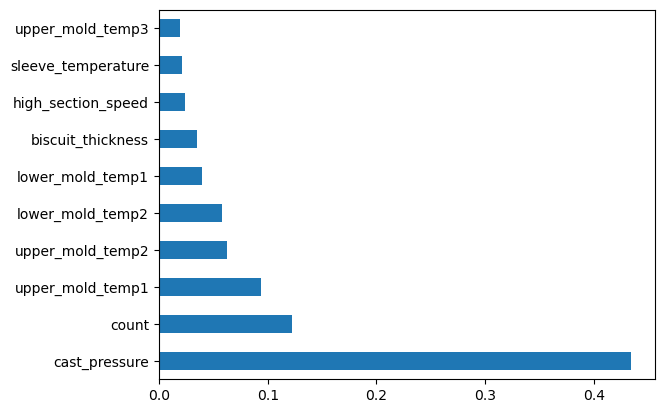

In [63]:
rfr = pd.Series(rf_clf.feature_importances_, index=X.columns)
rfr.nlargest(10).plot(kind='barh')
plt.savefig('./rffeature.jpg', bbox_inches="tight")

Text(77.92222222222227, 0.5, 'Predicted values')

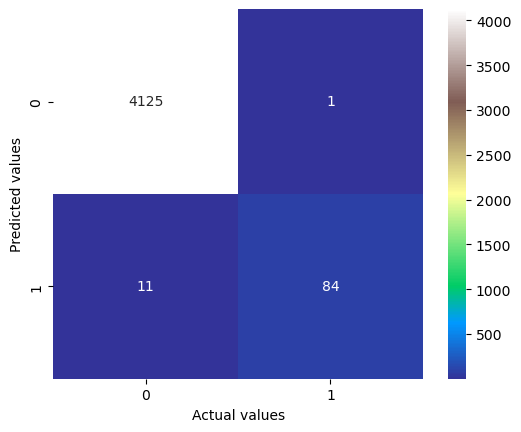

In [64]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

### 3-6. ('tryshot_signal' == NaN) && ('heating_furnace' == B)

In [65]:
df_nb = df3[~ts_d & hf_b]
# df_nn
print(df_nb.shape[0])

20989


In [66]:
df_nb = df_nb[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_nn

#### 3-6-1. unique 값 확인

In [67]:
col = df_nb.columns
for i in col:
    uni = df_nb[i].unique()
    if len(uni) == 1:
        print(i, ' : ', uni)
        print(len(uni))
        print()
    

lower_mold_temp3  :  [1449.]
1



#### 3-6-2. Heatmap

<Axes: >

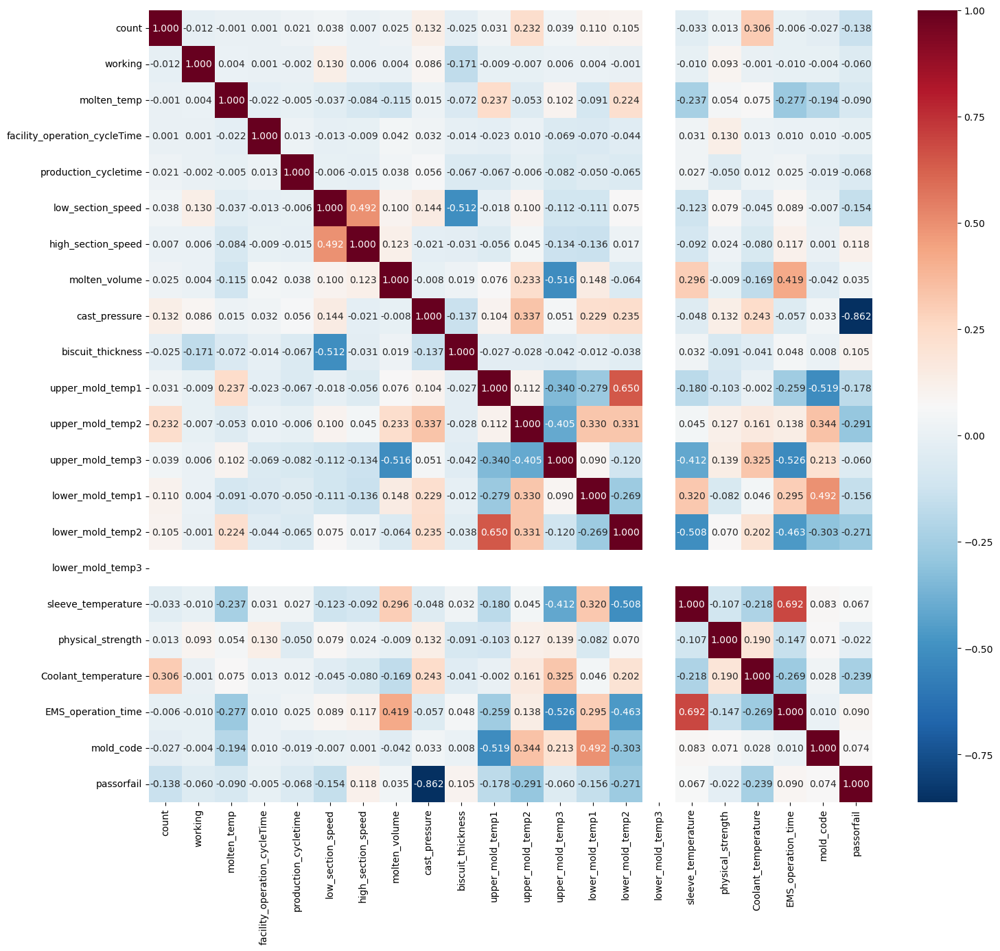

In [68]:
plt.figure(figsize=(17,15))
sns.heatmap(df_nb.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

#### 3-6-3. Decision Tree

In [77]:
from sklearn import tree

X=df_nb.drop('passorfail',axis=1)  
Y=df_nb['passorfail']

# train test splitting
from sklearn.model_selection import train_test_split

# stratify로 비율 유지
X_train, X_test,y_train,y_test=train_test_split(X,Y, test_size=0.20, random_state=1, stratify=Y)

In [70]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, f1_score


dt_clf = DecisionTreeClassifier(random_state=0)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

DecisionTreeClassifier: 0.9967
DecisionTreeClassifier F1-score : 0.9333


Text(77.92222222222227, 0.5, 'Predicted values')

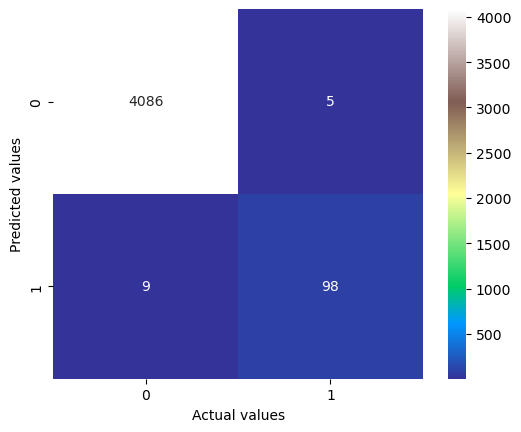

In [71]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

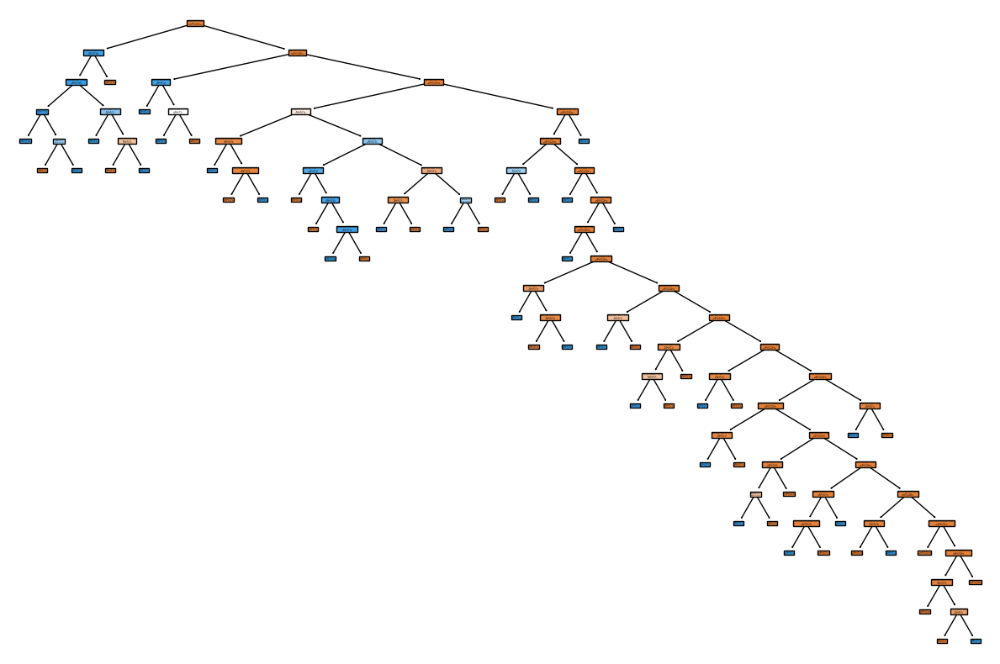

In [72]:
features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
# plt.savefig('tree___1.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [73]:
from sklearn.model_selection import GridSearchCV

params = {'max_depth' : range(2, 25),
         'min_samples_split': range(2, 100, 10),
         'criterion': ['gini', 'entropy'],}

grid_cv = GridSearchCV(DecisionTreeClassifier(random_state=1333), params, n_jobs=-1)
grid_cv.fit(X_train, y_train)
print('최적 하이퍼 파라미터: ', grid_cv.best_params_)
print('최고 예측 정확도: {:.4f}'.format(grid_cv.best_score_))

최적 하이퍼 파라미터:  {'criterion': 'gini', 'max_depth': 14, 'min_samples_split': 42}
최고 예측 정확도: 0.9970


DecisionTreeClassifier: 0.9967


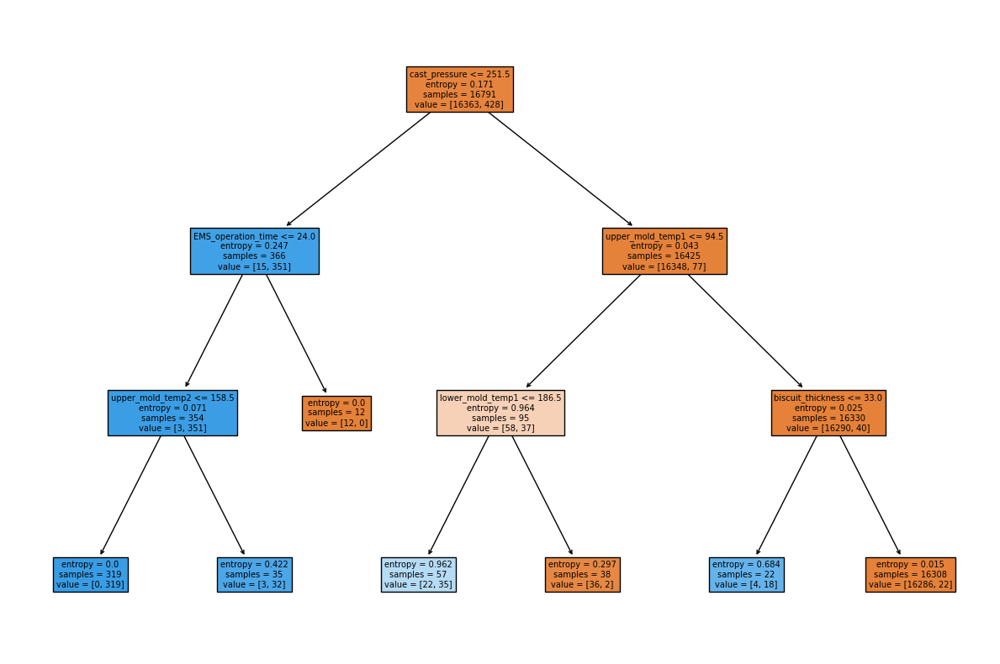

In [74]:
dt_clf = DecisionTreeClassifier(criterion='entropy' ,max_depth=3, random_state=0 )
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))

features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [75]:
print(tree.export_text(dt_clf, feature_names=features))

|--- cast_pressure <= 251.50
|   |--- EMS_operation_time <= 24.00
|   |   |--- upper_mold_temp2 <= 158.50
|   |   |   |--- class: 1.0
|   |   |--- upper_mold_temp2 >  158.50
|   |   |   |--- class: 1.0
|   |--- EMS_operation_time >  24.00
|   |   |--- class: 0.0
|--- cast_pressure >  251.50
|   |--- upper_mold_temp1 <= 94.50
|   |   |--- lower_mold_temp1 <= 186.50
|   |   |   |--- class: 1.0
|   |   |--- lower_mold_temp1 >  186.50
|   |   |   |--- class: 0.0
|   |--- upper_mold_temp1 >  94.50
|   |   |--- biscuit_thickness <= 33.00
|   |   |   |--- class: 1.0
|   |   |--- biscuit_thickness >  33.00
|   |   |   |--- class: 0.0



In [76]:
from sklearn.metrics import f1_score
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

X=df_nb.drop('passorfail',axis=1).values  
y=df_nb['passorfail'].values


from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2)


dt_clf = DecisionTreeClassifier(random_state=42)
dt_fold_f1 = []
n_iter = 0
print('모델 :', dt_clf)
idx_list = []

for train_idx, test_idx in sss.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    for train_idx, valid_idx in sss.split(X_train, y_train):
        X_valid = X_train[valid_idx]
        y_valid = y_train[valid_idx]

    X_train_scaled = mms.fit_transform(X_train)
    X_test_scaled = mms.transform(X_test)
    X_valid_scaled = mms.transform(X_valid)
    
    dt_clf.fit(X_train_scaled, y_train)
    valid_pred = dt_clf.predict(X_valid_scaled)
    test_pred = dt_clf.predict(X_test_scaled)
    
    valid_f1 = f1_score(y_valid, valid_pred)
    test_f1 = f1_score(y_test, test_pred)
    
    n_iter += 1
    dt_fold_f1.append([n_iter,	test_f1])
    idx_list.append([train_idx,	test_idx])
    
    print(f'StratifiedShuffleSplit {n_iter} 검증 데이터 f1 정확도 : {valid_f1}')
    print(f'StratifiedShuffleSplit {n_iter} 테스트 데이터 f1 정확도 : {test_f1}')
    print('='*50)
    dt_fold_f1.sort(key=lambda x : x[1], reverse=True)
    print(f'교차검증 중 가장 높은 정확도 : Split {dt_fold_f1[0][0]} {dt_fold_f1[0][1]}')

모델 : DecisionTreeClassifier(random_state=42)
StratifiedShuffleSplit 1 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 1 테스트 데이터 f1 정확도 : 0.908256880733945
교차검증 중 가장 높은 정확도 : Split 1 0.908256880733945
StratifiedShuffleSplit 2 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 2 테스트 데이터 f1 정확도 : 0.9099526066350712
교차검증 중 가장 높은 정확도 : Split 2 0.9099526066350712
StratifiedShuffleSplit 3 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 3 테스트 데이터 f1 정확도 : 0.9282296650717703
교차검증 중 가장 높은 정확도 : Split 3 0.9282296650717703
StratifiedShuffleSplit 4 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 4 테스트 데이터 f1 정확도 : 0.9406392694063926
교차검증 중 가장 높은 정확도 : Split 4 0.9406392694063926
StratifiedShuffleSplit 5 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 5 테스트 데이터 f1 정확도 : 0.9333333333333335
교차검증 중 가장 높은 정확도 : Split 4 0.9406392694063926


#### 3-6-4. Random Forest

In [78]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(random_state=1, n_jobs=-1)
rf_clf.fit(X_train,y_train)
pred = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('랜덤 포레스트 예측 정확도: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('RandomForestClassifier F1-score : {:.4f}'.format(f1_sc))

랜덤 포레스트 예측 정확도: 0.9971
RandomForestClassifier F1-score : 0.9434


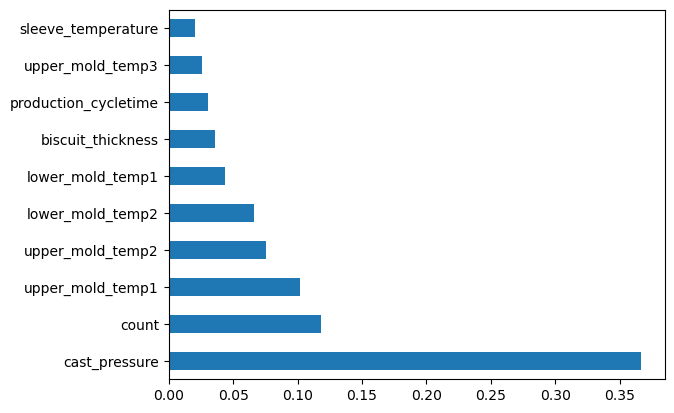

In [79]:
rfr = pd.Series(rf_clf.feature_importances_, index=X.columns)
rfr.nlargest(10).plot(kind='barh')
plt.savefig('./rffeature.jpg', bbox_inches="tight")

Text(77.92222222222227, 0.5, 'Predicted values')

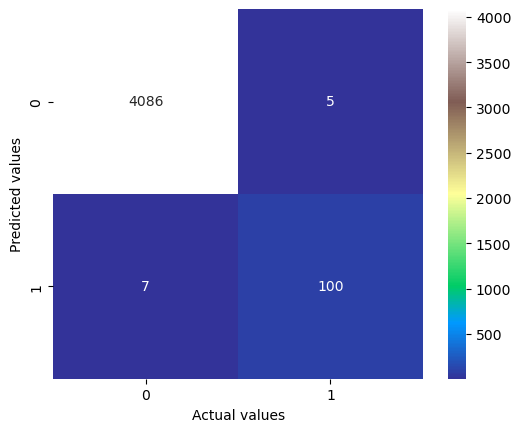

In [80]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

## 4. tryshot_signal' == NaN

In [21]:
df_n = df3[~ts_d]
print(df_n.shape[0])
print(df_n['passorfail'].unique())

90095
[0. 1.]


In [22]:
df_n_none = df_n[['count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_n

In [23]:
df_n_none

,count,working,molten_temp,facility_operation_cycleTime,production_cycletime,low_section_speed,high_section_speed,molten_volume,cast_pressure,biscuit_thickness,...,upper_mold_temp3,lower_mold_temp1,lower_mold_temp2,lower_mold_temp3,sleeve_temperature,physical_strength,Coolant_temperature,EMS_operation_time,mold_code,passorfail
0,258,1.0,731.0,119,120,110.0,112.0,75.0,331.0,35.0,...,1449.0,234.0,316.0,1449.0,550.0,700.0,34.0,23,8722,0.0
1,243,1.0,720.0,98,125,109.0,109.0,75.0,309.0,48.0,...,1449.0,208.0,163.0,1449.0,481.0,0.0,30.0,25,8412,0.0
2,244,1.0,721.0,98,122,109.0,109.0,75.0,309.0,48.0,...,1449.0,208.0,163.0,1449.0,481.0,0.0,30.0,25,8412,0.0
3,245,1.0,721.0,100,125,112.0,109.0,75.0,308.0,49.0,...,1449.0,211.0,179.0,1449.0,483.0,0.0,30.0,25,8412,0.0
4,246,1.0,721.0,99,123,109.0,110.0,75.0,309.0,49.0,...,1449.0,216.0,187.0,1449.0,486.0,0.0,30.0,25,8412,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92009,71,1.0,731.0,122,122,100.0,101.0,80.0,331.0,49.0,...,1449.0,231.0,201.0,1449.0,279.0,726.0,30.0,0,8917,0.0
92010,72,1.0,731.0,120,121,100.0,101.0,80.0,331.0,54.0,...,1449.0,232.0,201.0,1449.0,279.0,732.0,30.0,0,8917,0.0
92011,73,1.0,732.0,122,135,100.0,101.0,80.0,331.0,52.0,...,1449.0,225.0,195.0,1449.0,272.0,731.0,30.0,0,8917,0.0
92012,74,1.0,732.0,133,122,100.0,101.0,80.0,331.0,53.0,...,1449.0,227.0,199.0,1449.0,288.0,723.0,30.0,0,8917,0.0


In [24]:
# df_n.to_csv('./tryshot_signal_NaN_20241101.csv', index=False)

In [25]:
df_n = df_n[['registration_time', 'count', 'working', 'molten_temp', 'facility_operation_cycleTime', 'production_cycletime', 'low_section_speed',
               'high_section_speed', 'molten_volume', 'cast_pressure', 'biscuit_thickness', 'upper_mold_temp1', 'upper_mold_temp2',
               'upper_mold_temp3', 'lower_mold_temp1', 'lower_mold_temp2', 'lower_mold_temp3', 'sleeve_temperature', 'physical_strength',
               'Coolant_temperature', 'EMS_operation_time', 'mold_code', 'passorfail']]
# df_n

In [26]:
# df_n.to_csv('./tryshot_signal_NaN_add_time_20241101.csv', index=False)

In [27]:
df_n

,registration_time,count,working,molten_temp,facility_operation_cycleTime,production_cycletime,low_section_speed,high_section_speed,molten_volume,cast_pressure,...,upper_mold_temp3,lower_mold_temp1,lower_mold_temp2,lower_mold_temp3,sleeve_temperature,physical_strength,Coolant_temperature,EMS_operation_time,mold_code,passorfail
0,2019-01-02 16:45:06,258,1.0,731.0,119,120,110.0,112.0,75.0,331.0,...,1449.0,234.0,316.0,1449.0,550.0,700.0,34.0,23,8722,0.0
1,2019-01-02 16:45:08,243,1.0,720.0,98,125,109.0,109.0,75.0,309.0,...,1449.0,208.0,163.0,1449.0,481.0,0.0,30.0,25,8412,0.0
2,2019-01-02 16:45:58,244,1.0,721.0,98,122,109.0,109.0,75.0,309.0,...,1449.0,208.0,163.0,1449.0,481.0,0.0,30.0,25,8412,0.0
3,2019-01-02 16:48:03,245,1.0,721.0,100,125,112.0,109.0,75.0,308.0,...,1449.0,211.0,179.0,1449.0,483.0,0.0,30.0,25,8412,0.0
4,2019-01-02 16:50:08,246,1.0,721.0,99,123,109.0,110.0,75.0,309.0,...,1449.0,216.0,187.0,1449.0,486.0,0.0,30.0,25,8412,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92009,2019-03-31 23:51:29,71,1.0,731.0,122,122,100.0,101.0,80.0,331.0,...,1449.0,231.0,201.0,1449.0,279.0,726.0,30.0,0,8917,0.0
92010,2019-03-31 23:53:28,72,1.0,731.0,120,121,100.0,101.0,80.0,331.0,...,1449.0,232.0,201.0,1449.0,279.0,732.0,30.0,0,8917,0.0
92011,2019-03-31 23:55:44,73,1.0,732.0,122,135,100.0,101.0,80.0,331.0,...,1449.0,225.0,195.0,1449.0,272.0,731.0,30.0,0,8917,0.0
92012,2019-03-31 23:57:46,74,1.0,732.0,133,122,100.0,101.0,80.0,331.0,...,1449.0,227.0,199.0,1449.0,288.0,723.0,30.0,0,8917,0.0


In [104]:
df_n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90095 entries, 0 to 92013
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   registration_time             90095 non-null  datetime64[ns]
 1   count                         90095 non-null  int64         
 2   working                       90095 non-null  float64       
 3   molten_temp                   90095 non-null  float64       
 4   facility_operation_cycleTime  90095 non-null  int64         
 5   production_cycletime          90095 non-null  int64         
 6   low_section_speed             90095 non-null  float64       
 7   high_section_speed            90095 non-null  float64       
 8   molten_volume                 90095 non-null  float64       
 9   cast_pressure                 90095 non-null  float64       
 10  biscuit_thickness             90095 non-null  float64       
 11  upper_mold_temp1            

In [136]:
df_n_none['passorfail'].unique()

array([0., 1.])

In [143]:
print('1 개수 ', df_n_none[df_n_none['passorfail']==1].shape[0], ', 0 개수 ', df_n_none[df_n_none['passorfail']==0].shape[0])

1 개수  2097 , 0 개수  87998


In [144]:
df_n_none['passorfail'].value_counts()

0.0    87998
1.0     2097
Name: passorfail, dtype: int64

In [145]:
df_n_none['passorfail'].value_counts(normalize=True)

0.0    0.976725
1.0    0.023275
Name: passorfail, dtype: float64

In [147]:
df_n_none['passorfail'].value_counts(dropna=False).to_frame('갯수').join(
    df_n_none['passorfail'].value_counts(dropna=False, normalize=True).to_frame('비율')
).round(4)

,갯수,비율
0.0,87998,0.9767
1.0,2097,0.0233


<function matplotlib.pyplot.show(close=None, block=None)>

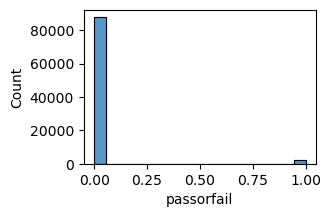

In [150]:
plt.figure(figsize=(3,2))

# sns.countplot(df_n_none['passorfail'])
sns.histplot(df_n_none['passorfail'])
plt.show

In [102]:
df_n_none.describe().T

,count,mean,std,min,25%,50%,75%,max
count,90095.0,150.341606,87.015334,1.0,75.0,148.0,223.0,334.0
working,90095.0,0.999734,0.016319,0.0,1.0,1.0,1.0,1.0
molten_temp,90095.0,718.078317,52.661976,0.0,712.0,728.0,730.0,735.0
facility_operation_cycleTime,90095.0,121.587114,12.030442,69.0,117.0,119.0,122.0,457.0
production_cycletime,90095.0,122.625129,13.308901,0.0,119.0,121.0,123.0,485.0
low_section_speed,90095.0,110.322182,218.154686,0.0,110.0,110.0,110.0,65534.0
high_section_speed,90095.0,112.682768,10.695703,0.0,112.0,112.0,112.0,388.0
molten_volume,90095.0,380.500716,866.933391,0.0,51.0,72.0,91.0,2767.0
cast_pressure,90095.0,326.521727,20.655991,41.0,329.0,330.0,331.0,348.0
biscuit_thickness,90095.0,50.316244,13.357600,0.0,47.0,50.0,53.0,422.0


<Axes: >

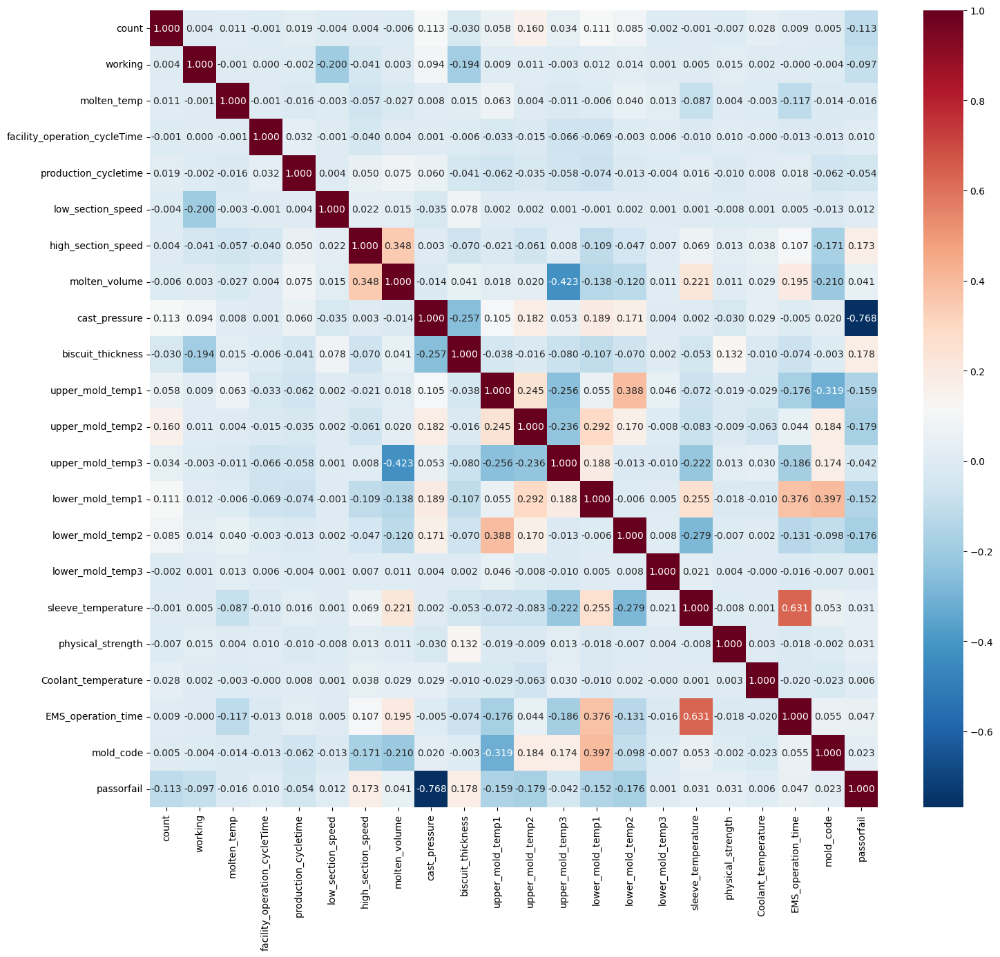

In [100]:
plt.figure(figsize=(17,15))
sns.heatmap(df_n_none.corr(), annot = True, fmt = '.3f', cmap = 'RdBu_r')

### 4-2. Decision Tree

In [125]:
from sklearn import tree

X=df_n_none.drop('passorfail',axis=1)  
Y=df_n_none['passorfail']

# train test splitting
from sklearn.model_selection import train_test_split

# stratify로 비율 유지
X_train, X_test,y_train,y_test=train_test_split(X,Y, test_size=0.20, random_state=1, stratify=Y)

In [126]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, f1_score


dt_clf = DecisionTreeClassifier(random_state=0)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

DecisionTreeClassifier: 0.9958
DecisionTreeClassifier F1-score : 0.9104


Text(112.22222222222227, 0.5, 'Predicted values')

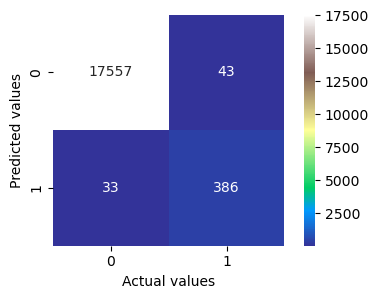

In [127]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plt.figure(figsize=(5,3))

plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

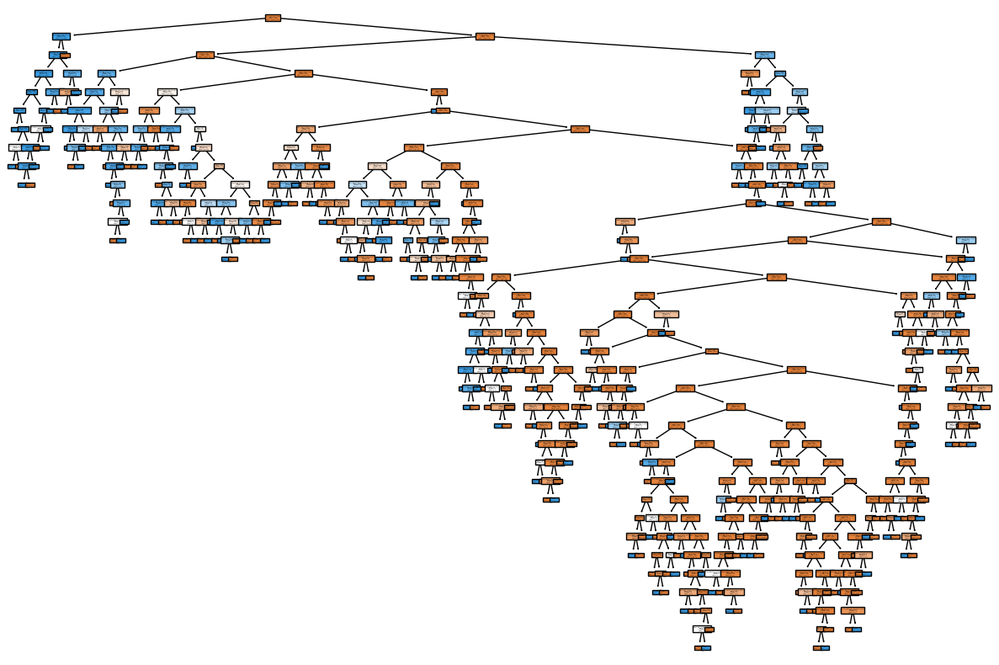

In [91]:
features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
# plt.savefig('tree___1.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [108]:
# depth = 18
# DecisionTreeClassifier: 0.9957
# DecisionTreeClassifier F1-score : 0.9058

# depth = 4
# DecisionTreeClassifier: 0.9939 
# DecisionTreeClassifier F1-score : 0.8525

# depth = 5
# DecisionTreeClassifier: 0.9947
# DecisionTreeClassifier F1-score : 0.8817

DecisionTreeClassifier: 0.9957
DecisionTreeClassifier F1-score : 0.9058


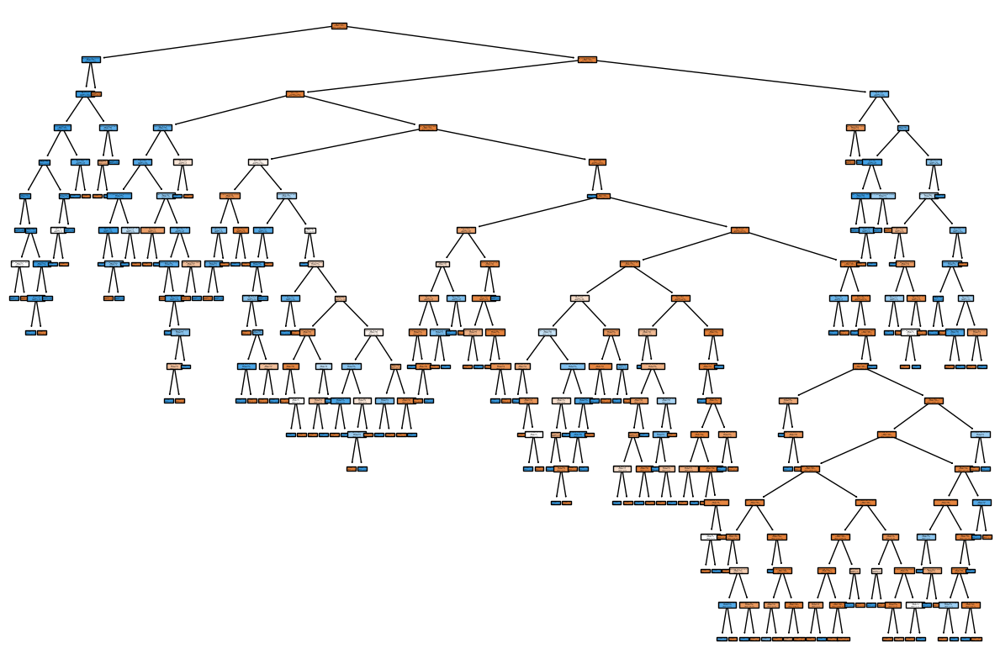

In [128]:
dt_clf = DecisionTreeClassifier(criterion='gini', max_depth=18, random_state=1)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree_nan_depth3.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

Text(112.22222222222227, 0.5, 'Predicted values')

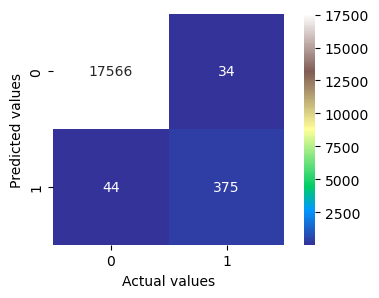

In [129]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plt.figure(figsize=(5,3))
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

DecisionTreeClassifier: 0.9940
DecisionTreeClassifier F1-score : 0.8560


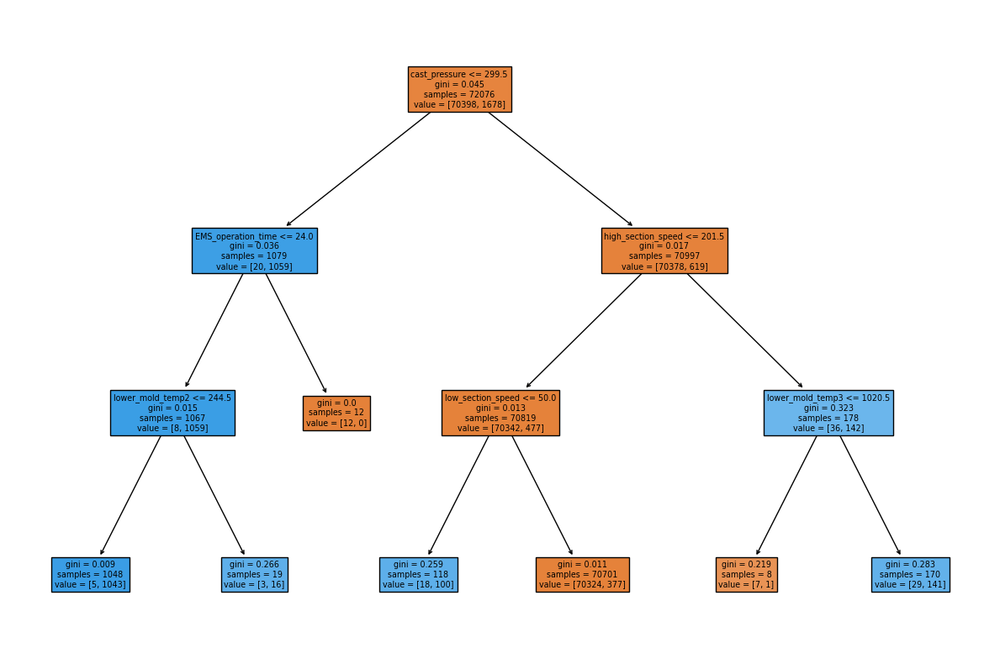

In [130]:
dt_clf = DecisionTreeClassifier(criterion='gini', max_depth=3, random_state=1)
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('DecisionTreeClassifier F1-score : {:.4f}'.format(f1_sc))

features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree_nan_depth3.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [131]:
print(tree.export_text(dt_clf, feature_names=features))

|--- cast_pressure <= 299.50
|   |--- EMS_operation_time <= 24.00
|   |   |--- lower_mold_temp2 <= 244.50
|   |   |   |--- class: 1.0
|   |   |--- lower_mold_temp2 >  244.50
|   |   |   |--- class: 1.0
|   |--- EMS_operation_time >  24.00
|   |   |--- class: 0.0
|--- cast_pressure >  299.50
|   |--- high_section_speed <= 201.50
|   |   |--- low_section_speed <= 50.00
|   |   |   |--- class: 1.0
|   |   |--- low_section_speed >  50.00
|   |   |   |--- class: 0.0
|   |--- high_section_speed >  201.50
|   |   |--- lower_mold_temp3 <= 1020.50
|   |   |   |--- class: 0.0
|   |   |--- lower_mold_temp3 >  1020.50
|   |   |   |--- class: 1.0



Text(112.22222222222227, 0.5, 'Predicted values')

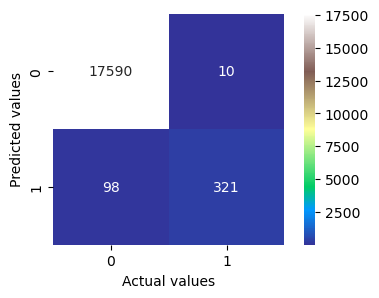

In [132]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plt.figure(figsize=(5,3))
plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

In [92]:
from sklearn.model_selection import GridSearchCV

params = {'max_depth' : range(2, 25),
         'min_samples_split': range(2, 100, 10),
         'criterion': ['gini', 'entropy'],}

grid_cv = GridSearchCV(DecisionTreeClassifier(random_state=1333), params, n_jobs=-1)
grid_cv.fit(X_train, y_train)
print('최적 하이퍼 파라미터: ', grid_cv.best_params_)
print('최고 예측 정확도: {:.4f}'.format(grid_cv.best_score_))

최적 하이퍼 파라미터:  {'criterion': 'gini', 'max_depth': 18, 'min_samples_split': 2}
최고 예측 정확도: 0.9950


DecisionTreeClassifier: 0.9938


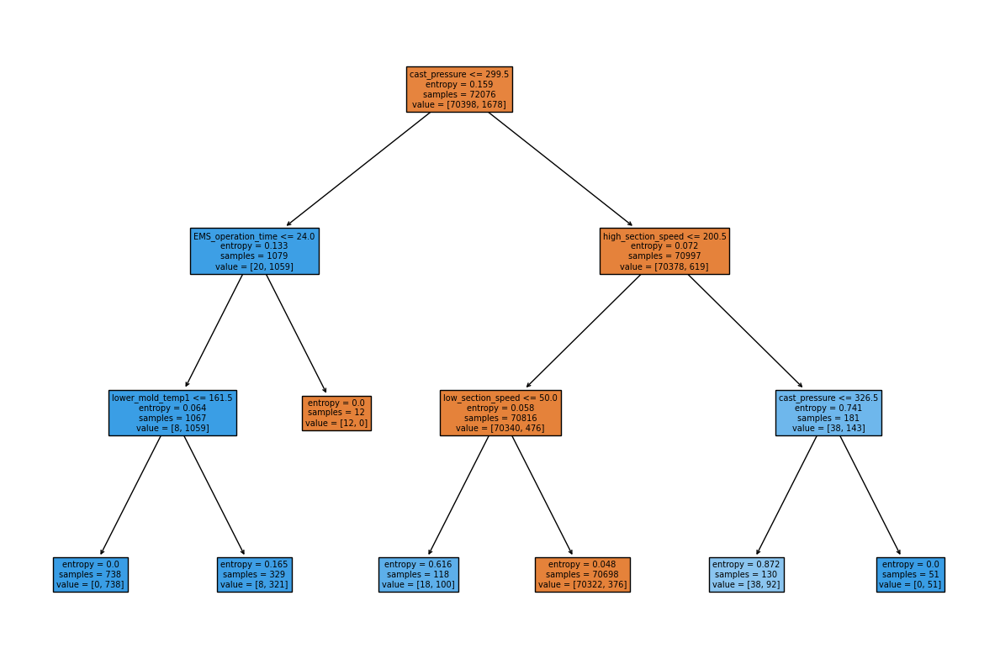

In [93]:
dt_clf = DecisionTreeClassifier(criterion='entropy' ,max_depth=3, random_state=0 )
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('DecisionTreeClassifier: {:.4f}'.format(accuracy))

features = X.columns.tolist()
plt.figure(figsize=(12,8))
tree.plot_tree(dt_clf, feature_names=features, filled=True)
plt.savefig('tree.png', dpi=300, transparent=True, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [94]:
print(tree.export_text(dt_clf, feature_names=features))

|--- cast_pressure <= 299.50
|   |--- EMS_operation_time <= 24.00
|   |   |--- lower_mold_temp1 <= 161.50
|   |   |   |--- class: 1.0
|   |   |--- lower_mold_temp1 >  161.50
|   |   |   |--- class: 1.0
|   |--- EMS_operation_time >  24.00
|   |   |--- class: 0.0
|--- cast_pressure >  299.50
|   |--- high_section_speed <= 200.50
|   |   |--- low_section_speed <= 50.00
|   |   |   |--- class: 1.0
|   |   |--- low_section_speed >  50.00
|   |   |   |--- class: 0.0
|   |--- high_section_speed >  200.50
|   |   |--- cast_pressure <= 326.50
|   |   |   |--- class: 1.0
|   |   |--- cast_pressure >  326.50
|   |   |   |--- class: 1.0



In [95]:
from sklearn.metrics import f1_score
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

X=df_nb.drop('passorfail',axis=1).values  
y=df_nb['passorfail'].values


from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.2)


dt_clf = DecisionTreeClassifier(random_state=42)
dt_fold_f1 = []
n_iter = 0
print('모델 :', dt_clf)
idx_list = []

for train_idx, test_idx in sss.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    for train_idx, valid_idx in sss.split(X_train, y_train):
        X_valid = X_train[valid_idx]
        y_valid = y_train[valid_idx]

    X_train_scaled = mms.fit_transform(X_train)
    X_test_scaled = mms.transform(X_test)
    X_valid_scaled = mms.transform(X_valid)
    
    dt_clf.fit(X_train_scaled, y_train)
    valid_pred = dt_clf.predict(X_valid_scaled)
    test_pred = dt_clf.predict(X_test_scaled)
    
    valid_f1 = f1_score(y_valid, valid_pred)
    test_f1 = f1_score(y_test, test_pred)
    
    n_iter += 1
    dt_fold_f1.append([n_iter,	test_f1])
    idx_list.append([train_idx,	test_idx])
    
    print(f'StratifiedShuffleSplit {n_iter} 검증 데이터 f1 정확도 : {valid_f1}')
    print(f'StratifiedShuffleSplit {n_iter} 테스트 데이터 f1 정확도 : {test_f1}')
    print('='*50)
    dt_fold_f1.sort(key=lambda x : x[1], reverse=True)
    print(f'교차검증 중 가장 높은 정확도 : Split {dt_fold_f1[0][0]} {dt_fold_f1[0][1]}')

모델 : DecisionTreeClassifier(random_state=42)
StratifiedShuffleSplit 1 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 1 테스트 데이터 f1 정확도 : 0.908256880733945
교차검증 중 가장 높은 정확도 : Split 1 0.908256880733945
StratifiedShuffleSplit 2 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 2 테스트 데이터 f1 정확도 : 0.9099526066350712
교차검증 중 가장 높은 정확도 : Split 2 0.9099526066350712
StratifiedShuffleSplit 3 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 3 테스트 데이터 f1 정확도 : 0.9282296650717703
교차검증 중 가장 높은 정확도 : Split 3 0.9282296650717703
StratifiedShuffleSplit 4 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 4 테스트 데이터 f1 정확도 : 0.9406392694063926
교차검증 중 가장 높은 정확도 : Split 4 0.9406392694063926
StratifiedShuffleSplit 5 검증 데이터 f1 정확도 : 1.0
StratifiedShuffleSplit 5 테스트 데이터 f1 정확도 : 0.9333333333333335
교차검증 중 가장 높은 정확도 : Split 4 0.9406392694063926


### 4-3. Random Forest

In [97]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(random_state=1, n_jobs=-1)
rf_clf.fit(X_train,y_train)
pred = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test, pred)
print('랜덤 포레스트 예측 정확도: {:.4f}'.format(accuracy))
f1_sc = f1_score(y_test, pred)
# print(f1_sc)
print('RandomForestClassifier F1-score : {:.4f}'.format(f1_sc))

랜덤 포레스트 예측 정확도: 0.9961
RandomForestClassifier F1-score : 0.9148


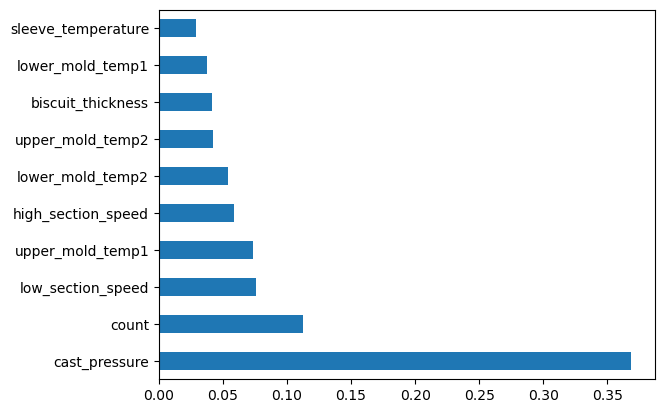

In [98]:
rfr = pd.Series(rf_clf.feature_importances_, index=X.columns)
rfr.nlargest(10).plot(kind='barh')
plt.savefig('./rffeature.jpg', bbox_inches="tight")

Text(112.22222222222227, 0.5, 'Predicted values')

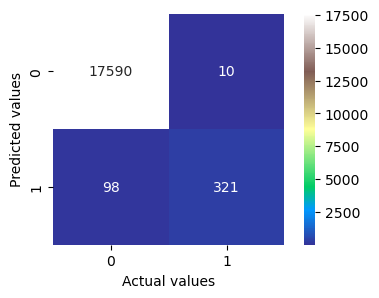

In [124]:
#confusion matrix 
from sklearn.metrics import confusion_matrix
confusion_dt=confusion_matrix(y_test,pred)

#confusion matrix plot
plt.figure(figsize=(5,3))

plot=sns.heatmap(confusion_dt,square=True,annot=True,fmt = '.0f', cmap='terrain')
class_lables=['0','1','2','3']
plot.set_xlabel('Actual values')
plot.set_ylabel('Predicted values')

## 5. registration_time 그래프
- 시계열 확인

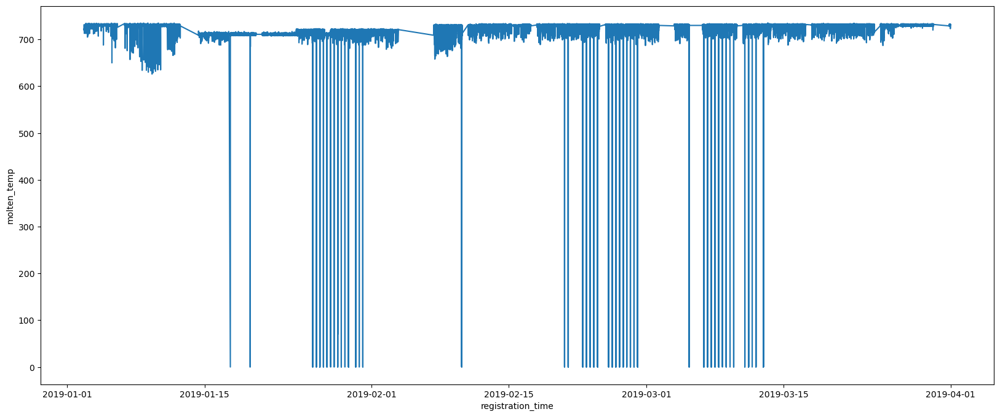

In [114]:
plt.figure(figsize=(20, 8))

sns.lineplot(df1, y= df1['molten_temp'], x=df1['registration_time'])
plt.show()

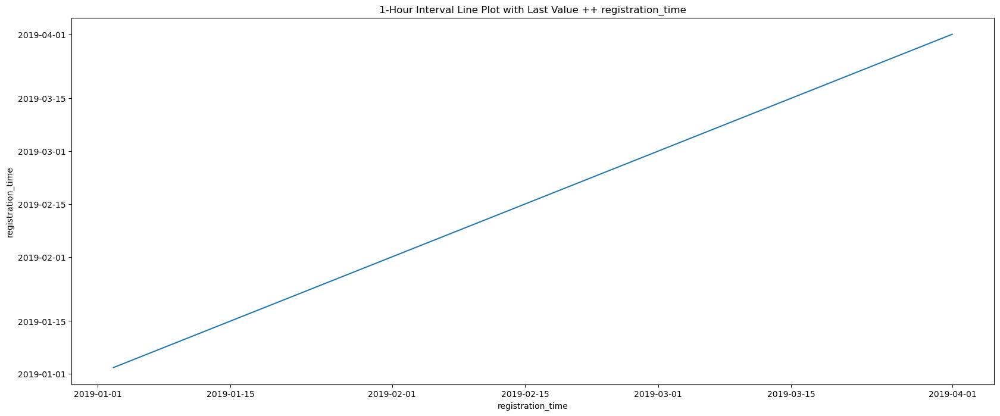

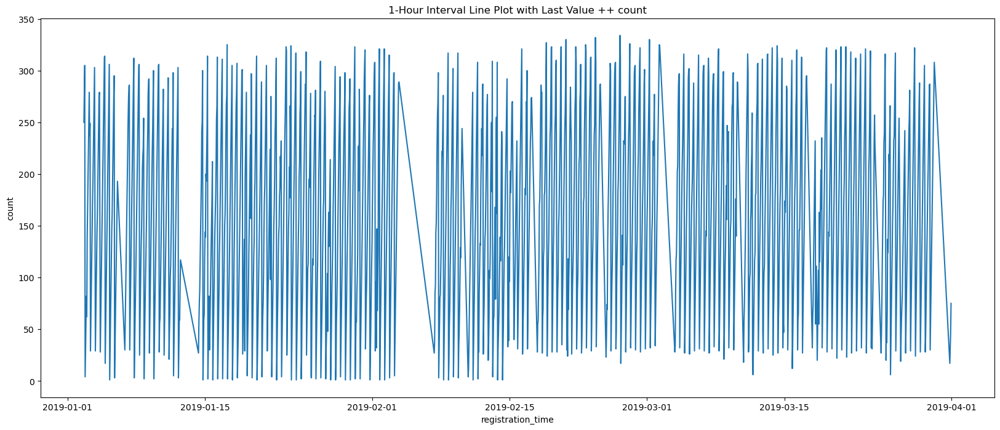

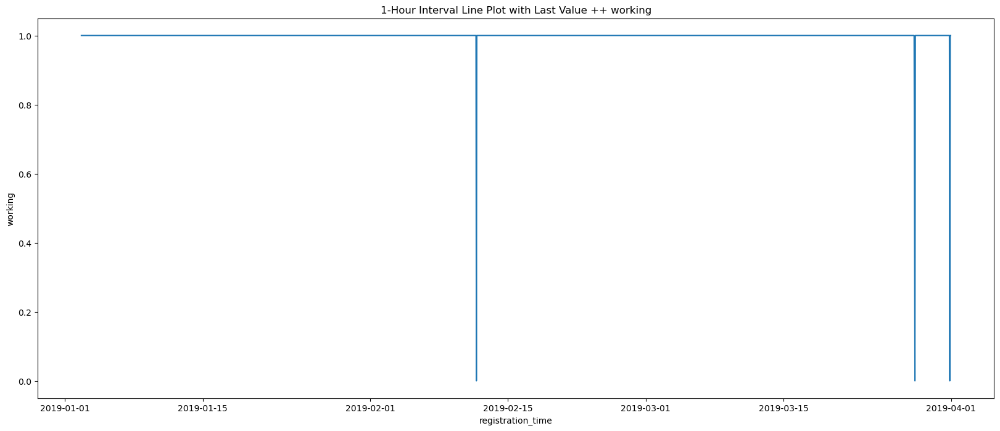

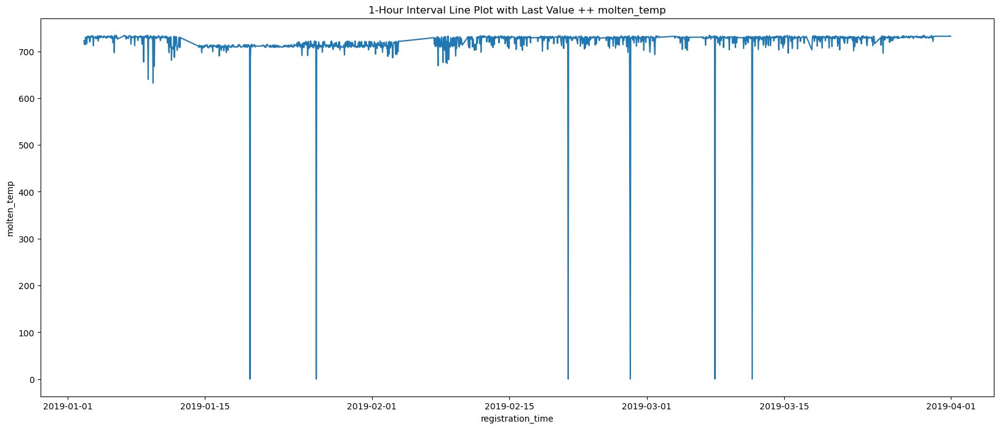

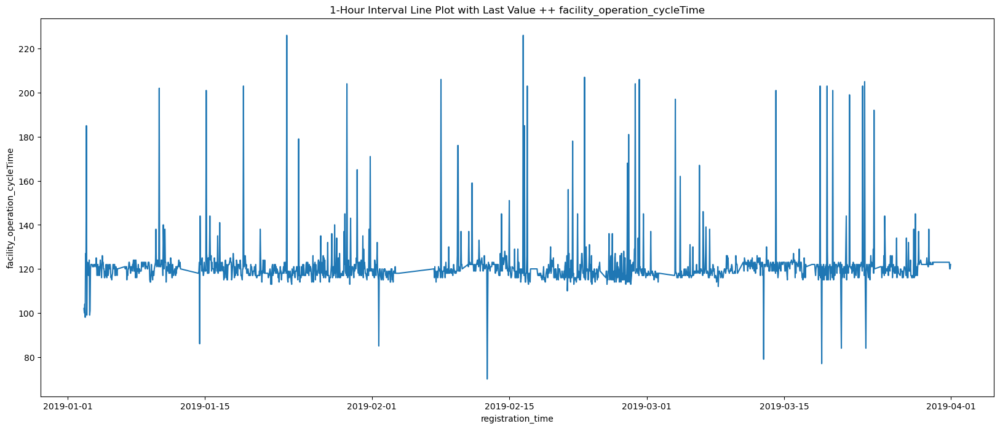

...

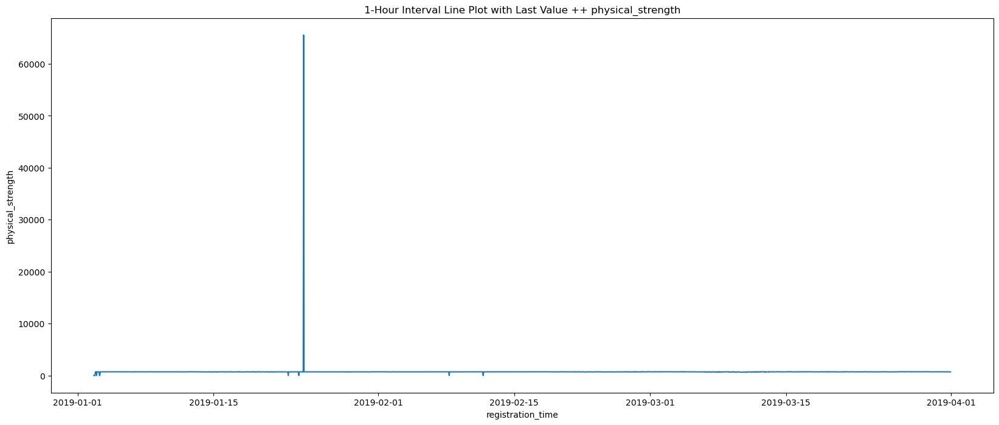

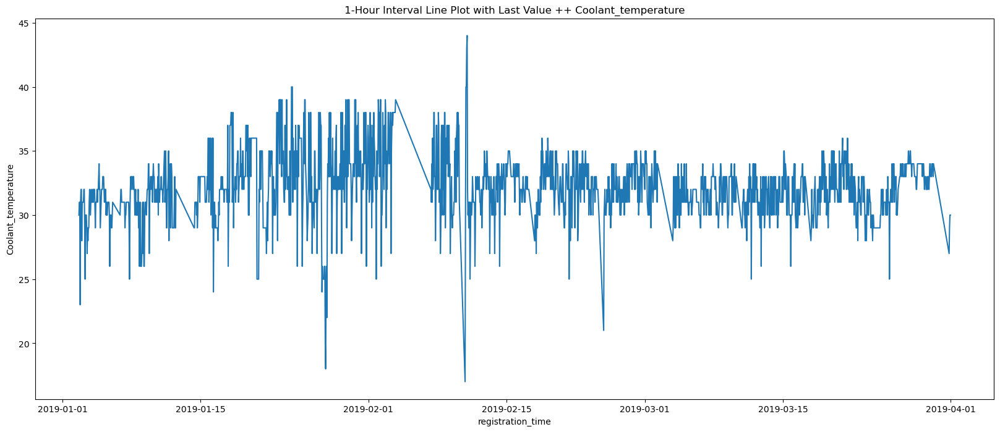

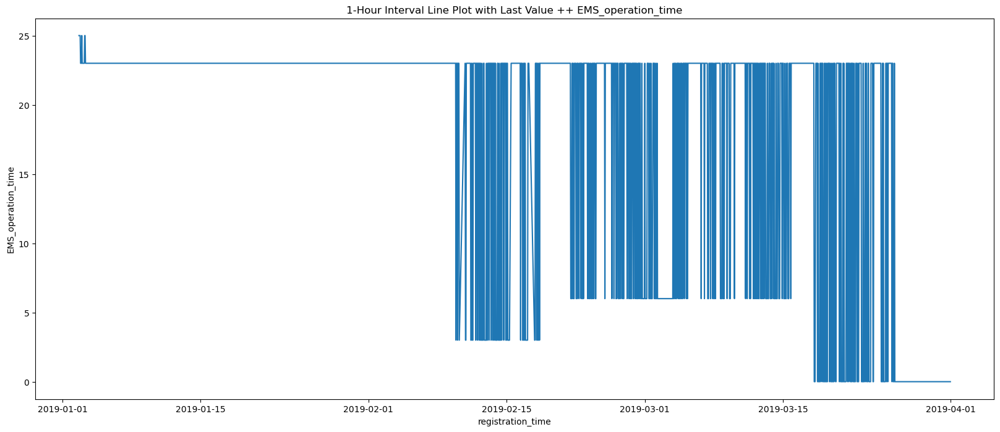

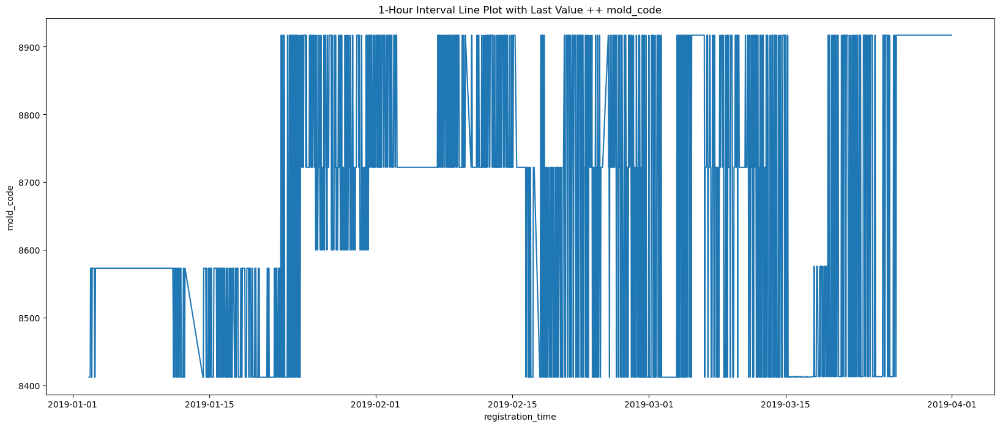

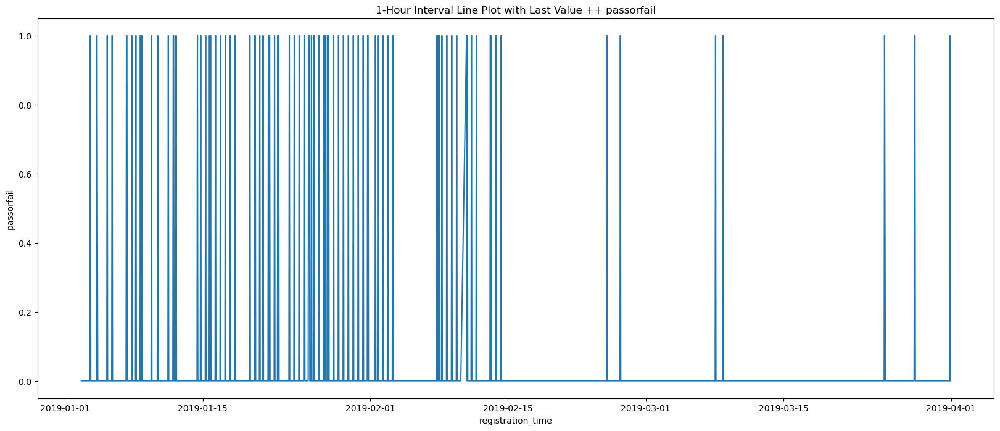

In [28]:
df_reg = df_n.copy()

# 1시간 간격으로 리샘플링하여 각 시간대의 마지막 값 선택
data_resampled = df_reg.set_index('registration_time').resample('1H').last().dropna().reset_index()

for i in df_n.columns:
    plt.figure(figsize=(20, 8))

    sns.lineplot(data_resampled, x='registration_time', y=i)
    plt.title(f'1-Hour Interval Line Plot with Last Value ++ {i}')
    plt.xlabel('registration_time')
    plt.ylabel(i)
    plt.show()

<Figure size 2000x800 with 0 Axes>

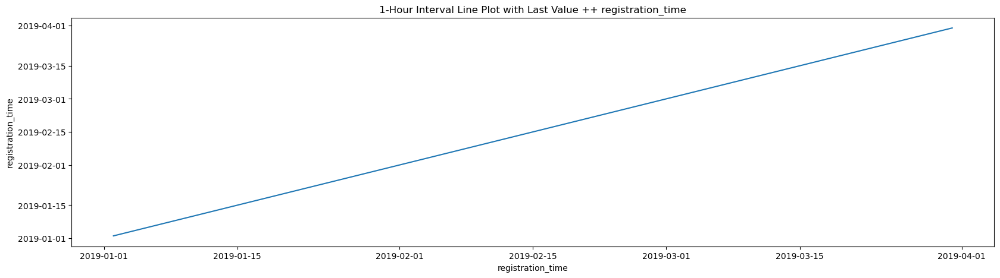

<Figure size 2000x800 with 0 Axes>

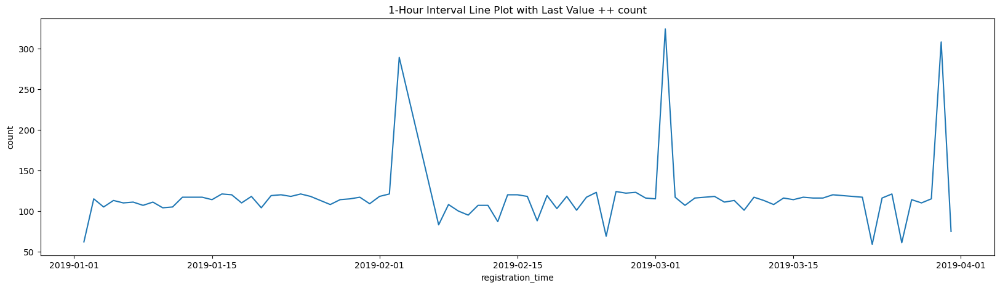

<Figure size 2000x800 with 0 Axes>

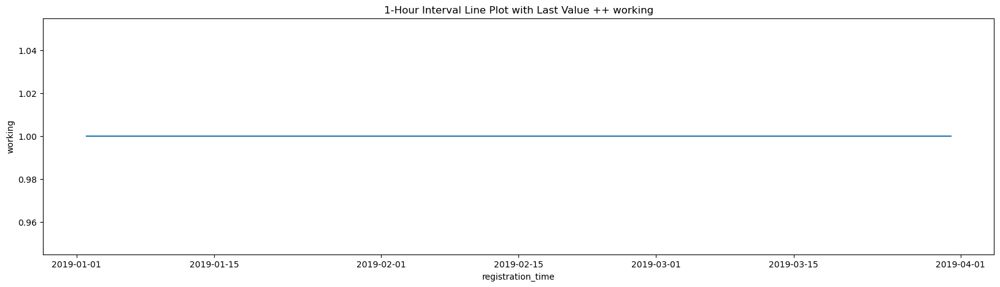

<Figure size 2000x800 with 0 Axes>

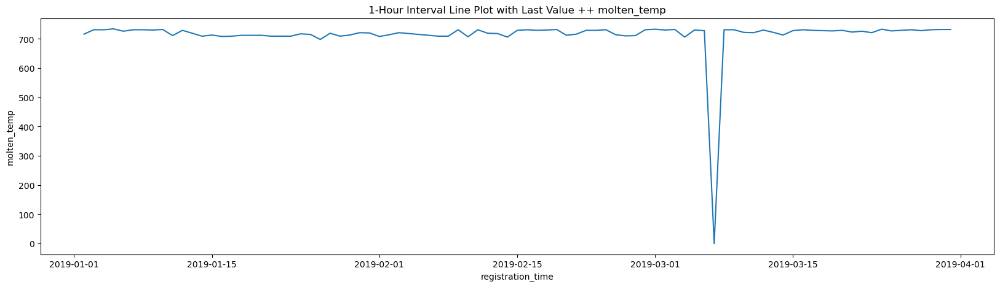

<Figure size 2000x800 with 0 Axes>

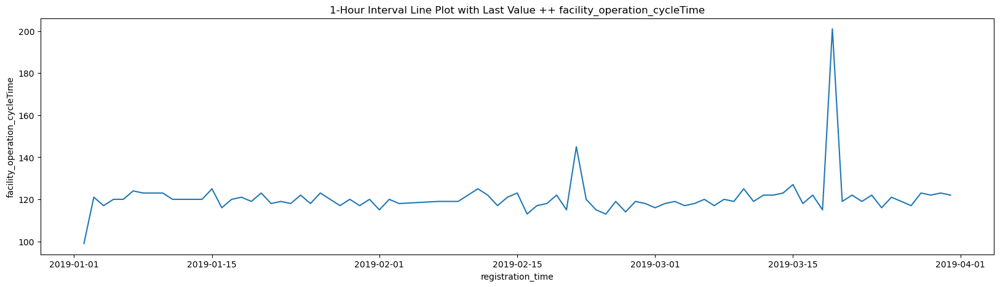

<Figure size 2000x800 with 0 Axes>

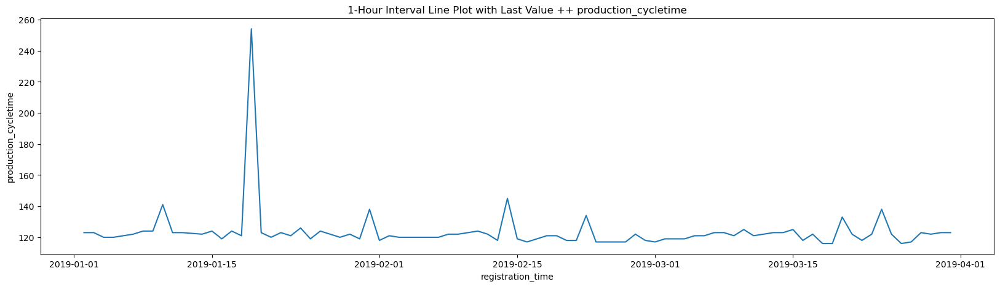

<Figure size 2000x800 with 0 Axes>

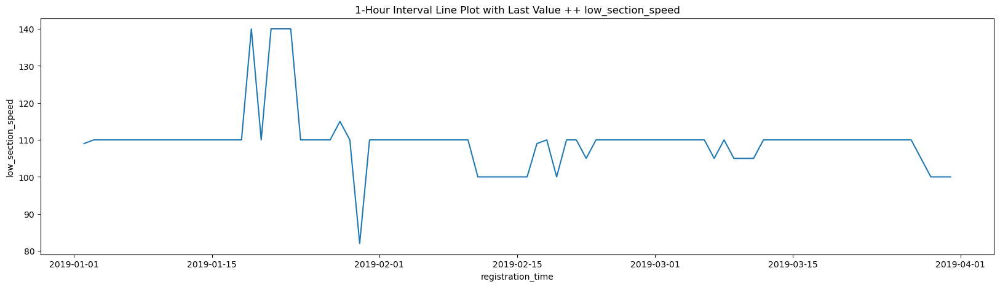

<Figure size 2000x800 with 0 Axes>

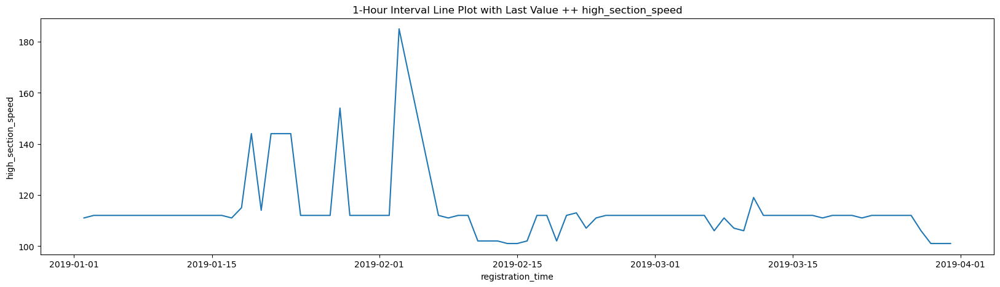

<Figure size 2000x800 with 0 Axes>

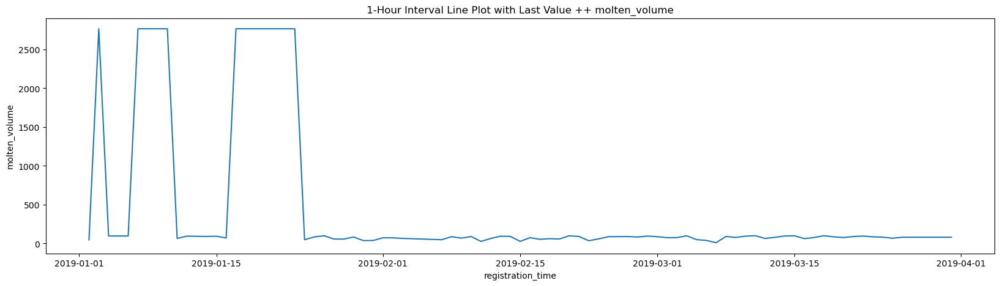

<Figure size 2000x800 with 0 Axes>

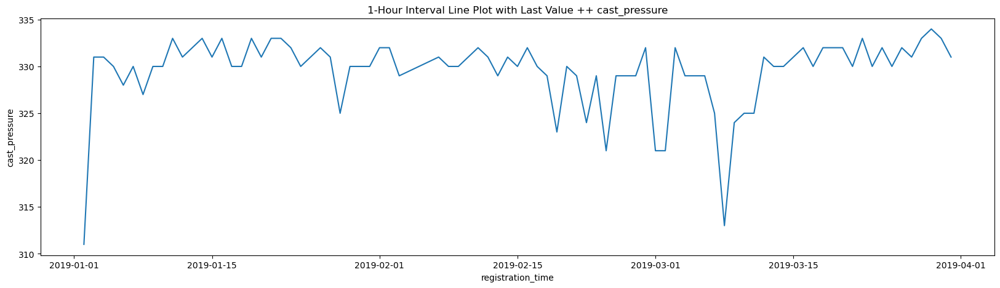

<Figure size 2000x800 with 0 Axes>

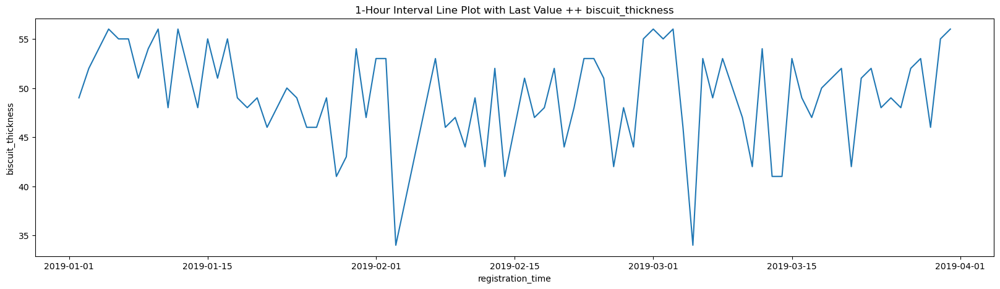

<Figure size 2000x800 with 0 Axes>

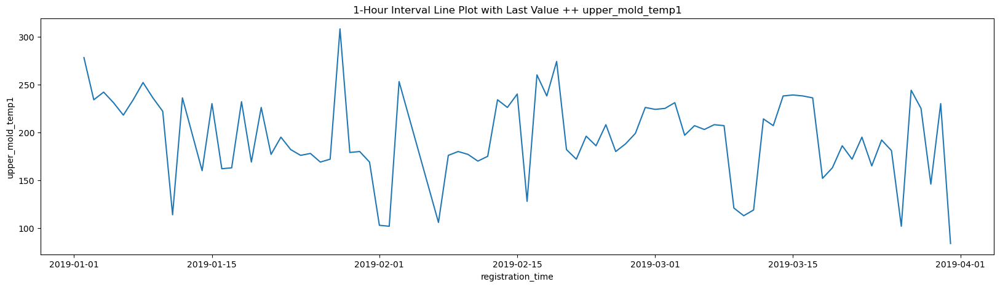

<Figure size 2000x800 with 0 Axes>

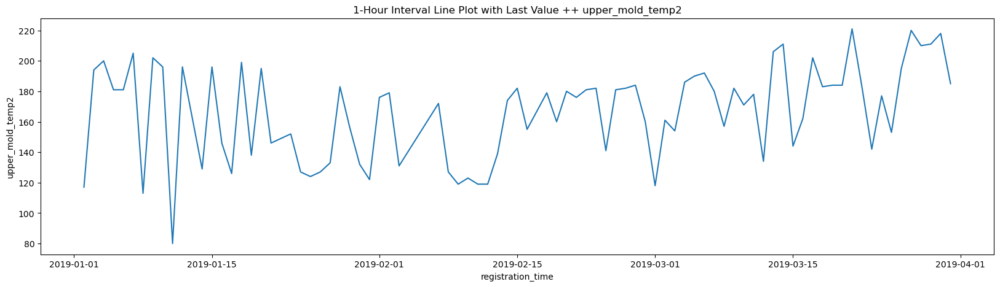

<Figure size 2000x800 with 0 Axes>

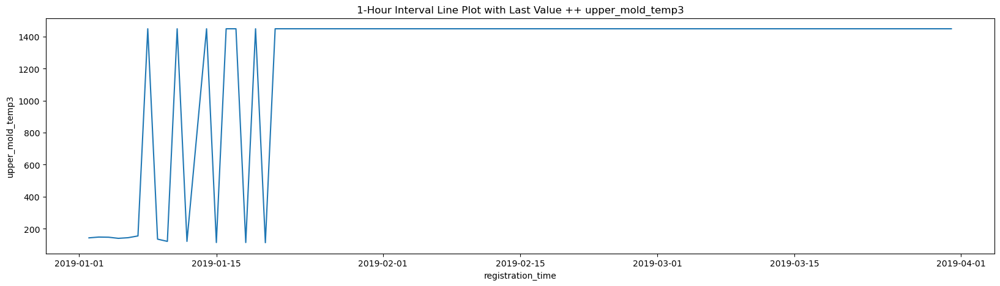

<Figure size 2000x800 with 0 Axes>

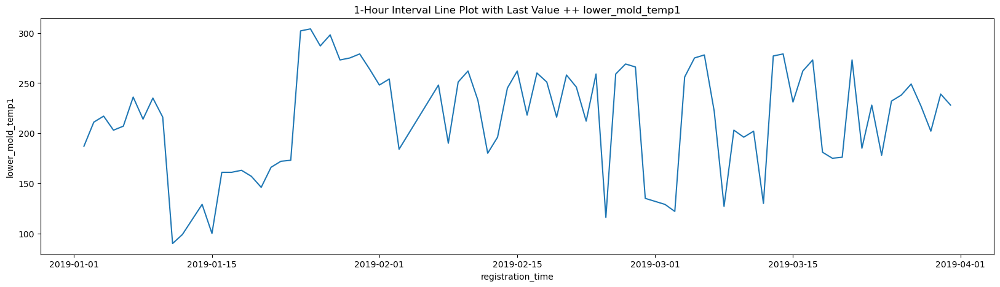

<Figure size 2000x800 with 0 Axes>

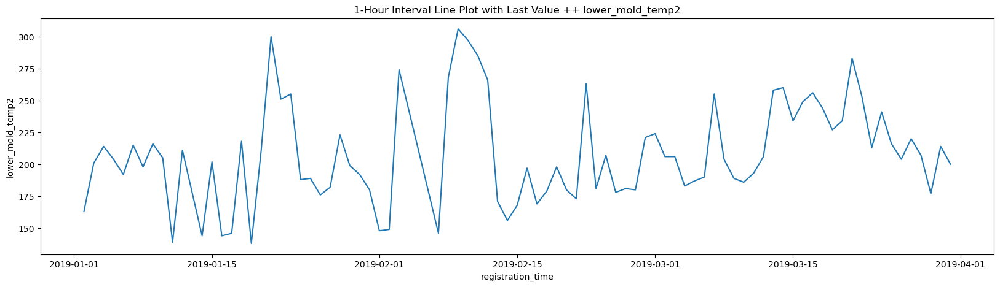

<Figure size 2000x800 with 0 Axes>

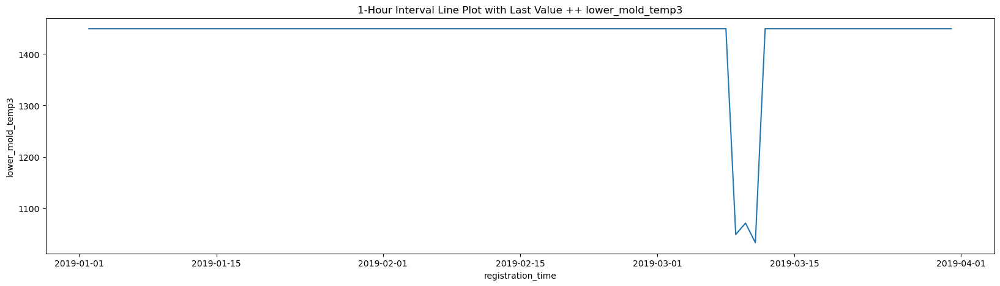

<Figure size 2000x800 with 0 Axes>

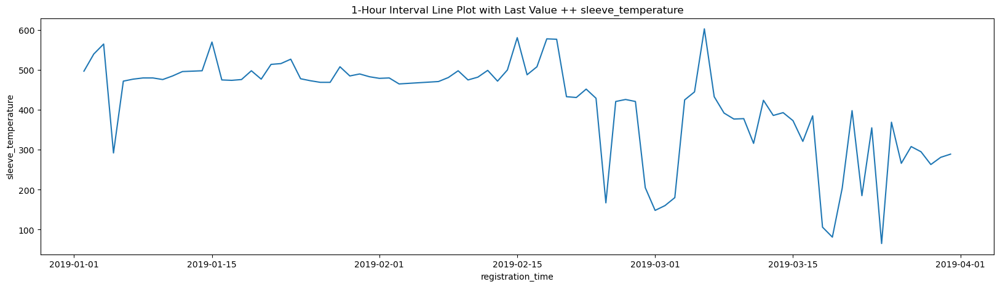

<Figure size 2000x800 with 0 Axes>

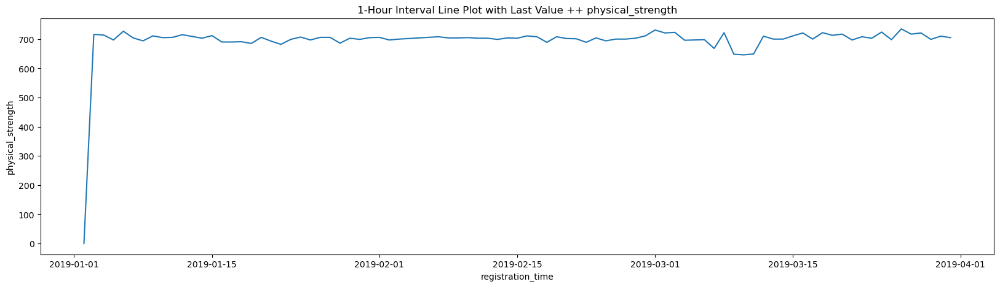

<Figure size 2000x800 with 0 Axes>

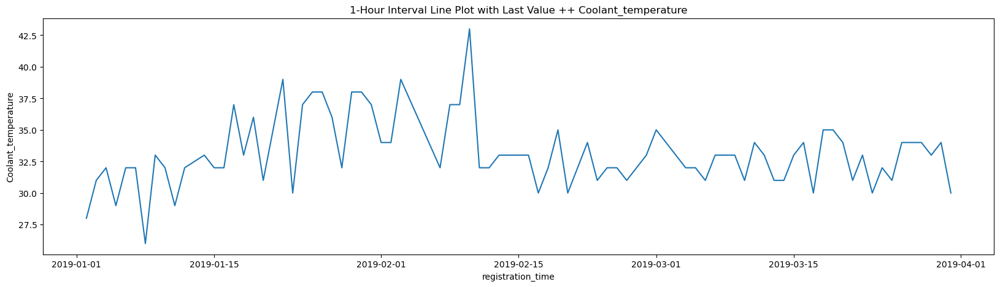

<Figure size 2000x800 with 0 Axes>

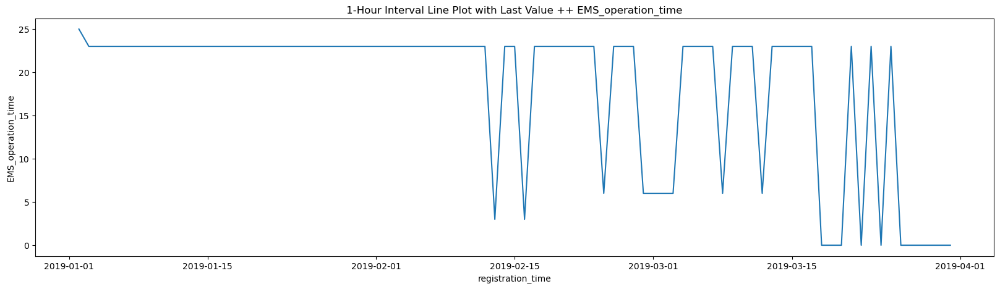

<Figure size 2000x800 with 0 Axes>

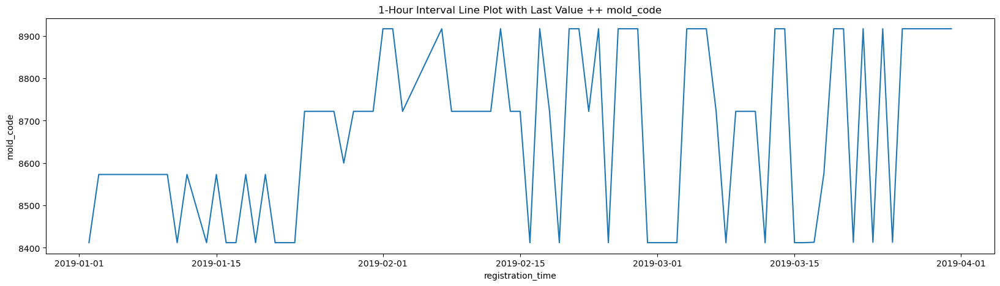

<Figure size 2000x800 with 0 Axes>

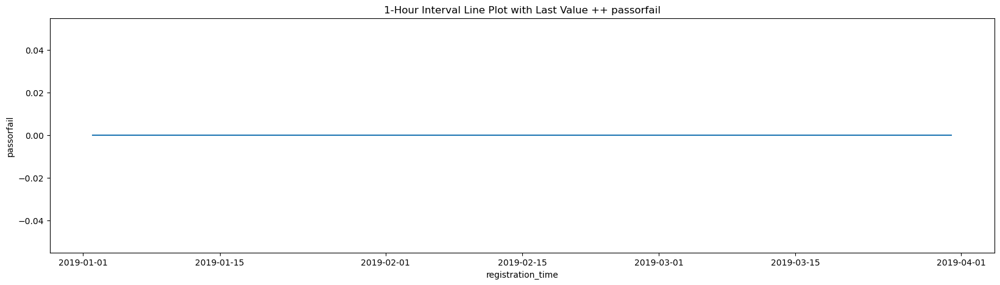

In [29]:
# 하루 간격으로 리샘플링하여 각 시간대의 마지막 값 선택
data_resampled = df_reg.set_index('registration_time').resample('D').last().dropna().reset_index()

for i in df_n.columns:
    plt.figure(figsize=(20, 8))

    # 라인 차트 그리기
    plt.figure(figsize=(20, 5))
    sns.lineplot(data_resampled, x='registration_time', y=i)

    plt.title(f'1-Hour Interval Line Plot with Last Value ++ {i}')
    plt.xlabel('registration_time')
    plt.ylabel(i)
    plt.show()

### 5-1, 마음대로 찍은 날의 데이터 확인

<Figure size 2000x800 with 0 Axes>

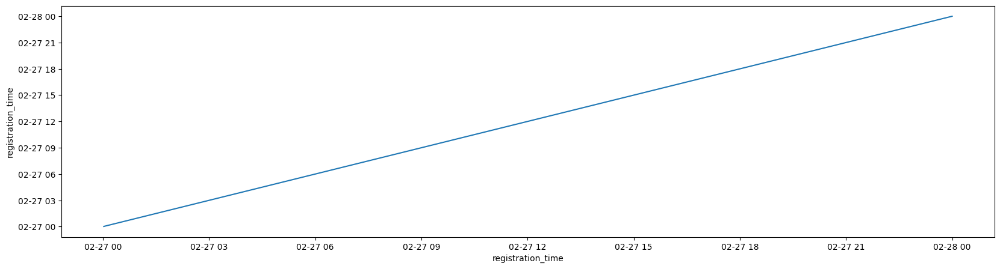

<Figure size 2000x800 with 0 Axes>

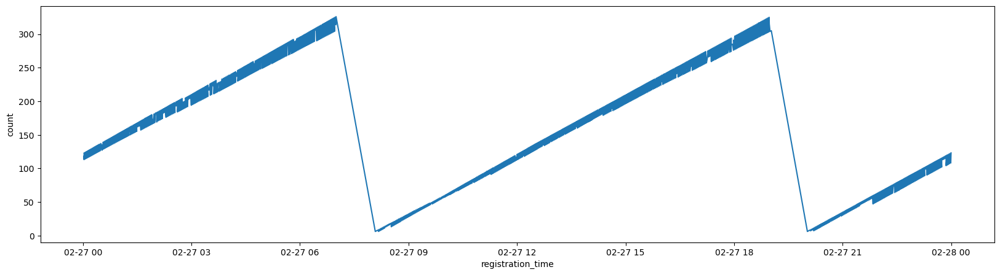

<Figure size 2000x800 with 0 Axes>

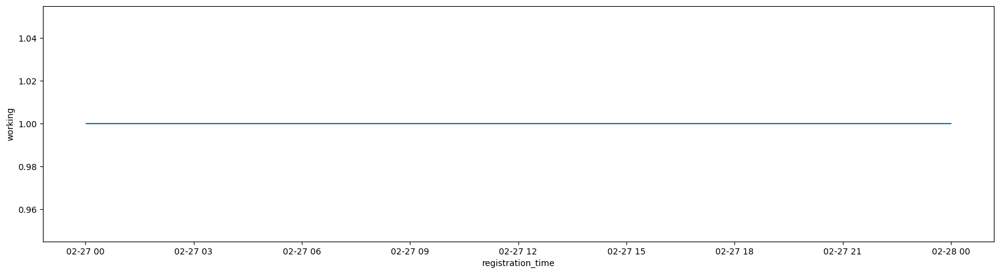

<Figure size 2000x800 with 0 Axes>

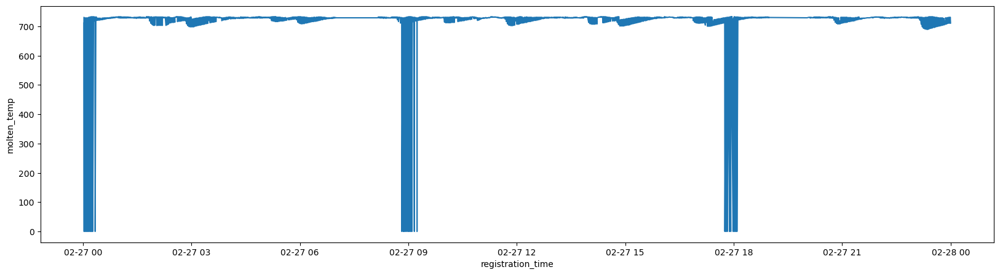

<Figure size 2000x800 with 0 Axes>

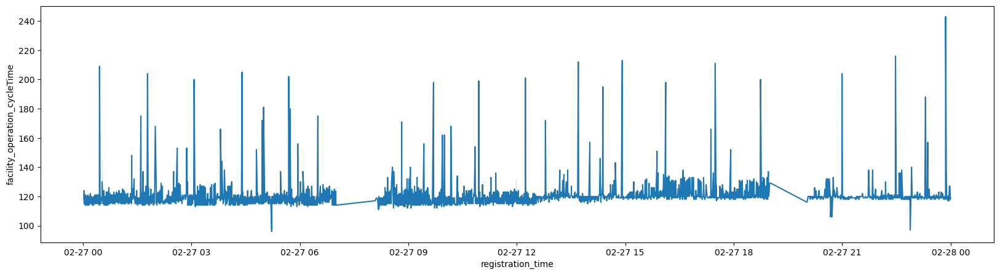

<Figure size 2000x800 with 0 Axes>

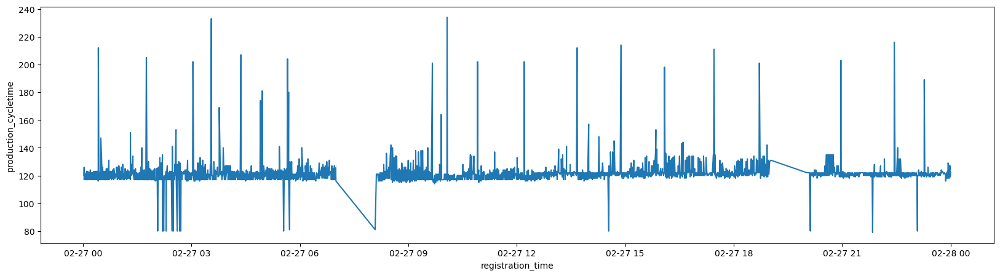

<Figure size 2000x800 with 0 Axes>

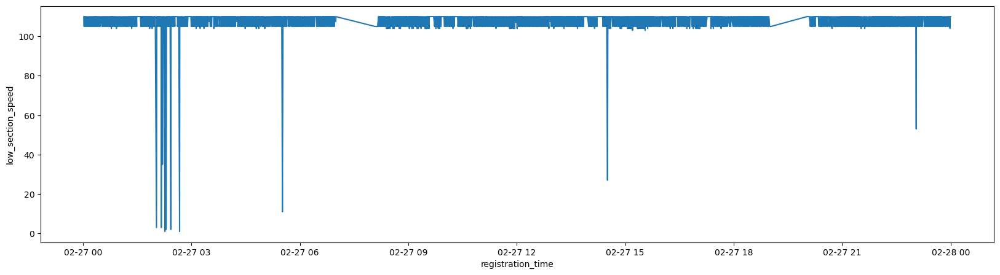

<Figure size 2000x800 with 0 Axes>

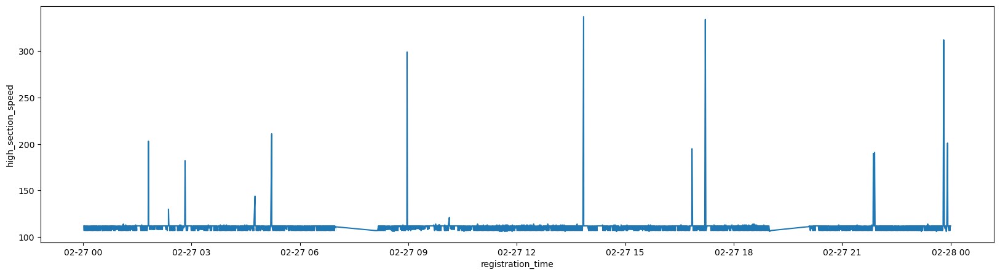

<Figure size 2000x800 with 0 Axes>

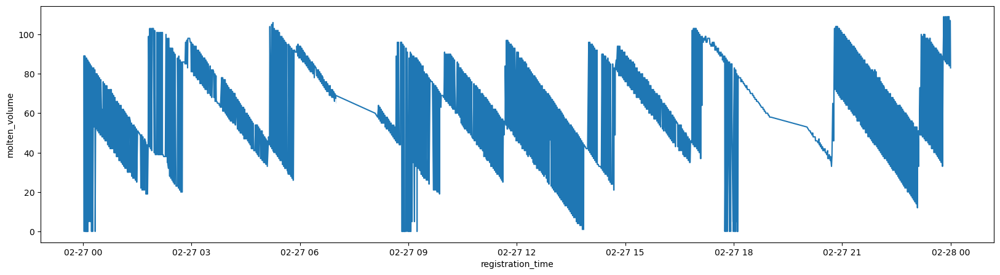

<Figure size 2000x800 with 0 Axes>

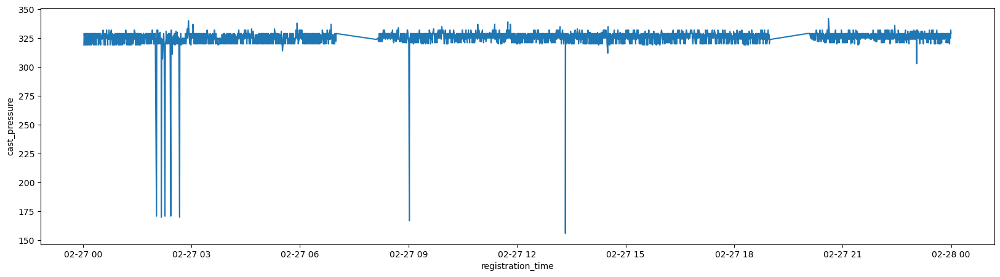

<Figure size 2000x800 with 0 Axes>

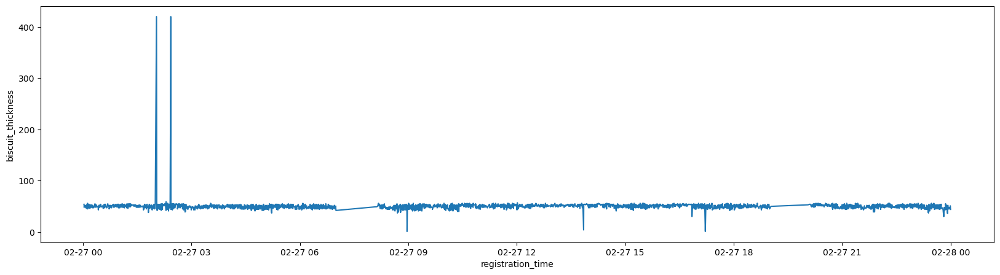

<Figure size 2000x800 with 0 Axes>

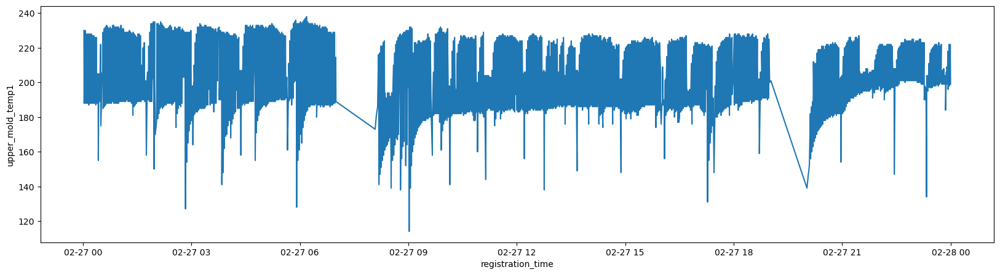

<Figure size 2000x800 with 0 Axes>

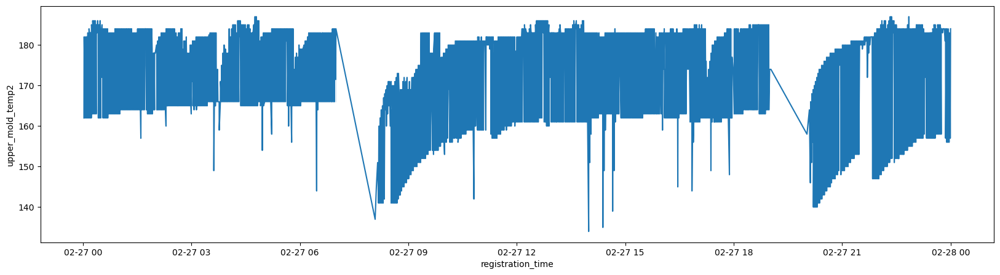

<Figure size 2000x800 with 0 Axes>

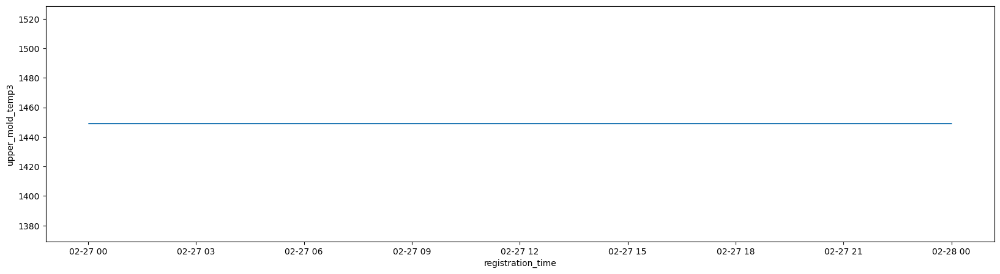

<Figure size 2000x800 with 0 Axes>

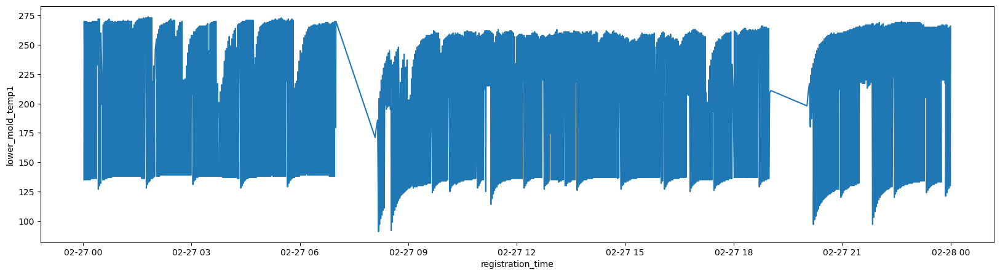

<Figure size 2000x800 with 0 Axes>

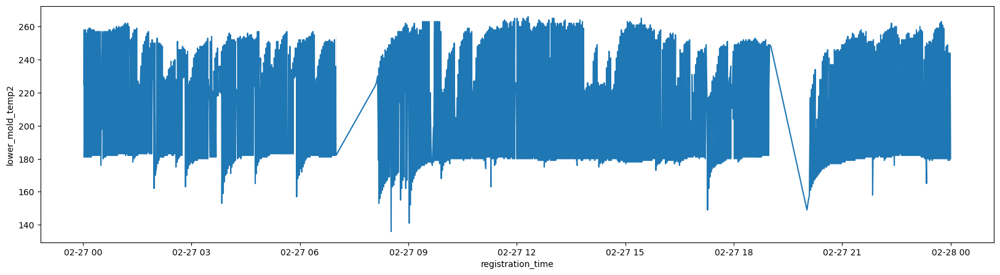

<Figure size 2000x800 with 0 Axes>

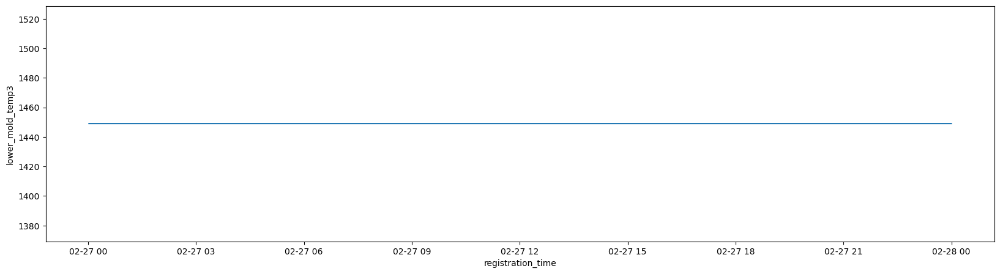

<Figure size 2000x800 with 0 Axes>

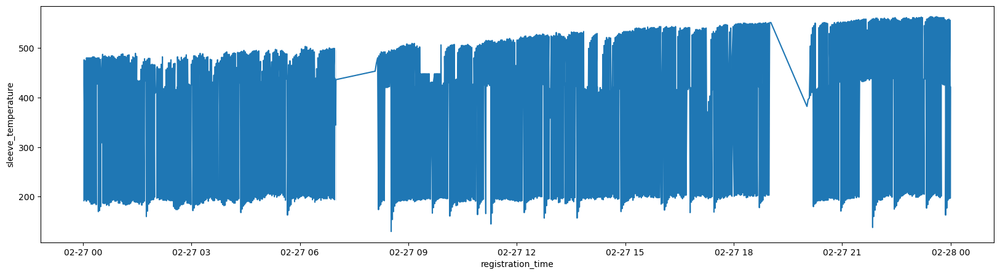

<Figure size 2000x800 with 0 Axes>

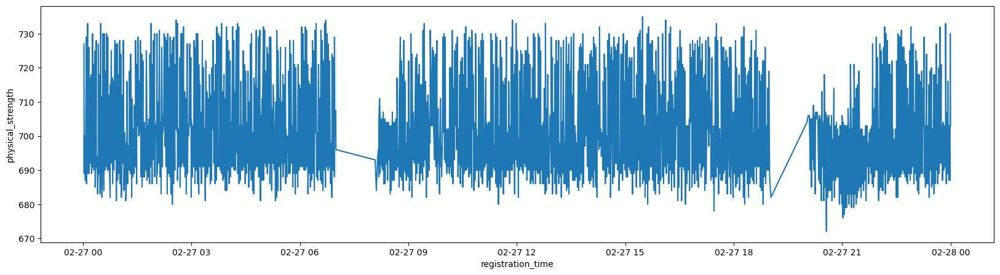

<Figure size 2000x800 with 0 Axes>

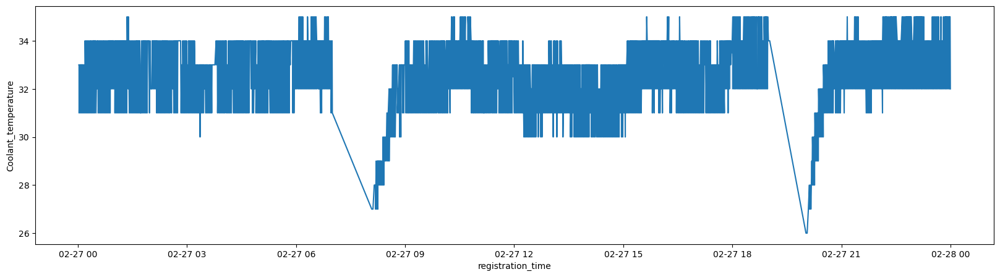

<Figure size 2000x800 with 0 Axes>

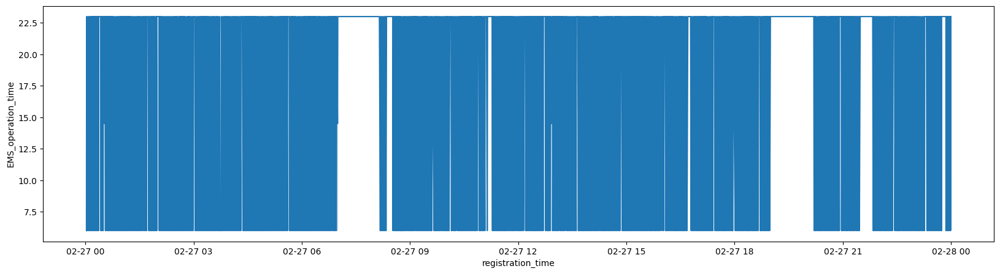

<Figure size 2000x800 with 0 Axes>

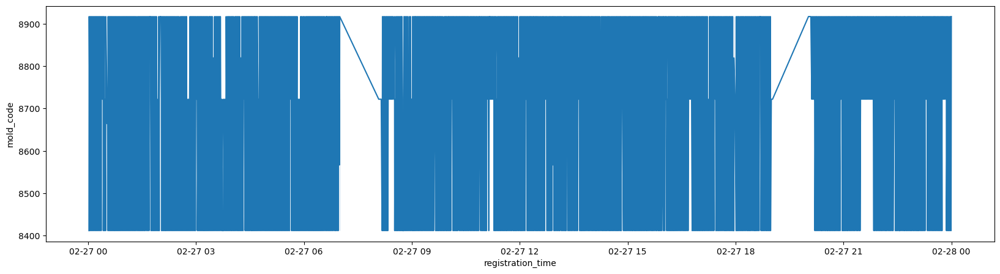

<Figure size 2000x800 with 0 Axes>

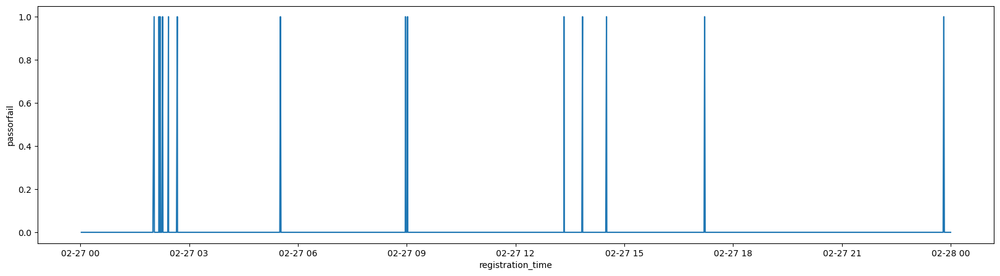

In [30]:
df_resample = df_n[df_n['registration_time'].dt.date == pd.to_datetime('2019-02-27').date()]

for i in df_n.columns:
    plt.figure(figsize=(20, 8))

    # 라인 차트 그리기
    plt.figure(figsize=(20, 5))
    sns.lineplot(data=df_resample, x='registration_time', y=i)
    plt.show()

<Figure size 2000x800 with 0 Axes>

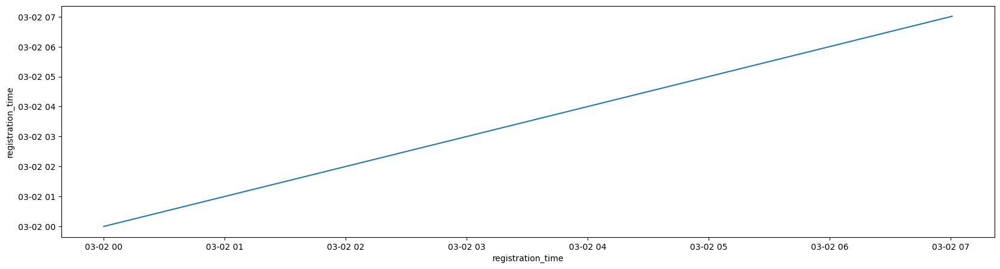

<Figure size 2000x800 with 0 Axes>

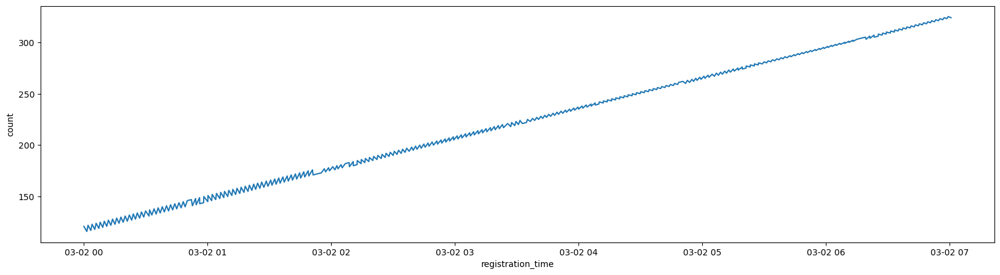

<Figure size 2000x800 with 0 Axes>

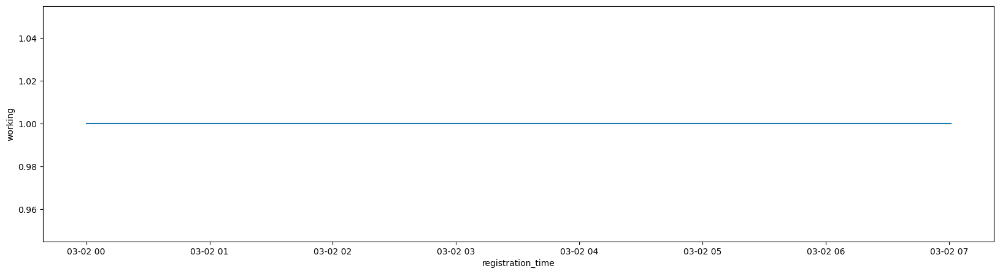

<Figure size 2000x800 with 0 Axes>

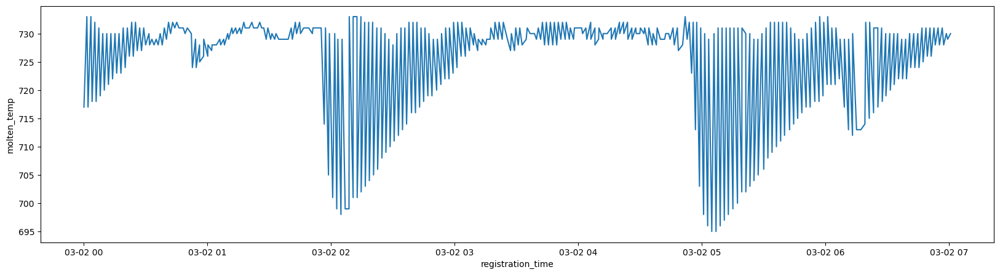

<Figure size 2000x800 with 0 Axes>

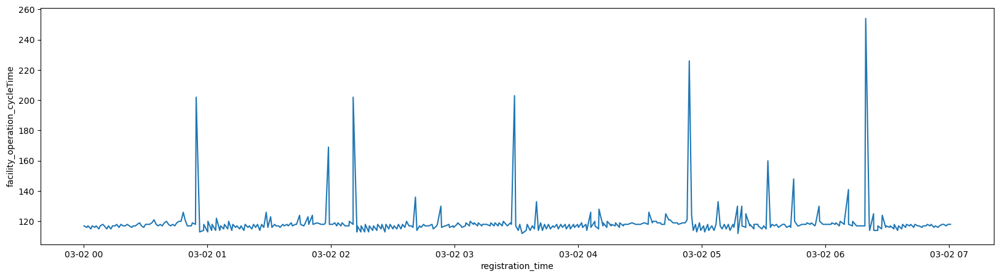

<Figure size 2000x800 with 0 Axes>

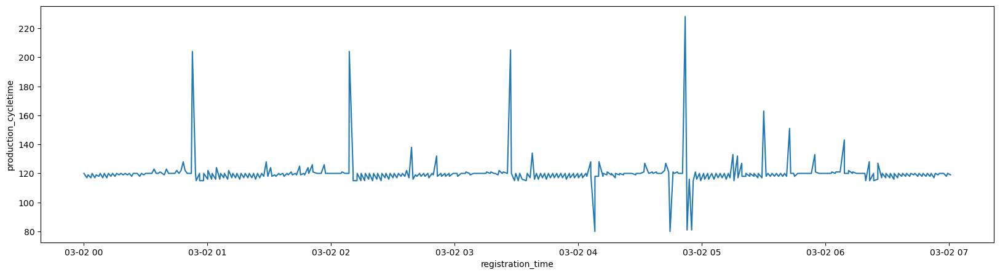

<Figure size 2000x800 with 0 Axes>

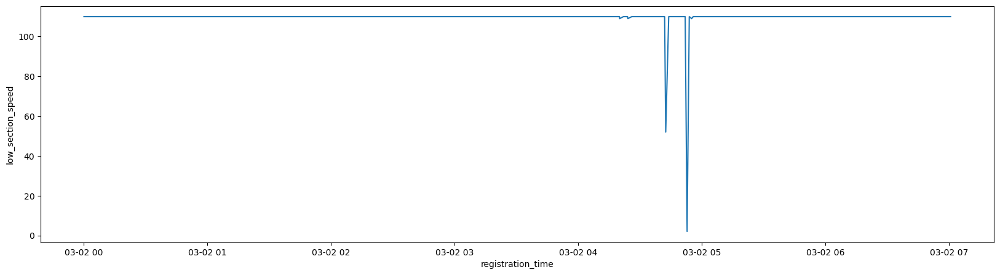

<Figure size 2000x800 with 0 Axes>

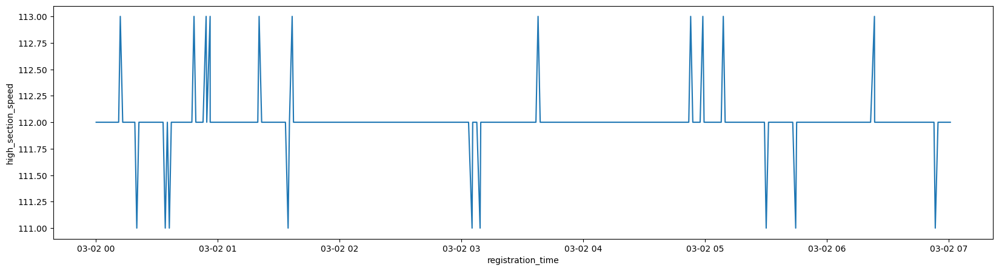

<Figure size 2000x800 with 0 Axes>

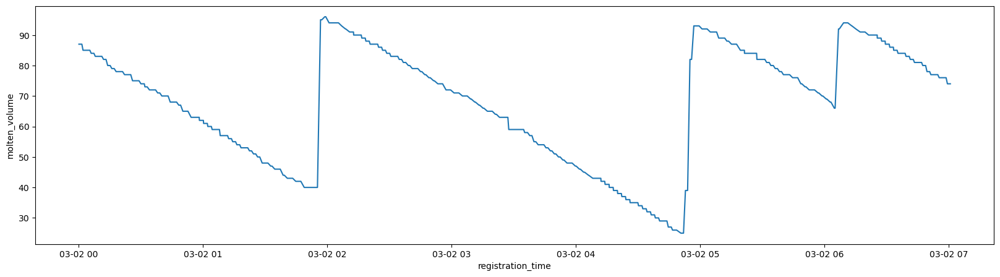

<Figure size 2000x800 with 0 Axes>

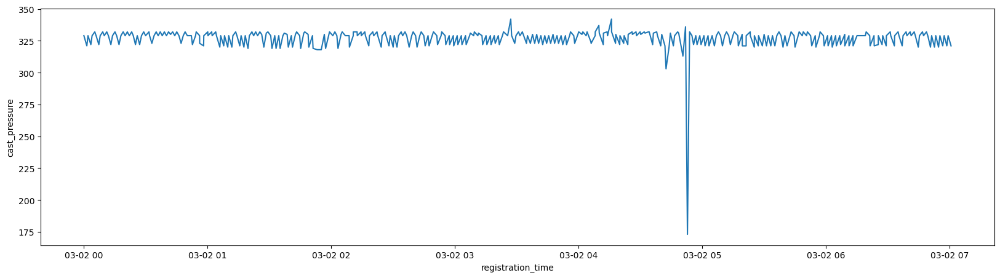

<Figure size 2000x800 with 0 Axes>

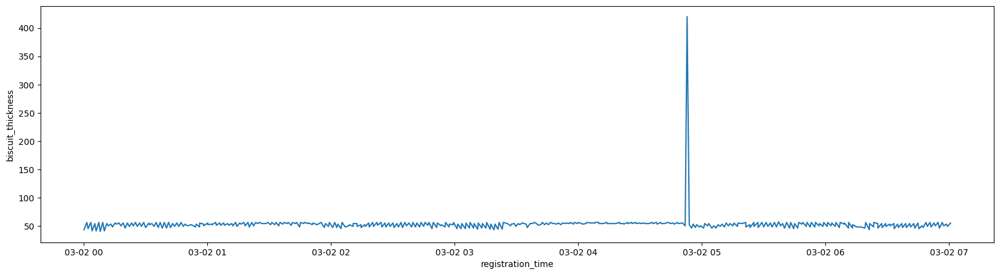

<Figure size 2000x800 with 0 Axes>

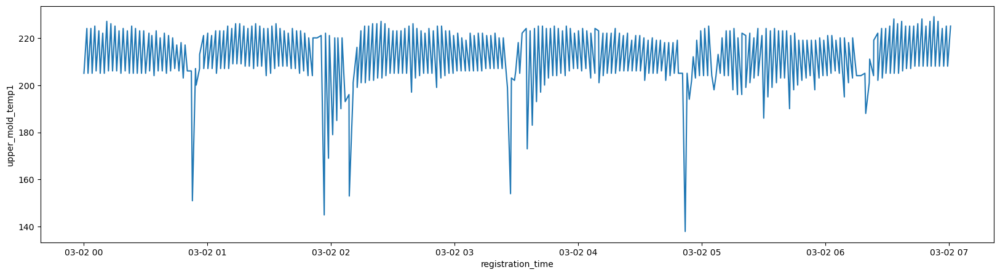

<Figure size 2000x800 with 0 Axes>

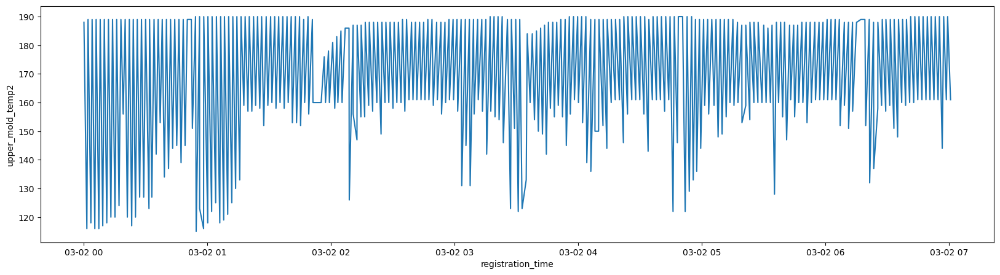

<Figure size 2000x800 with 0 Axes>

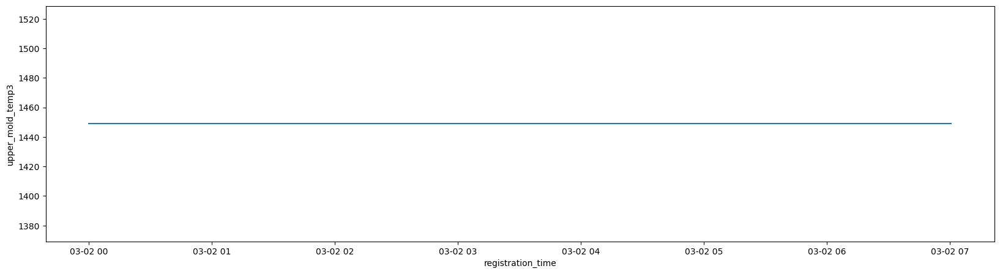

<Figure size 2000x800 with 0 Axes>

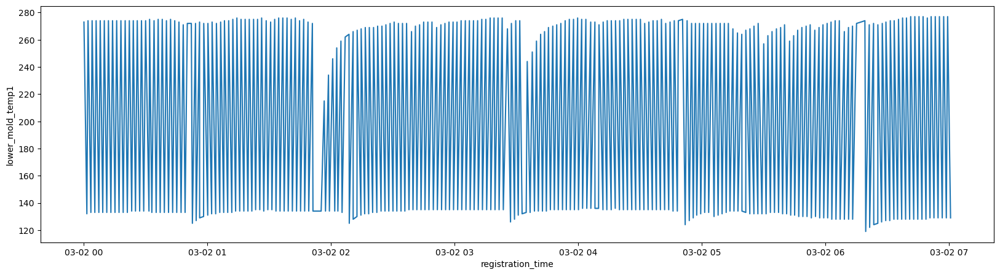

<Figure size 2000x800 with 0 Axes>

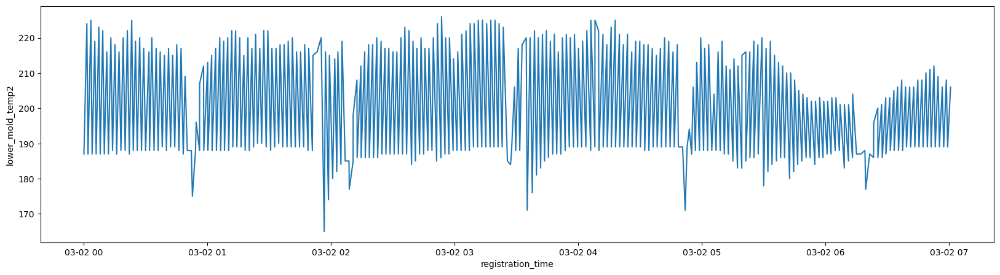

<Figure size 2000x800 with 0 Axes>

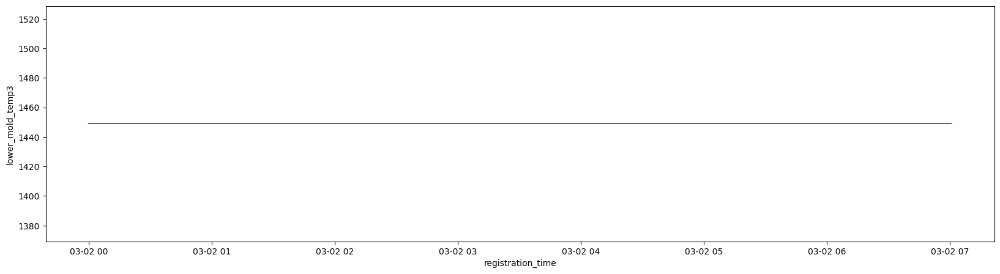

<Figure size 2000x800 with 0 Axes>

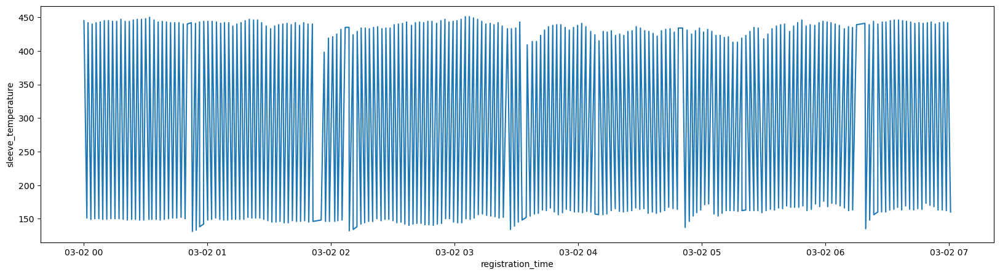

<Figure size 2000x800 with 0 Axes>

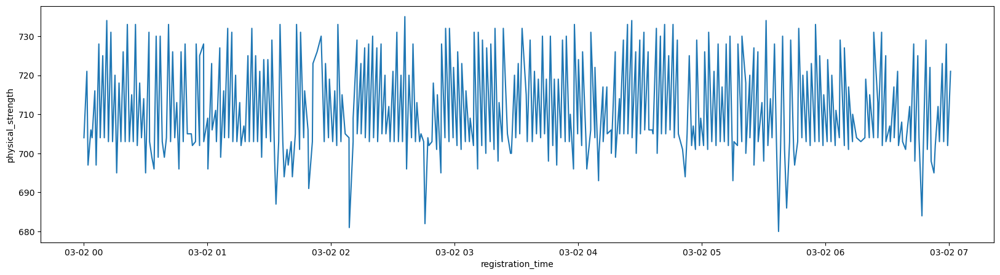

<Figure size 2000x800 with 0 Axes>

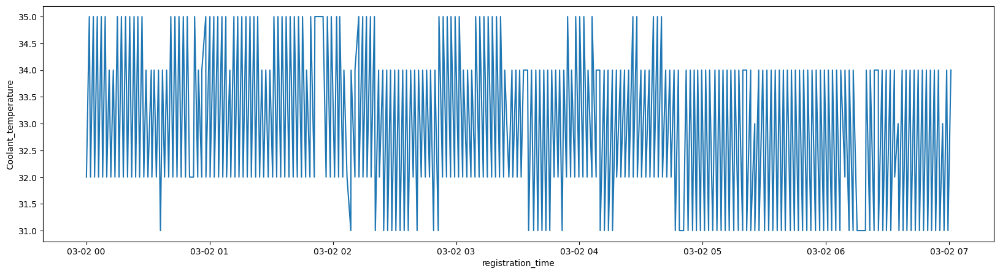

<Figure size 2000x800 with 0 Axes>

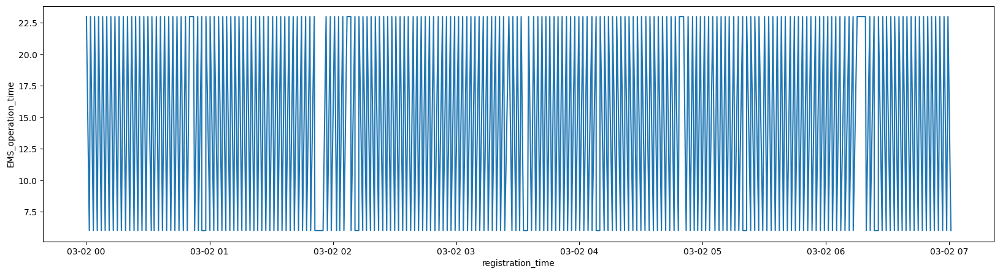

<Figure size 2000x800 with 0 Axes>

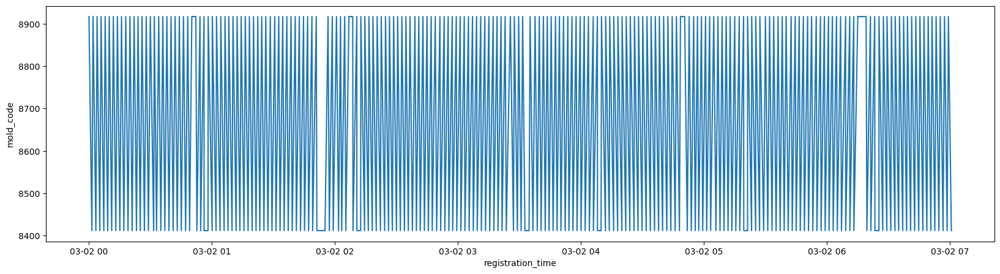

<Figure size 2000x800 with 0 Axes>

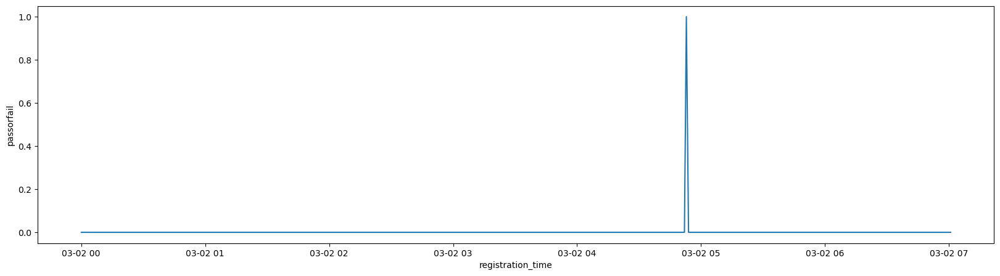

In [31]:
df_resample = df_n[df_n['registration_time'].dt.date == pd.to_datetime('2019-03-02').date()]

for i in df_n.columns:
    plt.figure(figsize=(20, 8))

    # 라인 차트 그리기
    plt.figure(figsize=(20, 5))
    sns.lineplot(data=df_resample, x='registration_time', y=i)
    plt.show()

<Figure size 2000x800 with 0 Axes>

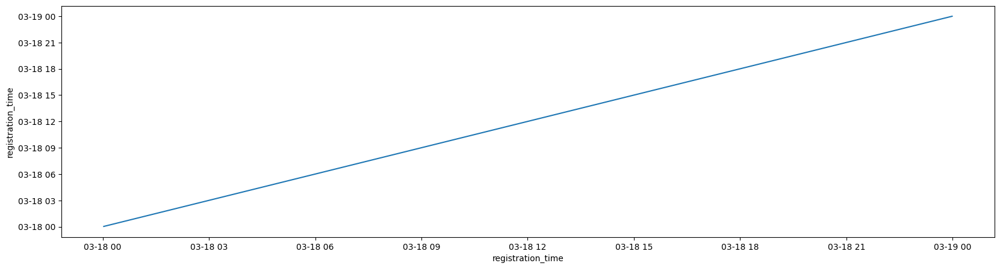

<Figure size 2000x800 with 0 Axes>

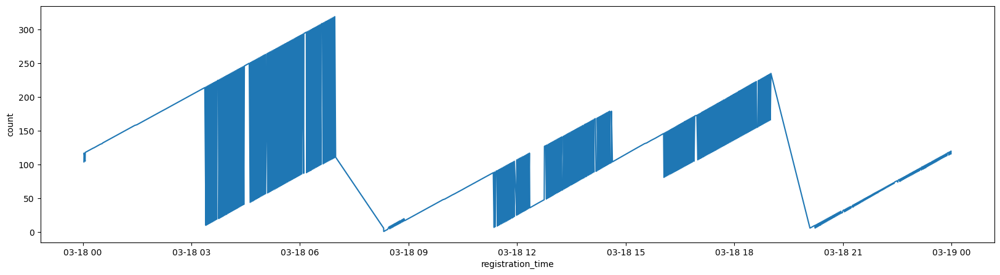

<Figure size 2000x800 with 0 Axes>

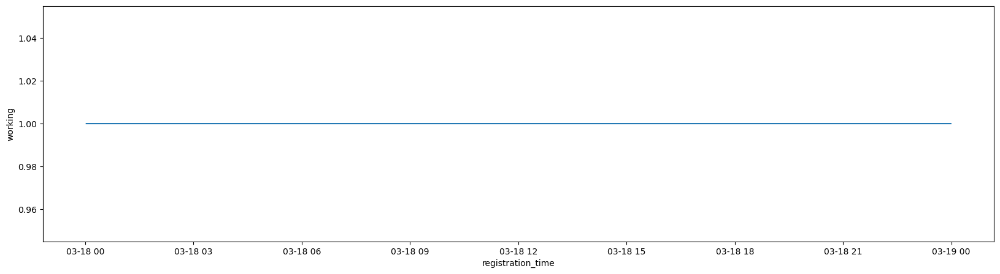

<Figure size 2000x800 with 0 Axes>

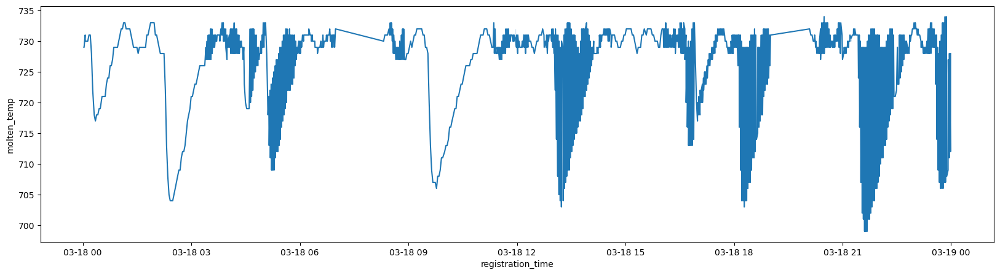

<Figure size 2000x800 with 0 Axes>

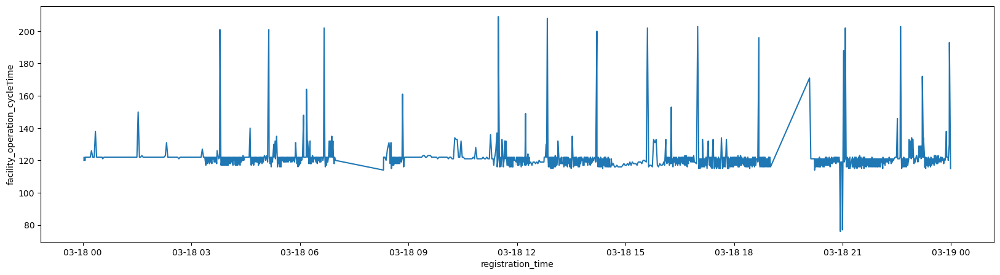

<Figure size 2000x800 with 0 Axes>

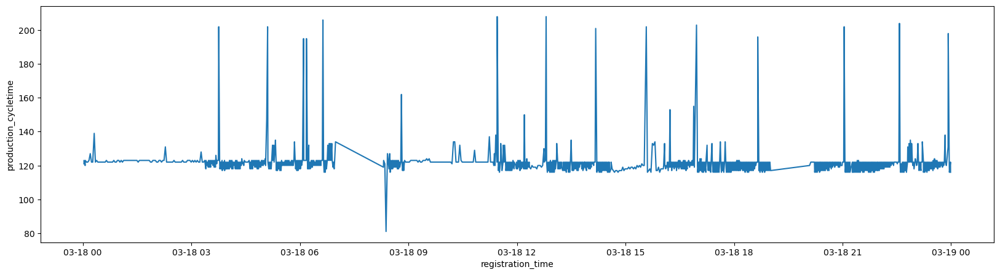

<Figure size 2000x800 with 0 Axes>

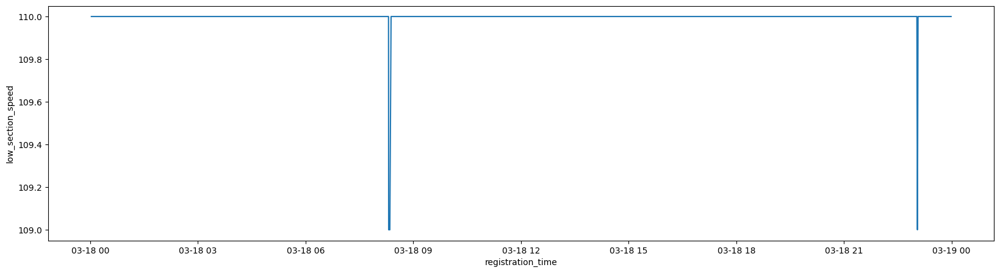

<Figure size 2000x800 with 0 Axes>

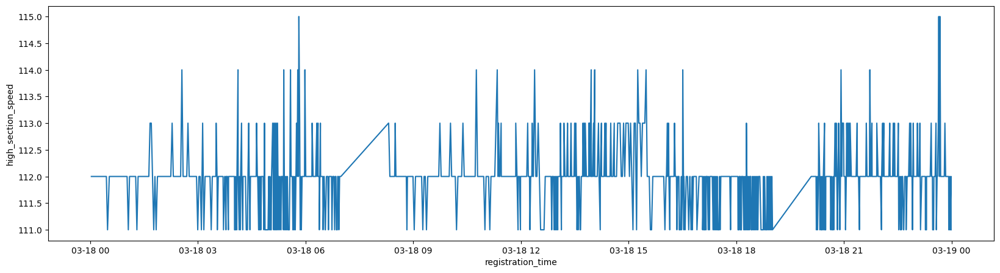

<Figure size 2000x800 with 0 Axes>

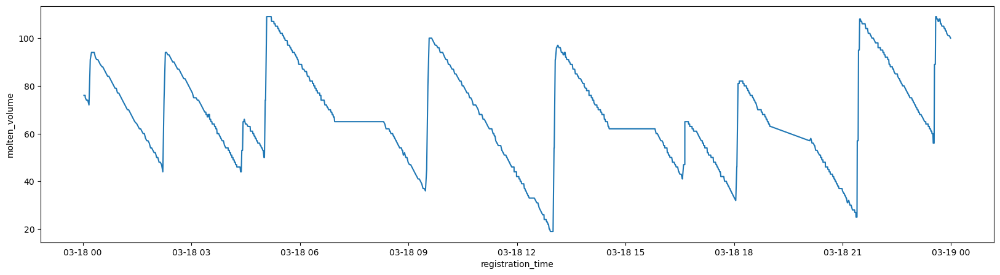

<Figure size 2000x800 with 0 Axes>

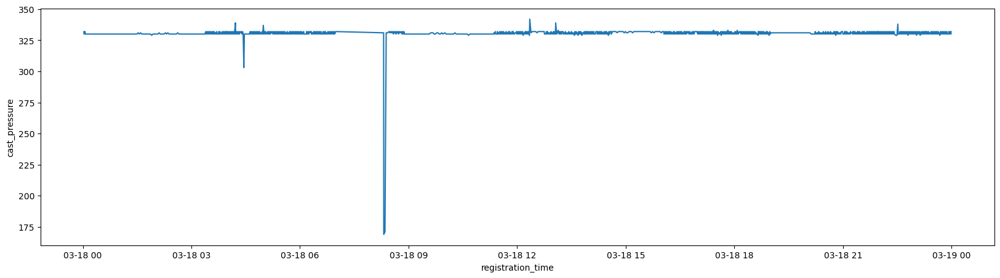

<Figure size 2000x800 with 0 Axes>

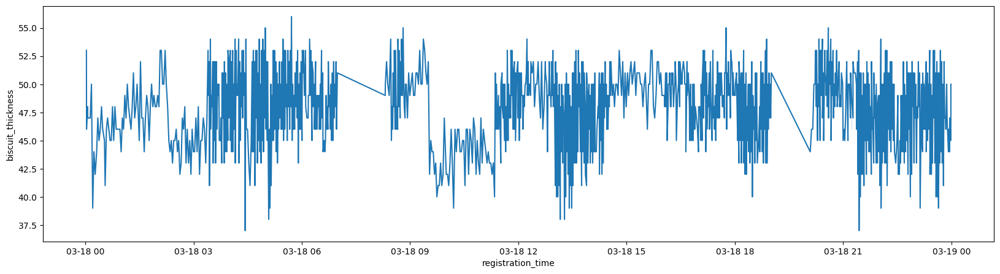

<Figure size 2000x800 with 0 Axes>

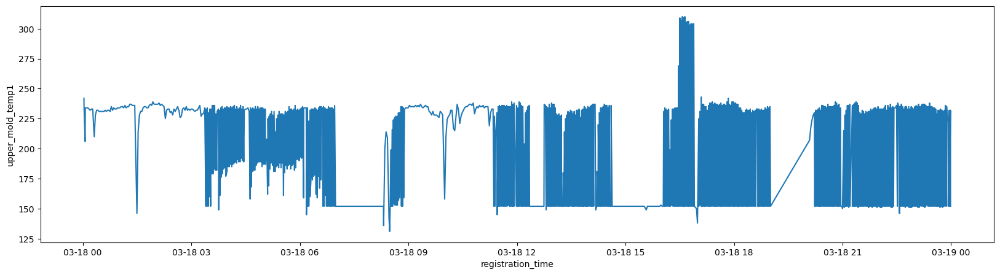

<Figure size 2000x800 with 0 Axes>

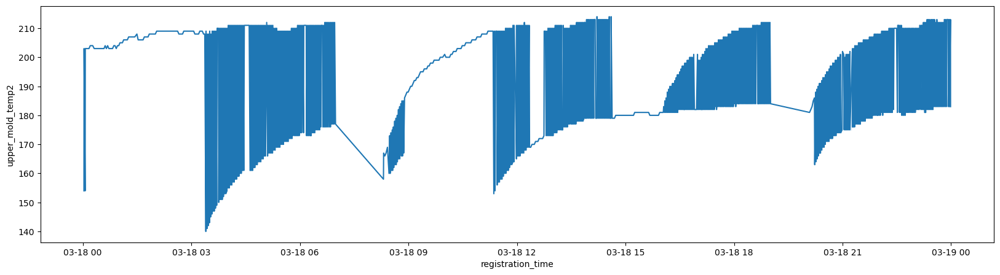

<Figure size 2000x800 with 0 Axes>

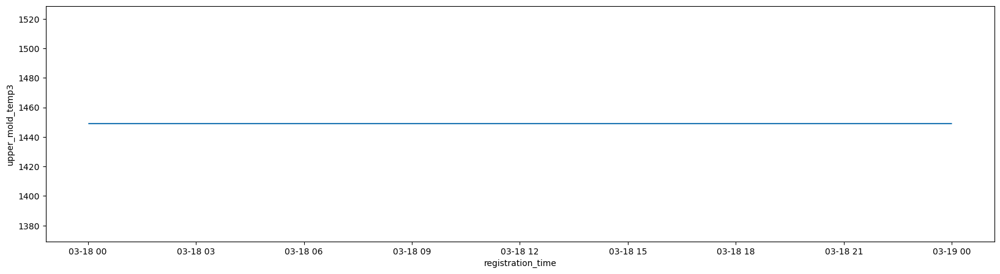

<Figure size 2000x800 with 0 Axes>

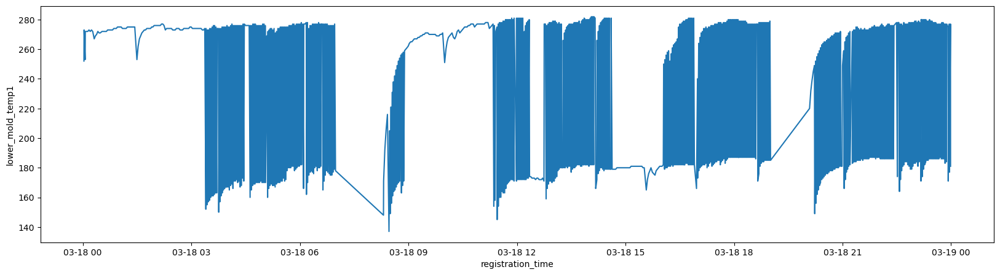

<Figure size 2000x800 with 0 Axes>

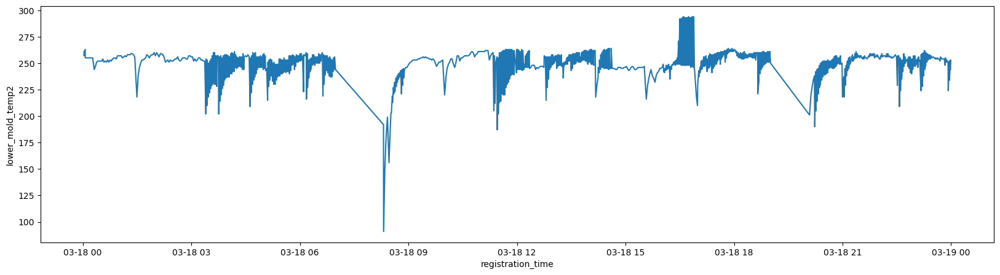

<Figure size 2000x800 with 0 Axes>

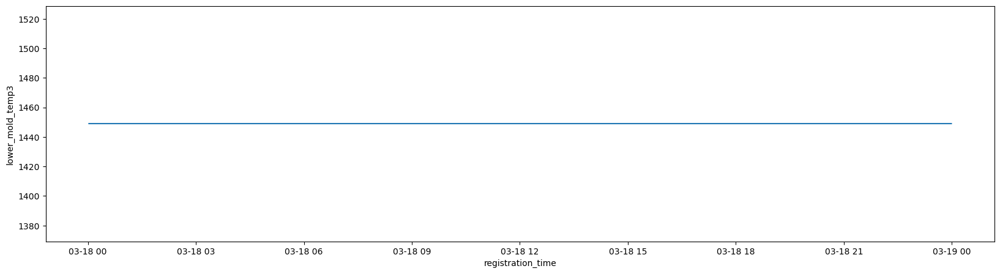

<Figure size 2000x800 with 0 Axes>

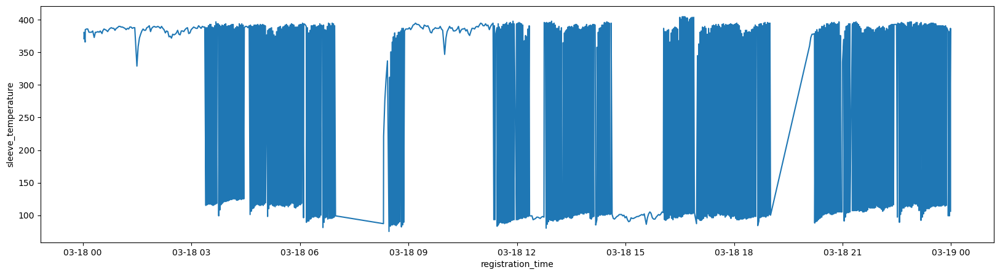

<Figure size 2000x800 with 0 Axes>

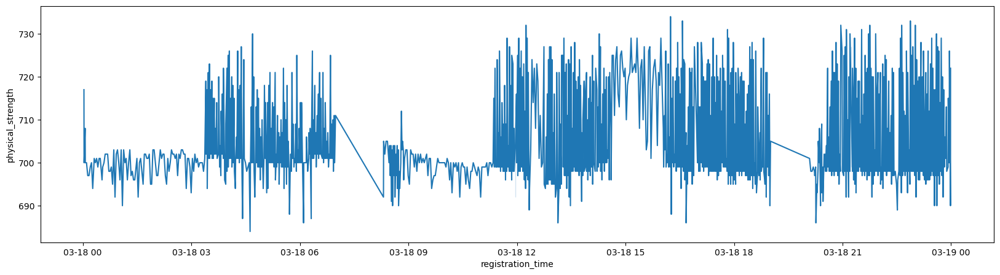

<Figure size 2000x800 with 0 Axes>

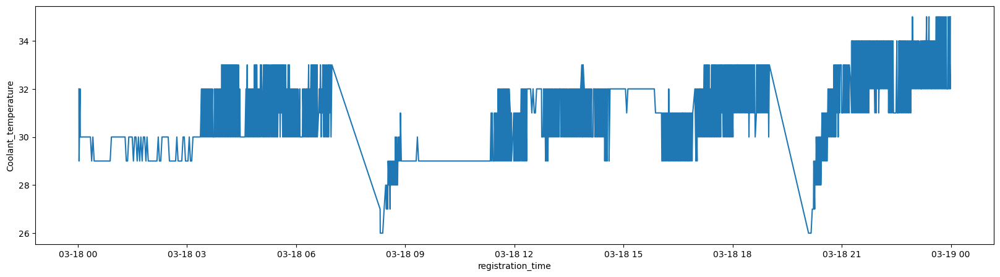

<Figure size 2000x800 with 0 Axes>

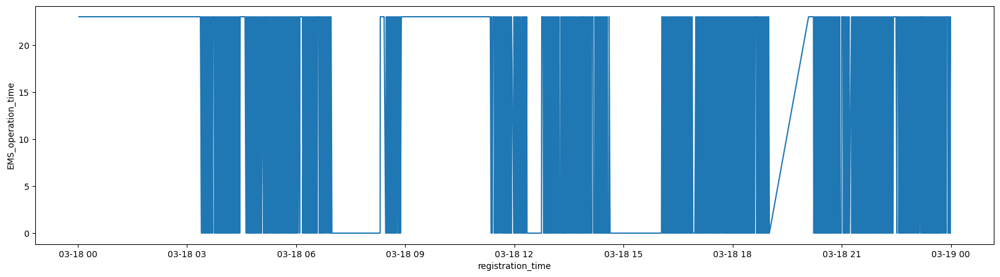

<Figure size 2000x800 with 0 Axes>

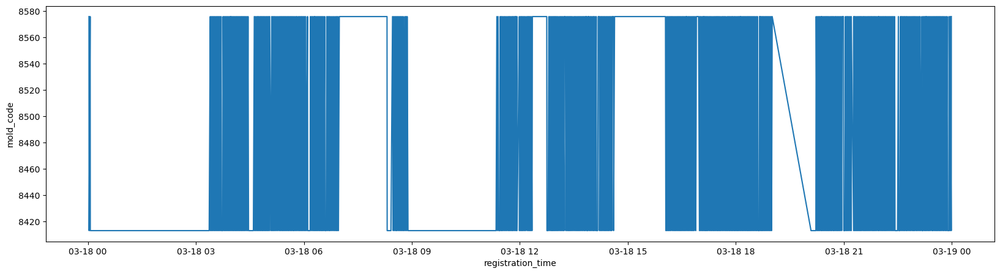

<Figure size 2000x800 with 0 Axes>

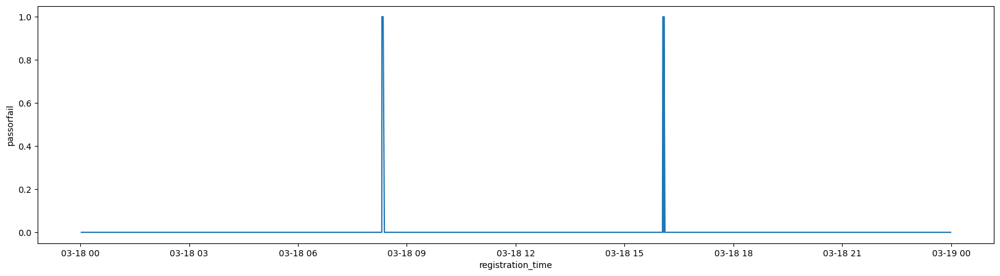

In [32]:
df_resample = df_n[df_n['registration_time'].dt.date == pd.to_datetime('2019-03-18').date()]

for i in df_n.columns:
    plt.figure(figsize=(20, 8))

    # 라인 차트 그리기
    plt.figure(figsize=(20, 5))
    sns.lineplot(data=df_resample, x='registration_time', y=i)
    plt.show()